# Mocs 2 Final Code

In [1]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse.linalg import eigsh
from sklearn.cluster import KMeans
import seaborn as sns
from scipy.sparse import csgraph
import numpy as np
import time
import pandas as pd
from networkx import barabasi_albert_graph
import heapq

from scipy.stats import rankdata
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize



/Users/dannysatterthwaite/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# Discrete Independent Cascade Model Basic Simulation and Plotting Tool
- Not using the simulation techniques from class, just following the literature

In [2]:


def independent_cascade_discrete(G, seed_nodes, activation_probabilities):
    """
        basic independent cascade model for information diffusion
    """
    
    # set active nodes to the seed nodes
    active_nodes = set(seed_nodes)
    newly_active_nodes = set(seed_nodes)
    
    # track edges for which an activation attempt has already been made.
    attempted_edges = set()
    
    # continue until no new activations occur
    while newly_active_nodes:
        # current active nodes, just the seeds to start
        current_newly_active = set(newly_active_nodes)
        # holder for the nodes that will be activated in this step
        # this will be empty at the start
        newly_active_nodes = set()
        # process each node that became active in the previous step
        for v in current_newly_active:
            # try to activate each inactive neighbor in a single step, only get 1 shot to do it
            for w in G.neighbors(v):
                if w not in active_nodes and (v, w) not in attempted_edges:
                    # mark the edge as attempted so that no further tries occur 
                    attempted_edges.add((v, w))
                    edge = (v, w)
                    # get the activation probability for this edge between the node and its neighbor
                    p_v_w = activation_probabilities.get(edge, 0.5)  # Default prob if not specified
                    # try to activate it
                    if random.random() < p_v_w:
                        # add to the set of newly active nodes
                        newly_active_nodes.add(w)
        
        # update active nodes with newly activated ones
        active_nodes.update(newly_active_nodes)
    
    return active_nodes



def visualize_final_state(G, seed_nodes, influenced_nodes):
    """
        visualize seeds and influenced nodes in the final state of the cascade.
    """
    plt.figure(figsize=(10, 8))
    
    pos = nx.spring_layout(G, seed=42)  # Position nodes using spring layout
    
    
    inactive_nodes = set(G.nodes()) - influenced_nodes
    
    # inactive nodes in light gray
    if inactive_nodes:
        nx.draw_networkx_nodes(G, pos, nodelist=inactive_nodes, 
                               node_color='lightgray', label='Inactive')
    
    # draw influenced nodes (excluding seeds) in red
    influenced_only = influenced_nodes - set(seed_nodes)
    if influenced_only:
        nx.draw_networkx_nodes(G, pos, nodelist=influenced_only, 
                               node_color='red', label='Influenced')
    
    #dDraw seed nodes in blue
    nx.draw_networkx_nodes(G, pos, nodelist=seed_nodes, 
                           node_color='blue', label='Seeds')
    
    # edges
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    
    # labels
    nx.draw_networkx_labels(G, pos, font_size=10)
    
    plt.title(f"Information Cascade: {len(influenced_nodes)} nodes activated ({len(seed_nodes)} seeds + {len(influenced_only)} influenced)")
    plt.legend()
    plt.axis('off')
    
    return plt.gcf()



# Core Continuous ICM Version I will use throughout to demonstrate what we have learned in class

In [3]:

# the scheduling
def schedule_one_shot_attempts(event_queue, G, node, activation_probabilities, t, attempted_edges):
    """
    
     Schedules potential activation attempts from a newly activated node to its inactive neighbors
    
    
    """
    # For each neighbor of the newly activated node, schedule an activation attempt
    for neighbor in G.neighbors(node):
        edge = (node, neighbor)
        # Check if the neighbor is inactive and the edge has not been attempted
        # If so, schedule an activation attempt
        if G.nodes[neighbor]['state'] == 'inactive' and edge not in attempted_edges:
            attempted_edges.add(edge)
            # Get the activation probability for this edge
            p = activation_probabilities.get(edge, 0.5)
            # Schedule the activation attempt
            if p > 0:
                # Schedule the activation attempt with an exponential delay just like we saw with SIS and SIR 
                tau = np.random.exponential(scale=1/p)
                # Add the event to the queue
                heapq.heappush(event_queue, (t + tau, node, neighbor))
    return event_queue, attempted_edges



# t max set to double the number of nodes to be safe
def independent_cascade(G, seed_nodes, activation_probabilities, tmax=500):
    """ 

        This implements the main Independent Cascade algorithm

    """
    # Initialize graph
    for node in G.nodes():
        G.nodes[node]['state'] = 'inactive'
    
    # queueu and set up
    event_queue = []
    active_nodes = set()
    attempted_edges = set()
    t = 0

    # Activate seed nodes
    for node in seed_nodes:
        G.nodes[node]['state'] = 'active'
        active_nodes.add(node)
        # schedule activation attempts from seed nodes
        # to their inactive neighbors
        event_queue, attempted_edges = schedule_one_shot_attempts(
            event_queue, G, node, activation_probabilities, t, attempted_edges)

    while event_queue and t < tmax:
        # pop the next event from the queue
        t, source, target = heapq.heappop(event_queue)
        # check if the target node is still inactive
        # and if so, try to activate it
        if G.nodes[target]['state'] == 'inactive':
            p = activation_probabilities.get((source, target), 0.5)
            # if successful, activate the target node
            if random.random() < p:
                G.nodes[target]['state'] = 'active'
                active_nodes.add(target)
                # schedule activation attempts from the newly activated node
                event_queue, attempted_edges = schedule_one_shot_attempts(
                    event_queue, G, target, activation_probabilities, t, attempted_edges)

    return active_nodes


    

# Compare the continuous and discrete appraoches to make sure they are the same

/var/folders/ln/5vd2y_gn2_g8qft7kqsyrp4m0000gn/T/ipykernel_62188/895929248.py:22: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=0, vmax=1)), label='Activation Frequency')


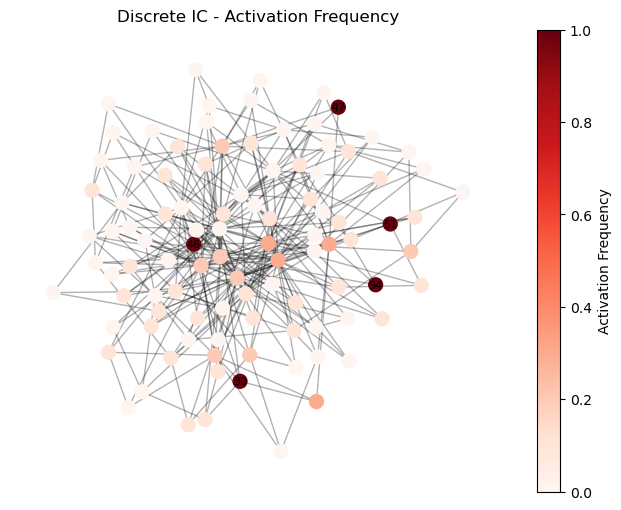

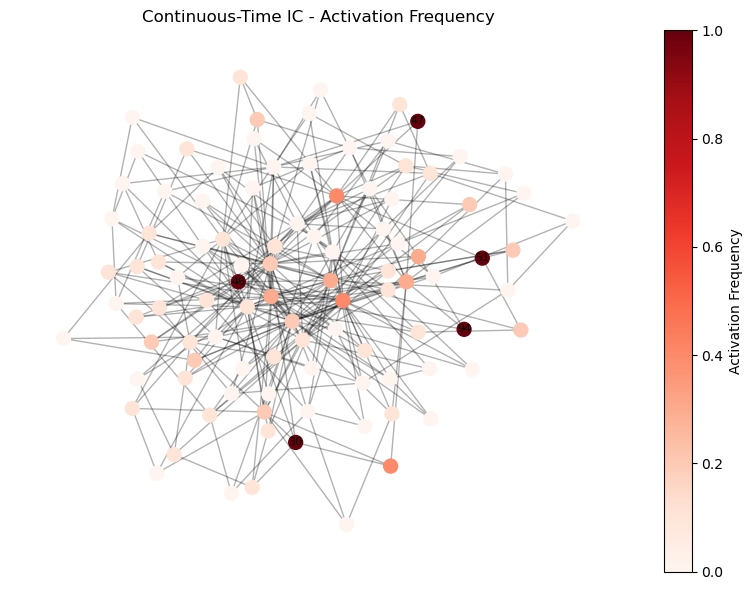

In [4]:



def run_trials(G, seed_nodes, activation_probabilities, ic_func, num_trials=10):
    node_counts = {node: 0 for node in G.nodes()}

    for _ in range(num_trials):
        active_nodes = ic_func(G, seed_nodes, activation_probabilities)
        for node in active_nodes:
            node_counts[node] += 1

    # Normalize to percentages
    activation_percentages = {node: count / num_trials for node, count in node_counts.items()}
    return activation_percentages

def visualize_activation(G, seed_nodes, activation_percentages, title):
    node_colors = [activation_percentages[node] for node in G.nodes()]
    pos = nx.spring_layout(G, seed=42)

    plt.figure(figsize=(8, 6))
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap='Reds', vmin=0, vmax=1, node_size=100)
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    nx.draw_networkx_labels(G, pos, labels={node: node for node in seed_nodes}, font_color="black", font_size=8)
    plt.title(title)
    plt.colorbar(plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=0, vmax=1)), label='Activation Frequency')
    plt.axis('off')

def main():
    G = nx.barabasi_albert_graph(100, 3, seed=42)
    seed_nodes = random.sample(list(G.nodes()), 5)
    
    # Set activation probabilities
    activation_probabilities = {}
    base_probability = 0.1
    for u, v in G.edges():
        activation_probabilities[(u, v)] = base_probability
        activation_probabilities[(v, u)] = base_probability 

    # Run 10 trials and collect activation frequencies
    activation_discrete = run_trials(G, seed_nodes, activation_probabilities, independent_cascade, num_trials=10)
    activation_continuous = run_trials(G, seed_nodes, activation_probabilities, independent_cascade_discrete, num_trials=10)

    # Visualize
    visualize_activation(G, seed_nodes, activation_discrete, "Discrete IC - Activation Frequency")
    visualize_activation(G, seed_nodes, activation_continuous, "Continuous-Time IC - Activation Frequency")
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

# Greedy (IM-CP-G)

In [5]:

def find_optimal_seeds(G, k, activation_probabilities, num_simulations=100):
    """
    Greedy algorithm to find the optimal k seed nodes for maximizing influence.

    """
    optimal_seeds = []
    remaining_nodes = set(G.nodes())
    
    for _ in range(k):
        best_node = None
        best_spread = 0
        
        # evaluate each candidate node
        for candidate in remaining_nodes:
            # current seed set plus this candidate
            seed_set = optimal_seeds + [candidate]
            
            # estimate spread by running multiple simulations ... the monte carlo part
            spread_sum = 0
            for _ in range(num_simulations):
                final_active = independent_cascade(G, seed_set, activation_probabilities)
                spread_sum += len(final_active)
            avg_spread = spread_sum / num_simulations
            
            # update best node if this candidate gives better spread
            if avg_spread > best_spread:
                best_spread = avg_spread
                best_node = candidate
        
        # Add the best node to our seed set
        optimal_seeds.append(best_node)
        remaining_nodes.remove(best_node)
       # print(f"Selected node {best_node}, expected spread: {best_spread:.2f}")
    
    return optimal_seeds

# Message Passing Percolation

In [6]:
def compute_not_in_giant_component_probabilities(graph, activation_probabilities, iterations=500, tolerance=1e-6):
    """
    Implements the message passing update equations (4) and (5) from percolation theory,
    computing μ_i and μ_{i<-j} iteratively.

    Args:
        graph (nx.Graph): NetworkX graph
        percolation_probability (float): Bond percolation probability (p)
        iterations (int): Max number of iterations
        tolerance (float): Convergence threshold


    """
    nodes = list(graph.nodes())
    
    # Initialize messages: from j to i 
    #probability j is NOT in the GC when i is removed
    mu_from = {
        (j, i): 0.25 # quite sensitive but 0.3 seems to work
        for i in nodes
        for j in graph.neighbors(i)
    }

    mu = {i: 0.5 for i in nodes} #marginal probability that node i is not in GC... asssume 50/50 shot of being in the GC
    
    for iter_count in range(iterations):
        previous_mu = mu.copy()
        updated_mu_from = mu_from.copy()

        # Update messages using Eq (5)
        for (j, i) in mu_from:
            product = 1.0
            for k in graph.neighbors(j):
                if k != i:
                    msg = mu_from.get((k, j), 0.5)
                    #percolation-adjusted message: (1 - p + p * μ_{j k})
                    p_jk = activation_probabilities.get((j, k), 0.5)
                    product *= (1 - p_jk + p_jk * msg)
                    #term = 1 - percolation_probability + percolation_probability * msg
                    #product *= term
            # update message
            updated_mu_from[(j, i)] = product

        # Update node marginals using Eq (4)
        for i in nodes:
            product = 1.0
            for j in graph.neighbors(i):
                msg = updated_mu_from.get((j, i), 0.5)
                p_ji = activation_probabilities.get((j, i), 0.5)
                product *= (1 - p_ji + p_ji * msg)
                #percolation-adjusted message for μ_{i}
                #term = 1 - percolation_probability + percolation_probability * msg
                #product *= term
            mu[i] = product

        # Check for convergence
        max_diff = max(abs(mu[node] - previous_mu[node]) for node in nodes)
        if max_diff < tolerance:
            break
    else:
        print(f"Did not converge within {iterations} iterations.")
    return mu

In [7]:
# plot the nodes and their probs
def plot_graph(G, mu_values=None, seed_nodes=None):
    pos = nx.spring_layout(G, seed=42)
    
    if mu_values is not None:
        cmap = plt.cm.viridis
        #node_color = [mu_values[node] for node in G.nodes()]
        node_color = [round(mu_values[node], 2) for node in G.nodes()]
        nodes = nx.draw_networkx_nodes(G, pos, node_color=node_color, cmap=cmap)
        nx.draw_networkx_edges(G, pos)
        nx.draw_networkx_labels(G, pos)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(mu_values.values()), 
                                                                 vmax=max(mu_values.values())))
        sm.set_array([])
        plt.colorbar(sm, label="mu (Prob NOT in GC)")
        
        if seed_nodes is not None:
            nx.draw_networkx_nodes(
                G, pos,
                nodelist=seed_nodes,
                node_color="none",
                edgecolors="red",
                node_size=800,
                linewidths=2
            )
    else:
        nx.draw(G, pos, with_labels=True)
    
    plt.title("Graph with Node mu-values; Seeds circled in red")
    plt.axis('off')
    plt.show()
    

# Message Passing Exploration via Brute Force

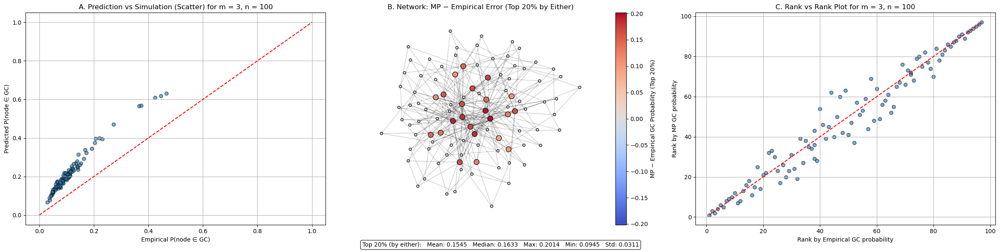

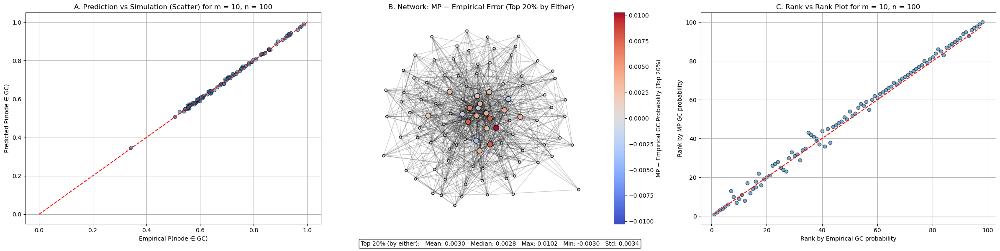

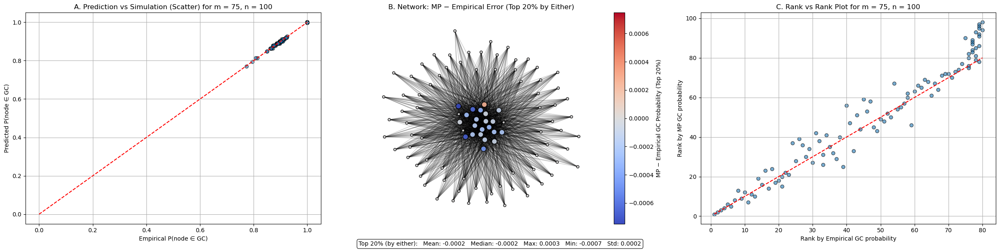

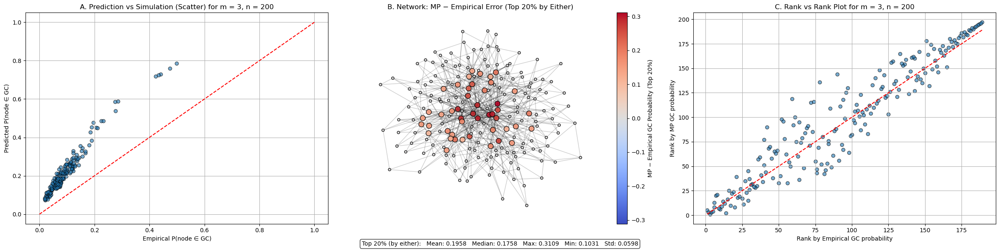

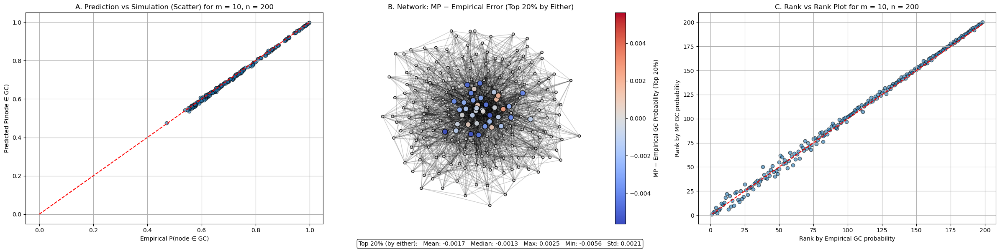

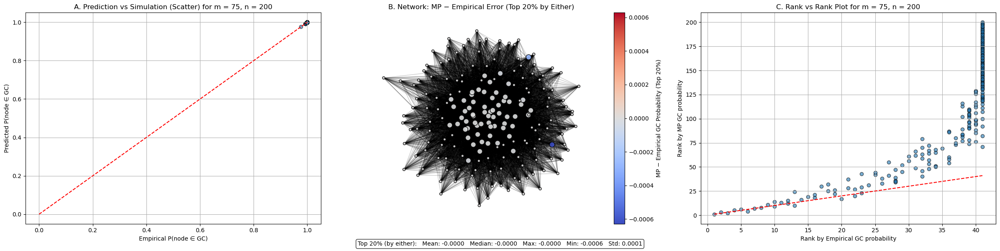

In [8]:

from scipy.stats import rankdata
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

def compare_gc_probabilities_2(empirical_gc_probs, mp_gc_probs, G, m, n):
    nodes = sorted(empirical_gc_probs.keys())
    empirical = np.array([empirical_gc_probs[node] for node in nodes])
    predicted = np.array([mp_gc_probs[node] for node in nodes])

    # Use dense ranking
    empirical_ranks = rankdata(empirical, method='dense')
    mp_ranks = rankdata(predicted, method='dense')

    # === MAKE GROUPED PLOTS ===
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))

    # === Plot A: Scatter ===
    axes[0].scatter(empirical, predicted, alpha=0.6, edgecolor='k')
    axes[0].plot([0, 1], [0, 1], 'r--')
    axes[0].set_xlabel("Empirical P(node ∈ GC)")
    axes[0].set_ylabel("Predicted P(node ∈ GC)")
    axes[0].set_title(f"A. Prediction vs Simulation (Scatter) for m = {m}, n = {n}")
    axes[0].grid(True)

    # === Plot B: Network Visualization of Top 20% (by Either) ===
    num_top = int(0.2 * len(nodes))

    # Get top 20% nodes by empirical and MP probability
    top_empirical = set(np.argsort(empirical)[-num_top:])
    top_mp = set(np.argsort(predicted)[-num_top:])
    top_nodes = top_empirical | top_mp  # union of both sets

    # Compute signed differences only for top nodes
    signed_diffs = {node: mp_gc_probs[node] - empirical_gc_probs[node] for node in top_nodes}
    
    pos = nx.spring_layout(G, seed=42)

    # Build node color and size lists
    node_colors = []
    node_size = []
    for n_i in G.nodes():
        if n_i in top_nodes:
            node_colors.append(signed_diffs[n_i])
            node_size.append(80)
        else:
            node_colors.append(0.0)
            node_size.append(20)

    # Color scale limits symmetric around 0
    lim = max(abs(val) for val in signed_diffs.values())

    nx.draw_networkx_edges(G, pos, alpha=0.2, ax=axes[1])
    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,
        node_size=node_size,
        cmap=plt.cm.coolwarm,
        edgecolors='k',
        vmin=-lim,
        vmax=+lim,
        ax=axes[1],
        alpha=0.9
    )

    sm = ScalarMappable(norm=Normalize(vmin=-lim, vmax=+lim), cmap=plt.cm.coolwarm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes[1])
    cbar.set_label('MP − Empirical GC Probability (Top 20%)')

    axes[1].set_title("B. Network: MP − Empirical Error (Top 20% by Either)")
    axes[1].set_axis_off()

    # === Plot C: Rank vs Rank ===
    axes[2].scatter(empirical_ranks, mp_ranks, alpha=0.6, edgecolor='k')
    axes[2].plot([1, max(empirical_ranks)], [1, max(empirical_ranks)], 'r--')
    axes[2].set_xlabel("Rank by Empirical GC probability")
    axes[2].set_ylabel("Rank by MP GC probability")
    axes[2].set_title(f"C. Rank vs Rank Plot for m = {m}, n = {n}")
    axes[2].grid(True)

    plt.tight_layout()

    # === Stats summary (just for top 20%) ===
    differences = [signed_diffs[n] for n in top_nodes]
    stats_text = (
        f"Top 20% (by either):   "
        f"Mean: {np.mean(differences):.4f}   "
        f"Median: {np.median(differences):.4f}   "
        f"Max: {np.max(differences):.4f}   "
        f"Min: {np.min(differences):.4f}   "
        f"Std: {np.std(differences):.4f}"
    )
    fig.text(0.5, 0.01, stats_text, ha='center', fontsize=10,
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.show()
    
    
    


def percolated_gc_probabilities(G, p, num_simulations, seed=None):
    rng = np.random.default_rng(seed)
    n = G.number_of_nodes()
    counts = np.zeros(n)

    edge_list = list(G.edges())
    
    for _ in range(num_simulations):
        retained_edges = [e for e in edge_list if rng.random() < p]
        H = nx.Graph()
        H.add_nodes_from(G.nodes)
        H.add_edges_from(retained_edges)
        
        if H.number_of_edges() == 0:
            gc_nodes = set()
        else:
            components = list(nx.connected_components(H))
            gc_nodes = max(components, key=len)
        
        for node in gc_nodes:
            counts[node] += 1

    return {node: counts[node] / num_simulations for node in G.nodes}


# show everything

def main():
    m_list=[3, 10, 75]
    n_list = [100, 200]
    #m = 10
    p_percolation = .1
    num_simulations = 10000
    for n in n_list:
        for m in m_list:
            # Create base graph
            G = nx.barabasi_albert_graph(n=n, m=m, seed=42)

            # # Assign activation probs (0.1 each way)
            activation_probabilities = {}
       
            for u, v in G.edges():
                activation_probabilities[(u, v)] = p_percolation
                activation_probabilities[(v, u)] = p_percolation

            # Step 1: Run percolation simulations
            empirical_gc_probs = percolated_gc_probabilities(G, p=p_percolation, num_simulations=num_simulations)

            # Step 2: Run message-passing prediction
            mu_values = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            mp_gc_probs = {node: 1 - mu for node, mu in mu_values.items()}

            # Step 3: Compare with grouped plots
            compare_gc_probabilities_2(empirical_gc_probs, mp_gc_probs, G,m, n)

if __name__ == "__main__":
    main()
    

# MP-GC-1

/var/folders/ln/5vd2y_gn2_g8qft7kqsyrp4m0000gn/T/ipykernel_62188/3469843813.py:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="mu (Prob NOT in GC)")


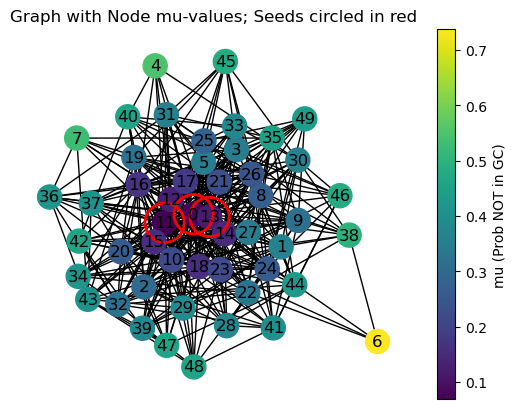

In [9]:

# most bassic approach to pick seeds
# based on the mu values
def pick_seeds_by_mu_1(mu_dict, k):
    """
    Sort nodes by (1 - mu_i) descending, i.e. pick those most likely in GC.
    Return a list of k nodes.
    """
    # Sort by 1 - mu_i descending
    nodes_sorted = sorted(mu_dict.keys(), key=lambda x: (1 - mu_dict[x]), reverse=True)
    return nodes_sorted[:k]



# example visual
def main():
    # similar graph to our results
    G = nx.barabasi_albert_graph(n=50, m=10, seed=42)

    # provs at 0.1
    activation_probabilities = {}
    for u, v in G.edges():
        activation_probabilities[(u, v)] = 0.1
        activation_probabilities[(v, u)] = 0.1

    #Run message passing
    mu_dict = compute_not_in_giant_component_probabilities(G, activation_probabilities)

    # k and thenf find optimal seeds
    k = 3
    seed_nodes = pick_seeds_by_mu_1(mu_dict, k)

    # plot results
    plot_graph(G, mu_values=mu_dict, seed_nodes=seed_nodes)

# run in main function
if __name__ == "__main__":
    main()


## MP-GC-2


In [10]:


def find_large_components(G, mu_values, threshold=0.5):
    """
    Identify connected regions of the graph induced by nodes that are “well-connected”
    (i.e. with (1 - mu_i) above the threshold) and  filter out small regions (min_size).
    """
    # select nodes with (1 - mu) above threshold.
    min_size = max(1, int(0.05 * G.number_of_nodes()))
    selected_nodes = [node for node in G.nodes() if (1 - mu_values[node]) >= threshold]
    subG = G.subgraph(selected_nodes)
    # get connected components
    components = list(nx.connected_components(subG))
    
    # filter out very small components.
    large_components = [comp for comp in components if len(comp) >= min_size]
    return large_components

def pick_seeds_across_components_2(G, mu_values, k, threshold=0.5):
    """
    For more robust seeding, first find connected groups among nodes that are likely in a giant component.
    Then pick the best node (one with highest (1 - mu)) from each region.
    If fewer than k seeds are obtained, fill in the remainder by the global ranking.
    """
    components = find_large_components(G, mu_values, threshold=threshold)
    
    seeds = []
    # pick one seed per identified component
    for comp in components:
        best_node = max(comp, key=lambda node: 1 - mu_values[node])
        seeds.append(best_node)
    
    # if we have fewer than k seeds, fill up with best remaining nodes.
    if len(seeds) < k:
        remaining = sorted(set(G.nodes()) - set(seeds), key=lambda node: 1 - mu_values[node], reverse=True)
        seeds.extend(remaining[:(k - len(seeds))])
    # if we have more than needed, choose the top k by ranking.
    elif len(seeds) > k:
        seeds = sorted(seeds, key=lambda node: 1 - mu_values[node], reverse=True)[:k]
    
    return seeds


# approach 3: MP-GC-3


In [11]:
# this is a helper function to find all components in the graph
def find_all_components(G):
    """
    Identify ALL connected components of the graph G.
    """
    return list(nx.connected_components(G))


# third appraoch, again component based
def pick_seeds_across_components_3(G, mu_values, k):
    """
    1) Find all connected components in G.
    2) For each component, pick one 'best' node (highest (1 - mu)).
    3) If there are more components than k, pick the top k among them.
    4) If there are fewer components than k, fill the remainder by global ranking.
    """
    # get components
    components = find_all_components(G)
    
    #for each component, pick the single best node by prob in connected comp
    comp_best_nodes = []
    for comp in components:
        best_node = max(comp, key=lambda node: (1 - mu_values[node]))
        best_score = (1 - mu_values[best_node])
        comp_best_nodes.append((comp, best_node, best_score))
    
    #sort the components by their best node’s score 
    comp_best_nodes.sort(key=lambda x: x[2], reverse=True)
    
    # If we have more components than k, keep only top k of them.
    if len(comp_best_nodes) > k:
        comp_best_nodes = comp_best_nodes[:k]
    
    # get the chosen seeds so far.
    seeds = [tpl[1] for tpl in comp_best_nodes]
    
    # iff we have fewer components than k, fill the remainder by global ranking.
    if len(seeds) < k:
        used_nodes = set(seeds)
        # Sort all leftover nodes by (1 - mu), descending.
        leftover_nodes = sorted(
            set(G.nodes()) - used_nodes,
            key=lambda node: (1 - mu_values[node]),
            reverse=True
        )
        seeds.extend(leftover_nodes[:(k - len(seeds))])
    
    return seeds




# MP-GC-4



In [12]:

# spectral clustering
def partition_graph_into_k_clusters(G, k):
    """
    Partition any graph G into exactly k clusters using spectral clustering.
    """

    
    #  normalized Laplacian matrix as a dense matrix.
    L = nx.normalized_laplacian_matrix(G).astype(float)
    
    # Alt apprach to help with debugging
    #A = nx.to_scipy_sparse_array(G, format='csr')
    #L = csgraph.laplacian(A, normed=True).astype(float)
    
    # error handling
    with np.errstate(divide="ignore"):
        # Compute the first k eigenvectors (smallest eigenvalues)
        eigenvalues, eigenvectors = eigsh(L, k=k, which='SM')
        
    # use k means to conver this to k clusters 
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(eigenvectors)
    
    # assign each node to its cluster
    clusters = {}
    for node, label in zip(G.nodes(), labels):
        clusters.setdefault(label, set()).add(node)
        
    return list(clusters.values())



# actually run the percolation process and get probs
def compute_percolation_within_clusters(G, activation_probabilities, k):
    """
    
    Partition the graph into k clusters using spectral clustering then 
    For each cluster, run the percolation process to find nodes not in the giant component then 
    Select one seed from each cluster based on local percolation results then
    Adjust the number of seeds to match k if necessary
    """
    # clister
    clusters = partition_graph_into_k_clusters(G, k)
    
    # results
    all_mu_values = {}  
    seeds_percolation = []
    
    # for each cluster, run percolation and select best node
    for cluster in clusters:
        if len(cluster) <= 1:
            if len(cluster) == 1:
                seeds_percolation.append(next(iter(cluster)))
            continue
        
        # Create a subgraph for this cluster
        subG = G.subgraph(cluster).copy()
        
        # run the og percolation within this cluster
        mu_local = compute_not_in_giant_component_probabilities(
            subG, 
            {(i, j): activation_probabilities.get((i, j), 0.5) 
             for i in subG.nodes() for j in subG.neighbors(i)})
        
        # track mu's
        all_mu_values.update(mu_local)
        
        # select the best node from this cluster based on percolation results
        if len(mu_local) > 0:
            best_node = max(subG.nodes(), key=lambda node: (1 - mu_local[node]))
            seeds_percolation.append(best_node)
    
    # get global mu values for potential additional seed selection and additional testing
    global_mu_values = compute_not_in_giant_component_probabilities(
        G, activation_probabilities)
    
    
    # update all_mu_values 
    for node in G.nodes():
        if node not in all_mu_values:
            all_mu_values[node] = global_mu_values[node]
    
    # adjust seeds to match k 
    if len(seeds_percolation) < k:
        # if need more seeds add nodes with highest global influence not already selected
        used = set(seeds_percolation)
        leftover = sorted(
            [node for node in G.nodes() if node not in used],
            key=lambda node: (1 - global_mu_values[node]),
            reverse=True
        )
        seeds_percolation.extend(leftover[:(k - len(seeds_percolation))])
    elif len(seeds_percolation) > k:
        # if o many seeds keep only the k most influential ones based on global values
        seeds_percolation = sorted(
            seeds_percolation, 
            key=lambda node: (1 - global_mu_values[node]), 
            reverse=True
        )[:k]
    
    return all_mu_values, clusters, seeds_percolation

# function to do it all
def select_seeds_spectral_percolation(G, activation_probabilities, k):
    """
        function to select seeds using spectral clustering followed by percolation.
    """
    # run it
    mu_values, clusters, seeds_percolation = compute_percolation_within_clusters(
        G, activation_probabilities, k
    )
    
    #  also compute simple global selection, used in some of my testing
    global_mu_values = compute_not_in_giant_component_probabilities(
        G, activation_probabilities)
    seeds_global = pick_seeds_by_mu_1(global_mu_values, k)
    
    return {
        'mu_values': mu_values,
        'clusters': clusters,
        'seeds_percolation': seeds_percolation,
        'seeds_global': seeds_global
    }




# Sample Barabasi Albert Graphs

Generated Barabási-Albert graph with 50 nodes and total 400 edges.
Generated Barabási-Albert graph with 75 nodes and total 650 edges.
Generated Barabási-Albert graph with 150 nodes and total 1400 edges.
Generated Barabási-Albert graph with 200 nodes and total 1900 edges.


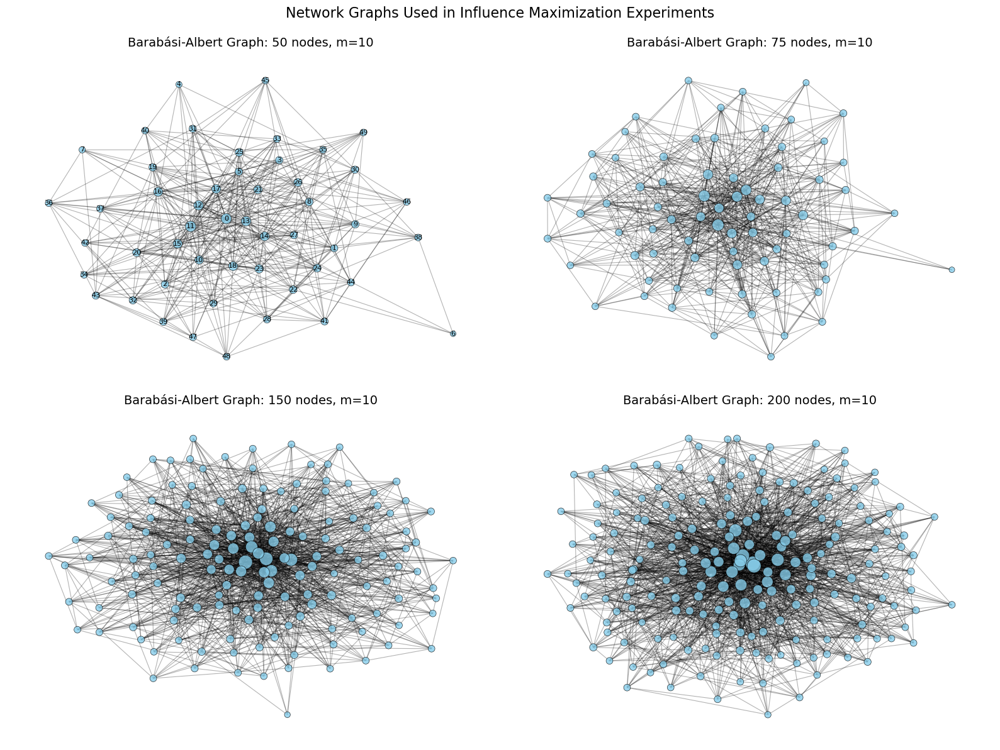

In [13]:

plt.figure(figsize=(16, 12))

# sizes
sizes =[50, 75, 150, 200]
edges=10
seed = 42


# plots for each size
for i, size in enumerate(sizes):
    
    # Generate a Barabási-Albert graph
    G = nx.barabasi_albert_graph(size, edges, seed=seed)
    print(f"Generated Barabási-Albert graph with {size} nodes and total {G.number_of_edges()} edges.")
    
    #  subplot
    ax = plt.subplot(2, 2, i+1)
    
    pos = nx.spring_layout(G, seed=seed)
    
    # draw nodes with size based on degree (popularity)
    node_sizes = [30 + 3 * G.degree(node) for node in G.nodes()]
    
    # draw it the graph
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', 
                          alpha=0.8, edgecolors='black', linewidths=0.5)
    nx.draw_networkx_edges(G, pos, alpha=0.3, width=0.8)
    
    # labels for small graphs
    if size <= 50:
        nx.draw_networkx_labels(G, pos, font_size=8)
    
    # Title 
    plt.title(f"Barabási-Albert Graph: {size} nodes, m=10", fontsize=14)
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Network Graphs Used in Influence Maximization Experiments", fontsize=16, y=0.99)
plt.subplots_adjust(top=0.93)
plt.show()

# Functions for Heuristic Metrics

In [14]:
# HEURISTICS

def pick_highest_degree_seeds(G, k):
    """Return the top k nodes with the highest degree."""
    sorted_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)
    return [node for node, degree in sorted_nodes[:k]]

def pick_central_nodes(G, k):
    """Return the top k nodes based on closeness centrality."""
    centrality = nx.closeness_centrality(G)
    sorted_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)
    return [node for node, cent in sorted_nodes[:k]]

def pick_random_seeds(G, k):
    """Return k random seeds from the graph."""
    return random.sample(list(G.nodes()), k)

# Results - 1, k=3

In [15]:
#def compute_not_in_giant_component_probabilities(graph, activation_probabilities, iterations=500, tolerance=1e-6):

# RUN SIMS
if __name__ == "__main__":
    sizes = [50, 75, 150, 200]  #graph sizes to test
    #sizes = [25, 50]  #graph sizes to test
    #sizes = [25, 50]
    k = 3             # number of seeds for each experiment
    #p = 0.3           # activation probability for each edge
    graph_seed = 42
    num_simulations = 10  # Number of simulations to run

    # dictionaries to store results from all simulations
    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central' ]
    
    # hold all simulation results
    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': []
        } for approach in approaches
    }

    # loop to run multiple simulations
    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        # sim specific data
        sim_results = {
            approach: {
                'run_times': [],
                'active_counts': []
            } for approach in approaches
        }
        
        # loop over the different graph sizes
        for size in sizes:
            print(f"\n=== Graph size: {size} ===")
            
            #########################################
            # build the graph        
            G = nx.barabasi_albert_graph(size, 10, seed=42)
    
            # set at 0.1
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1
            
            ##################################################################################
                       
                       
            # GEEDY (IM-CP-G)
            
            start_time = time.time()
            opt_seeds = find_optimal_seeds(G, k, activation_probabilities)
            elapsed_time = time.time() - start_time
            final_active_nodes = independent_cascade(G, opt_seeds, activation_probabilities)
            
            print(f"[IM-CP-G] Seeds: {opt_seeds}")
            print(f"[IM-CP-G] Active count: {len(final_active_nodes)} ({100 * len(final_active_nodes) / size:.1f}%)")
            print(f"[IM-CP-G] Time: {elapsed_time:.4f} sec")
            
            sim_results['IM-CP-G']['run_times'].append(elapsed_time)
            sim_results['IM-CP-G']['active_counts'].append(len(final_active_nodes))
            
            ##################################################################################
            
            
            # MP-GC-1
            
            start_time_mp_1 = time.time()
            mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
            elapsed_time_mp_1 = time.time() - start_time_mp_1
            final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
            
            print(f"['MP-GC-1] Seeds: {mp_seeds_1}")
            print(f"['MP-GC-1] Active count: {len(final_active_nodes_mp_1)} ({100 * len(final_active_nodes_mp_1) / size:.1f}%)")
            print(f"['MP-GC-1] Time: {elapsed_time_mp_1:.4f} sec")
            
            sim_results['MP-GC-1']['run_times'].append(elapsed_time_mp_1)
            sim_results['MP-GC-1']['active_counts'].append(len(final_active_nodes_mp_1))
            
             ##################################################################################
            
        
            ###  MP-GC-2
            
            
            start_time_mp_2= time.time()
            mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k, threshold=threshold)
            elapsed_time_mp_2 = time.time() - start_time_mp_2
            final_active_nodes_mp_2= independent_cascade(G, mp_seeds_2, activation_probabilities)
            
            print(f"[MP-GC-2] Seeds: {mp_seeds_2}")
            print(f"[MP-GC-2] Active count: {len(final_active_nodes_mp_2)} ({100 * len(final_active_nodes_mp_2) / size:.1f}%)")
            print(f"[MP-GC-2] Time: {elapsed_time_mp_2:.4f} sec")
            
            sim_results['MP-GC-2']['run_times'].append(elapsed_time_mp_2)
            sim_results['MP-GC-2']['active_counts'].append(len(final_active_nodes_mp_2))
            
            
            
            ##################################################################################
            
            
             ### MP-GC-3
               
            start_time_cc = time.time()
            mu_values_cc = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            cc_seeds = pick_seeds_across_components_3(G, mu_values_cc, k)
            elapsed_time_cc = time.time() - start_time_cc
            final_active_nodes_cc = independent_cascade(G, cc_seeds, activation_probabilities)
            
            print(f"[MP-GC-3] Seeds: {cc_seeds}")
            print(f"[MP-GC-3] Active count: {len(final_active_nodes_cc)} ({100 * len(final_active_nodes_cc) / size:.1f}%)")
            print(f"[MP-GC-3] Time: {elapsed_time_cc:.4f} sec")
            
            sim_results['MP-GC-3']['run_times'].append(elapsed_time_cc)
            sim_results['MP-GC-3']['active_counts'].append(len(final_active_nodes_cc))
            
            
            ##################################################################################
            
            #MP-GC-4, change here: select_seeds_spectral_percolation
            
            start_time_sp = time.time()
            #sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            #_, _, sp_seeds = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_seeds = sp_result['seeds_percolation']
            elapsed_time_sp = time.time() - start_time_sp
            final_active_nodes_sp = independent_cascade(G, sp_seeds, activation_probabilities)
            
            print(f"[MP-GC-4] Seeds: {sp_seeds}")
            print(f"[MP-GC-4] Active count: {len(final_active_nodes_sp)} ({100 * len(final_active_nodes_sp) / size:.1f}%)")
            print(f"[MP-GC-4] Time: {elapsed_time_sp:.4f} sec")
            
            sim_results['MP-GC-4']['run_times'].append(elapsed_time_sp)
            sim_results['MP-GC-4']['active_counts'].append(len(final_active_nodes_sp))
            
            ##################################################################################
                 
                 
        
            # heusistics
            
            ##################################################################################
            
            
            ###  Random Seeds
            start_time_rand = time.time()
            random_seeds = pick_random_seeds(G, k)
            elapsed_time_rand = time.time() - start_time_rand
            final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
            
            print(f"[Random Seeds] Seeds: {random_seeds}")
            print(f"[Random Seeds] Active count: {len(final_active_nodes_rand)} ({100 * len(final_active_nodes_rand) / size:.1f}%)")
            print(f"[Random Seeds] Time: {elapsed_time_rand:.4f} sec")
            
            sim_results['Random']['run_times'].append(elapsed_time_rand)
            sim_results['Random']['active_counts'].append(len(final_active_nodes_rand))
            
            ##################################################################################
              
              
            ### Highest Degree Nodes
            start_time_degree = time.time()
            degree_seeds = pick_highest_degree_seeds(G, k)
            elapsed_time_degree = time.time() - start_time_degree
            final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
            
            print(f"[Highest Degree] Seeds: {degree_seeds}")
            print(f"[Highest Degree] Active count: {len(final_active_nodes_degree)} ({100 * len(final_active_nodes_degree) / size:.1f}%)")
            print(f"[Highest Degree] Time: {elapsed_time_degree:.4f} sec")
            
            sim_results['Degree']['run_times'].append(elapsed_time_degree)
            sim_results['Degree']['active_counts'].append(len(final_active_nodes_degree))
            
            ##################################################################################
            
            ### Central Nodes (Closeness Centrality)
            start_time_central = time.time()
            central_seeds = pick_central_nodes(G, k)
            elapsed_time_central = time.time() - start_time_central
            final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
            
            print(f"[Central Nodes] Seeds: {central_seeds}")
            print(f"[Central Nodes] Active count: {len(final_active_nodes_central)} ({100 * len(final_active_nodes_central) / size:.1f}%)")
            print(f"[Central Nodes] Time: {elapsed_time_central:.4f} sec")
            
            sim_results['Central']['run_times'].append(elapsed_time_central)
            sim_results['Central']['active_counts'].append(len(final_active_nodes_central))
        
        
          ##################################################################################
          
          
        # save the results of this simulation
        for approach in approaches:
            all_results[approach]['run_times'].append(sim_results[approach]['run_times'])
            all_results[approach]['active_counts'].append(sim_results[approach]['active_counts'])
            
            # calculate percent active for this simulation
            percent_active = [100 * count / size for count, size in zip(sim_results[approach]['active_counts'], sizes)]
            all_results[approach]['percent_active'].append(percent_active)
    
    # averages across all simulations
    avg_results = {
        approach: {
            'avg_run_times': np.mean(np.array(all_results[approach]['run_times']), axis=0),
            'avg_active_counts': np.mean(np.array(all_results[approach]['active_counts']), axis=0),
            'avg_percent_active': np.mean(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    
    # standard deviations for error bars
    std_results = {
        approach: {
            'std_run_times': np.std(np.array(all_results[approach]['run_times']), axis=0),
            'std_active_counts': np.std(np.array(all_results[approach]['active_counts']), axis=0),
            'std_percent_active': np.std(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    

     
      ##################################################################################
    # Plotting
    # colors     
    colors = {
        'IM-CP-G': 'blue',
        'MP-GC-1': 'orange',
        'MP-GC-2': 'green',
        'MP-GC-3': 'red',
        'MP-GC-4': 'purple',
        'Random': 'cyan',
        'Degree': 'brown',
        'Central': 'pink'
    }
    
    # first plot, netowrk size vs runtime
    plt.figure(figsize=(10, 7))
    for approach in approaches:
        plt.errorbar(
            sizes, 
            avg_results[approach]['avg_run_times'], 
            yerr=std_results[approach]['std_run_times'],
            marker='o', 
            color=colors[approach], 
            label=approach,
            capsize=5
        )
    plt.xlabel("Network Size (Number of Nodes)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.title("Average Run Time vs. Network Size (10 Simulations)", fontsize=14)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    #Violin Plot of Percent Active Nodes by Approach
    # ------------------------------------------------------------------
    violin_data = []
    
    for approach in approaches:
        for sim_idx in range(num_simulations):
            for size_idx, size in enumerate(sizes):
                violin_data.append({
                    'Approach': approach,
                    'Percent Active': all_results[approach]['percent_active'][sim_idx][size_idx],
                    'Network Size': size
                })
    
    df = pd.DataFrame(violin_data)

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette=colors,
        inner="quartile",  # Shows median and IQR
        linewidth=1.2,
        cut=0
    )
    
    #mean is black diamond
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    
    # Final touches
    plt.title("Influence Coverage Distribution by Approach (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    
    
    
   # Violin Plot of Percent Active by Approach and Network Size
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        hue="Network Size",
        data=df,
        palette="viridis",
        #split=True,
        inner="quartile",
        cut=0
    )
    
    plt.title("Influence Coverage by Approach and Network Size (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Network Size", fontsize=10)
    plt.tight_layout()
    plt.show()


======== SIMULATION 1/10 ========

=== Graph size: 50 ===
[IM-CP-G] Seeds: [0, 18, 1]
[IM-CP-G] Active count: 31 (62.0%)
[IM-CP-G] Time: 4.4473 sec
['MP-GC-1] Seeds: [11, 0, 13]
['MP-GC-1] Active count: 38 (76.0%)
['MP-GC-1] Time: 0.0043 sec
[MP-GC-2] Seeds: [11, 0, 13]
[MP-GC-2] Active count: 31 (62.0%)
[MP-GC-2] Time: 0.0046 sec
[MP-GC-3] Seeds: [11, 0, 13]
[MP-GC-3] Active count: 39 (78.0%)
[MP-GC-3] Time: 0.0040 sec
[MP-GC-4] Seeds: [0, 22, 11]
[MP-GC-4] Active count: 26 (52.0%)
[MP-GC-4] Time: 0.0466 sec
[Random Seeds] Seeds: [33, 47, 32]
[Random Seeds] Active count: 25 (50.0%)
[Random Seeds] Time: 0.0000 sec
[Highest Degree] Seeds: [11, 0, 13]
[Highest Degree] Active count: 38 (76.0%)
[Highest Degree] Time: 0.0000 sec
[Central Nodes] Seeds: [11, 0, 13]
[Central Nodes] Active count: 27 (54.0%)
[Central Nodes] Time: 0.0005 sec

=== Graph size: 75 ===
[IM-CP-G] Seeds: [15, 40, 39]
[IM-CP-G] Active count: 53 (70.7%)
[IM-CP-G] Time: 11.8109 sec
['MP-GC-1] Seeds: [0, 11, 12]
['MP-GC-1

KeyboardInterrupt: 

# Results - 2, k=10
- same as above just testing a different k, k=10


======== SIMULATION 1/10 ========

=== Graph size: 50 ===
[IM-CP-G] Seeds: [13, 11, 30, 48, 21, 6, 3, 40, 1, 2]
[IM-CP-G] Active count: 35 (70.0%)
[IM-CP-G] Time: 14.9582 sec
Converged after 2 iterations.
['MP-GC-1] Seeds: [11, 0, 13, 12, 14, 15, 18, 16, 17, 10]
['MP-GC-1] Active count: 34 (68.0%)
['MP-GC-1] Time: 0.0041 sec
Converged after 2 iterations.
[MP-GC-2] Seeds: [11, 0, 13, 12, 14, 15, 18, 16, 17, 10]
[MP-GC-2] Active count: 38 (76.0%)
[MP-GC-2] Time: 0.0043 sec
Converged after 2 iterations.
[MP-GC-3] Seeds: [11, 0, 13, 12, 14, 15, 18, 16, 17, 10]
[MP-GC-3] Active count: 38 (76.0%)
[MP-GC-3] Time: 0.0040 sec
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
[MP-GC-4] Seed

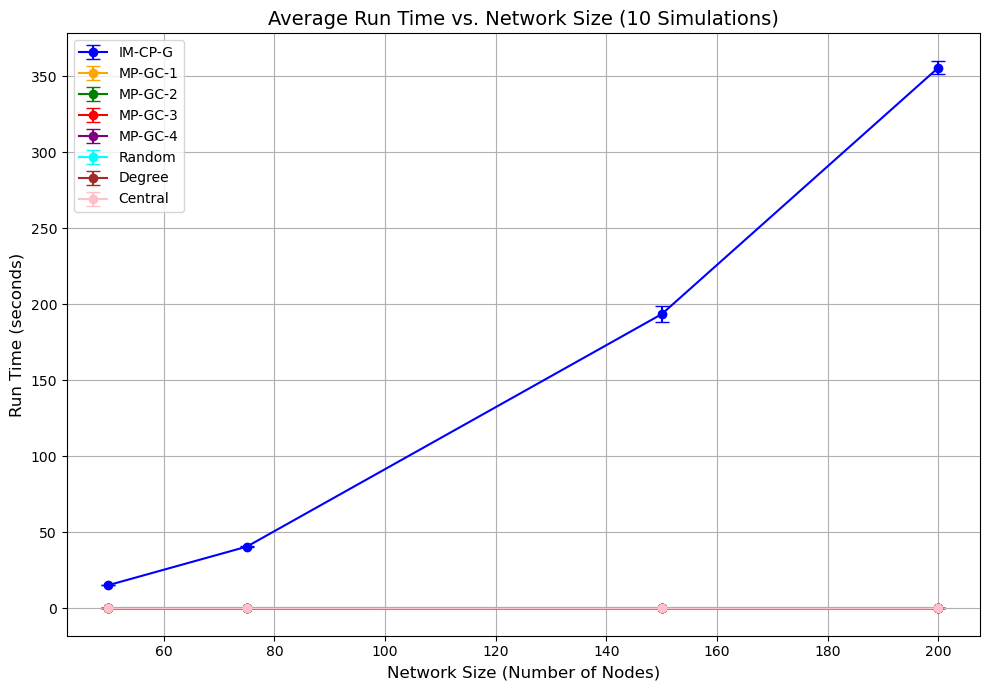

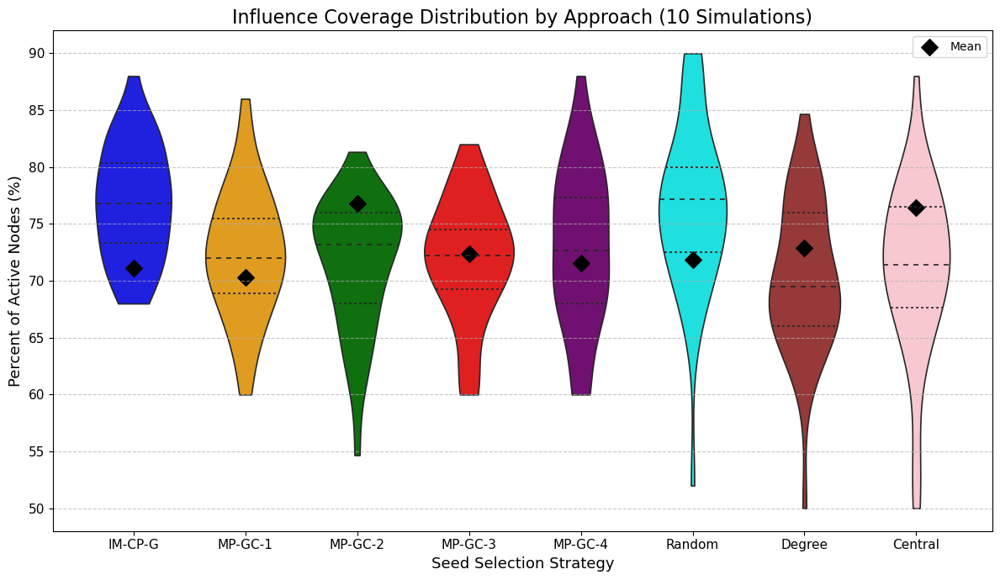

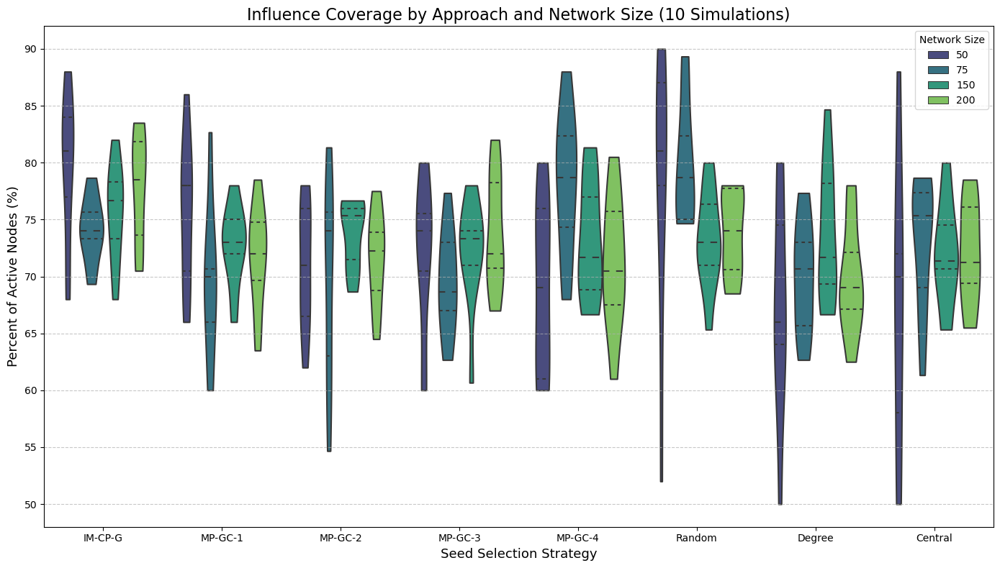

In [16]:



# RUN SIMS
if __name__ == "__main__":
    sizes = [50, 75, 150, 200]  # List of graph sizes to test
    #sizes = [25, 50]
    
    # key change here
    k = 10            # number of seeds for each experiment
    #p = 0.3           # activation probability for each edge
    graph_seed = 42
    num_simulations = 10  # Number of simulations to run

    # dictionaries to store results from all simulations
    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central' ]
    
    # hold all simulation results
    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': []
        } for approach in approaches
    }

    # loop to run multiple simulations
    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        # sim specific data
        sim_results = {
            approach: {
                'run_times': [],
                'active_counts': []
            } for approach in approaches
        }
        
        # loop over the different graph sizes
        for size in sizes:
            print(f"\n=== Graph size: {size} ===")
            
            #########################################
            # build the graph        
            G = nx.barabasi_albert_graph(size, 10, seed=42)
    
            # set at 0.1
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1
            
            ##################################################################################
                       
                       
            # GEEDY (IM-CP-G)
            
            start_time = time.time()
            opt_seeds = find_optimal_seeds(G, k, activation_probabilities)
            elapsed_time = time.time() - start_time
            final_active_nodes = independent_cascade(G, opt_seeds, activation_probabilities)
            
            print(f"[IM-CP-G] Seeds: {opt_seeds}")
            print(f"[IM-CP-G] Active count: {len(final_active_nodes)} ({100 * len(final_active_nodes) / size:.1f}%)")
            print(f"[IM-CP-G] Time: {elapsed_time:.4f} sec")
            
            sim_results['IM-CP-G']['run_times'].append(elapsed_time)
            sim_results['IM-CP-G']['active_counts'].append(len(final_active_nodes))
            
            ##################################################################################
            
            
            # MP-GC-1
            
            start_time_mp_1 = time.time()
            mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
            elapsed_time_mp_1 = time.time() - start_time_mp_1
            final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
            
            print(f"['MP-GC-1] Seeds: {mp_seeds_1}")
            print(f"['MP-GC-1] Active count: {len(final_active_nodes_mp_1)} ({100 * len(final_active_nodes_mp_1) / size:.1f}%)")
            print(f"['MP-GC-1] Time: {elapsed_time_mp_1:.4f} sec")
            
            sim_results['MP-GC-1']['run_times'].append(elapsed_time_mp_1)
            sim_results['MP-GC-1']['active_counts'].append(len(final_active_nodes_mp_1))
            
             ##################################################################################
            
        
            ###  MP-GC-2
            
            
            start_time_mp_2= time.time()
            mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k, threshold=threshold)
            elapsed_time_mp_2 = time.time() - start_time_mp_2
            final_active_nodes_mp_2= independent_cascade(G, mp_seeds_2, activation_probabilities)
            
            print(f"[MP-GC-2] Seeds: {mp_seeds_2}")
            print(f"[MP-GC-2] Active count: {len(final_active_nodes_mp_2)} ({100 * len(final_active_nodes_mp_2) / size:.1f}%)")
            print(f"[MP-GC-2] Time: {elapsed_time_mp_2:.4f} sec")
            
            sim_results['MP-GC-2']['run_times'].append(elapsed_time_mp_2)
            sim_results['MP-GC-2']['active_counts'].append(len(final_active_nodes_mp_2))
            
            
            
            ##################################################################################
            
            
             ### MP-GC-3
               
            start_time_cc = time.time()
            mu_values_cc = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            cc_seeds = pick_seeds_across_components_3(G, mu_values_cc, k)
            elapsed_time_cc = time.time() - start_time_cc
            final_active_nodes_cc = independent_cascade(G, cc_seeds, activation_probabilities)
            
            print(f"[MP-GC-3] Seeds: {cc_seeds}")
            print(f"[MP-GC-3] Active count: {len(final_active_nodes_cc)} ({100 * len(final_active_nodes_cc) / size:.1f}%)")
            print(f"[MP-GC-3] Time: {elapsed_time_cc:.4f} sec")
            
            sim_results['MP-GC-3']['run_times'].append(elapsed_time_cc)
            sim_results['MP-GC-3']['active_counts'].append(len(final_active_nodes_cc))
            
            
            ##################################################################################
            
            #MP-GC-4
            
            start_time_sp = time.time()
            #sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            #_, _, sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_seeds = sp_result['seeds_percolation']
            elapsed_time_sp = time.time() - start_time_sp
            final_active_nodes_sp = independent_cascade(G, sp_seeds, activation_probabilities)
            
            print(f"[MP-GC-4] Seeds: {sp_seeds}")
            print(f"[MP-GC-4] Active count: {len(final_active_nodes_sp)} ({100 * len(final_active_nodes_sp) / size:.1f}%)")
            print(f"[MP-GC-4] Time: {elapsed_time_sp:.4f} sec")
            
            sim_results['MP-GC-4']['run_times'].append(elapsed_time_sp)
            sim_results['MP-GC-4']['active_counts'].append(len(final_active_nodes_sp))
            
            ##################################################################################
                 
                 
        
            # heusistics
            
            ##################################################################################
            
            
            ###  Random Seeds
            start_time_rand = time.time()
            random_seeds = pick_random_seeds(G, k)
            elapsed_time_rand = time.time() - start_time_rand
            final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
            
            print(f"[Random Seeds] Seeds: {random_seeds}")
            print(f"[Random Seeds] Active count: {len(final_active_nodes_rand)} ({100 * len(final_active_nodes_rand) / size:.1f}%)")
            print(f"[Random Seeds] Time: {elapsed_time_rand:.4f} sec")
            
            sim_results['Random']['run_times'].append(elapsed_time_rand)
            sim_results['Random']['active_counts'].append(len(final_active_nodes_rand))
            
            ##################################################################################
              
              
            ### Highest Degree Nodes
            start_time_degree = time.time()
            degree_seeds = pick_highest_degree_seeds(G, k)
            elapsed_time_degree = time.time() - start_time_degree
            final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
            
            print(f"[Highest Degree] Seeds: {degree_seeds}")
            print(f"[Highest Degree] Active count: {len(final_active_nodes_degree)} ({100 * len(final_active_nodes_degree) / size:.1f}%)")
            print(f"[Highest Degree] Time: {elapsed_time_degree:.4f} sec")
            
            sim_results['Degree']['run_times'].append(elapsed_time_degree)
            sim_results['Degree']['active_counts'].append(len(final_active_nodes_degree))
            
            ##################################################################################
            
            ### Central Nodes (Closeness Centrality)
            start_time_central = time.time()
            central_seeds = pick_central_nodes(G, k)
            elapsed_time_central = time.time() - start_time_central
            final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
            
            print(f"[Central Nodes] Seeds: {central_seeds}")
            print(f"[Central Nodes] Active count: {len(final_active_nodes_central)} ({100 * len(final_active_nodes_central) / size:.1f}%)")
            print(f"[Central Nodes] Time: {elapsed_time_central:.4f} sec")
            
            sim_results['Central']['run_times'].append(elapsed_time_central)
            sim_results['Central']['active_counts'].append(len(final_active_nodes_central))
        
        
          ##################################################################################
          
          
        # save the results of this simulation
        for approach in approaches:
            all_results[approach]['run_times'].append(sim_results[approach]['run_times'])
            all_results[approach]['active_counts'].append(sim_results[approach]['active_counts'])
            
            # calculate percent active for this simulation
            percent_active = [100 * count / size for count, size in zip(sim_results[approach]['active_counts'], sizes)]
            all_results[approach]['percent_active'].append(percent_active)
    
    # averages across all simulations
    avg_results = {
        approach: {
            'avg_run_times': np.mean(np.array(all_results[approach]['run_times']), axis=0),
            'avg_active_counts': np.mean(np.array(all_results[approach]['active_counts']), axis=0),
            'avg_percent_active': np.mean(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    
    # standard deviations for error bars
    std_results = {
        approach: {
            'std_run_times': np.std(np.array(all_results[approach]['run_times']), axis=0),
            'std_active_counts': np.std(np.array(all_results[approach]['active_counts']), axis=0),
            'std_percent_active': np.std(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    

     
      ##################################################################################
    # Plotting
    # colors     
    colors = {
        'IM-CP-G': 'blue',
        'MP-GC-1': 'orange',
        'MP-GC-2': 'green',
        'MP-GC-3': 'red',
        'MP-GC-4': 'purple',
        'Random': 'cyan',
        'Degree': 'brown',
        'Central': 'pink'
    }
    
    # first plot, netowrk size vs runtime
    plt.figure(figsize=(10, 7))
    for approach in approaches:
        plt.errorbar(
            sizes, 
            avg_results[approach]['avg_run_times'], 
            yerr=std_results[approach]['std_run_times'],
            marker='o', 
            color=colors[approach], 
            label=approach,
            capsize=5
        )
    plt.xlabel("Network Size (Number of Nodes)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.title("Average Run Time vs. Network Size (10 Simulations)", fontsize=14)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    #Violin Plot of Percent Active Nodes by Approach
    # ------------------------------------------------------------------
    violin_data = []
    
    for approach in approaches:
        for sim_idx in range(num_simulations):
            for size_idx, size in enumerate(sizes):
                violin_data.append({
                    'Approach': approach,
                    'Percent Active': all_results[approach]['percent_active'][sim_idx][size_idx],
                    'Network Size': size
                })
    
    df = pd.DataFrame(violin_data)

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette=colors,
        inner="quartile",  # Shows median and IQR
        linewidth=1.2,
        cut=0
    )
    
    #mean is black diamond
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    
    # Final touches
    plt.title("Influence Coverage Distribution by Approach (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    
    
    
   # Violin Plot of Percent Active by Approach and Network Size
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        hue="Network Size",
        data=df,
        palette="viridis",
        #split=True,
        inner="quartile",
        cut=0
    )
    
    plt.title("Influence Coverage by Approach and Network Size (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Network Size", fontsize=10)
    plt.tight_layout()
    plt.show()

# Custom Barabasi Albert Graphs with Groups

Total edges in clustered BA graph: 309
Total edges in clustered BA graph: 468
Total edges in clustered BA graph: 1000
Total edges in clustered BA graph: 1370


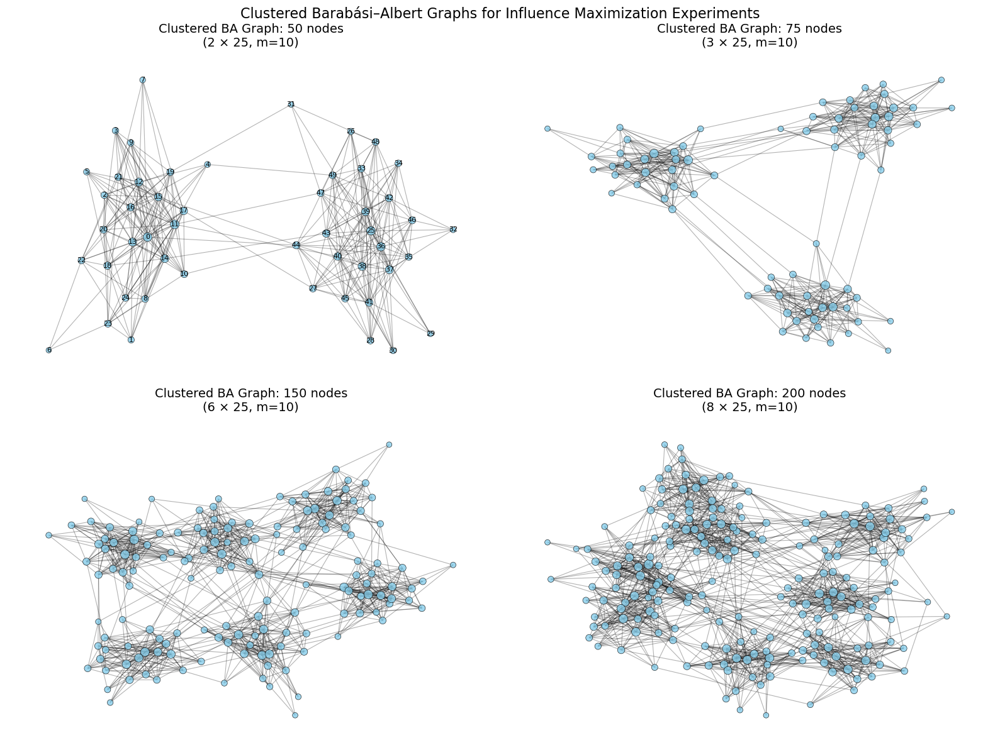

In [17]:

# custom BA graph
def generate_clustered_ba_graph(num_clusters, nodes_per_cluster, m, inter_connect_prob=0.01, seed=None):
    
    """
    Generate a graph composed of multiple Barabási–Albert (BA) clusters with light interconnections between them

    """
    G = nx.Graph()
    offset = 0
    cluster_nodes = []
    rng = random.Random(seed)

    # seperable BA graph
    for i in range(num_clusters):
        ba = nx.barabasi_albert_graph(n=nodes_per_cluster, m=m, seed=seed)
        mapping = {node: node + offset for node in ba.nodes()}
        ba = nx.relabel_nodes(ba, mapping)
        G.add_nodes_from(ba.nodes())
        G.add_edges_from(ba.edges())
        cluster_nodes.append(list(mapping.values()))
        offset += nodes_per_cluster

    # Sconnect them
    for i in range(num_clusters):
        for j in range(i + 1, num_clusters):
            for u in cluster_nodes[i]:
                for v in cluster_nodes[j]:
                    if rng.random() < inter_connect_prob:
                        G.add_edge(u, v)
    print(f"Total edges in clustered BA graph: {G.number_of_edges()}")
    return G


# plot
plt.figure(figsize=(16, 12))

sizes = [50, 75, 150, 200]
#sizes = [50, 100]
edges = 10  #m
seed = 42
# fixed
nodes_per_cluster = 25
# fixed
inter_connect_prob = 0.01

for i, total_nodes in enumerate(sizes):
    
    # get number of clusters
    num_clusters = total_nodes // nodes_per_cluster
    if num_clusters == 0:
        continue

    # generate clustered BA graph
    G = generate_clustered_ba_graph(
        num_clusters=num_clusters,
        nodes_per_cluster=nodes_per_cluster,
        m=edges,
        inter_connect_prob=inter_connect_prob,
        seed=seed
    )

    # subplot
    ax = plt.subplot(2, 2, i+1)
    pos = nx.spring_layout(G, seed=seed)

    node_sizes = [30 + 3 * G.degree(node) for node in G.nodes()]
    
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue',
                           alpha=0.8, edgecolors='black', linewidths=0.5)
    nx.draw_networkx_edges(G, pos, alpha=0.3, width=0.8)
    
    if total_nodes <= 50:
        nx.draw_networkx_labels(G, pos, font_size=8)

    plt.title(f"Clustered BA Graph: {total_nodes} nodes\n({num_clusters} × {nodes_per_cluster}, m={edges})", fontsize=14)
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Clustered Barabási–Albert Graphs for Influence Maximization Experiments", fontsize=16, y=0.99)
plt.subplots_adjust(top=0.93)
plt.show()

In [18]:
# def expected_edges(n, m, n_c, p):
#     c = n // n_c  # number of clusters
#     intra = c * m * (n_c - m)
#     inter = p * (c * (c - 1) / 2) * (n_c ** 2)
#     total = intra + inter
#     return {
#         "clusters": c,
#         "intra_edges": intra,
#         "inter_edges": inter,
#         "total_edges": total
#     }

# # Example
# print(expected_edges(n=300, m=10, n_c=25, p=0.01))


### Example using approach MP-GC-4

Total edges in clustered BA graph: 816
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
[11, 100, 86]


/var/folders/ln/5vd2y_gn2_g8qft7kqsyrp4m0000gn/T/ipykernel_28372/3419385360.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="mu (Prob NOT in GC)")


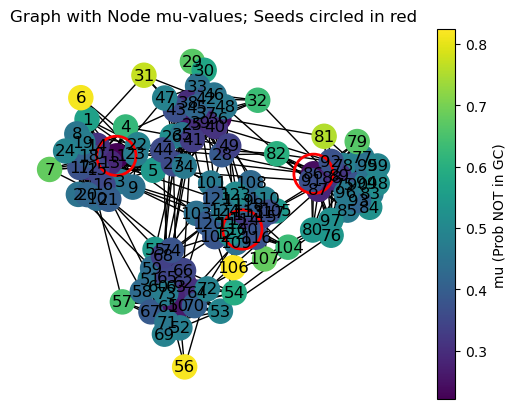

In [19]:
# plot the nodes and their probs
def plot_graph(G, mu_values=None, seed_nodes=None):
    pos = nx.spring_layout(G, seed=42)
    
    if mu_values is not None:
        cmap = plt.cm.viridis
        node_color = [mu_values[node] for node in G.nodes()]
        nodes = nx.draw_networkx_nodes(G, pos, node_color=node_color, cmap=cmap)
        nx.draw_networkx_edges(G, pos)
        nx.draw_networkx_labels(G, pos)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(mu_values.values()), 
                                                                 vmax=max(mu_values.values())))
        sm.set_array([])
        plt.colorbar(sm, label="mu (Prob NOT in GC)")
        
        if seed_nodes is not None:
            nx.draw_networkx_nodes(
                G, pos,
                nodelist=seed_nodes,
                node_color="none",
                edgecolors="red",
                node_size=800,
                linewidths=2
            )
    else:
        nx.draw(G, pos, with_labels=True)
    
    plt.title("Graph with Node mu-values; Seeds circled in red")
    plt.axis('off')
    plt.show()

G = generate_clustered_ba_graph(
    num_clusters=5,
    nodes_per_cluster=25,
    m=10,
    inter_connect_prob=0.01,
    seed=42
)

# activation probabilities
activation_probabilities = {}
for u, v in G.edges():
    activation_probabilities[(u, v)] = 0.1
    activation_probabilities[(v, u)] = 0.1
                
                
mu_values = compute_not_in_giant_component_probabilities(G, activation_probabilities)

# k
k = 3
result = select_seeds_spectral_percolation(G, activation_probabilities, k)
seeds = result['seeds_percolation']
print(seeds)
# visualize
plot_graph(G, mu_values=mu_values, seed_nodes=seeds)

# Results - 3,  Custom Barabasi Albert Graphs with k=3


======== SIMULATION 1/10 ========

=== Graph size: 50 ===
Total edges in clustered BA graph: 309
[IM-CP-G Diagnostic] Percent Active: 34.00%
Converged after 2 iterations.
[MP-GC-1 Diagnostic] Percent Active: 44.00%
Converged after 2 iterations.
[MP-GC-2 Diagnostic] Percent Active: 16.00%
Converged after 2 iterations.
[MP-GC-3 Diagnostic] Percent Active: 22.00%
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
[MP-GC-3 Diagnostic] Percent Active: 42.00%
[MP-GC-3 Diagnostic] Percent Active: 30.00%
[MP-GC-3 Diagnostic] Percent Active: 52.00%
[MP-GC-3 Diagnostic] Percent Active: 48.00%

=== Graph size: 75 ===
Total edges in clustered BA graph: 468
[IM-CP-G Diagnostic] Percent Active: 69.33%
Converged after 2 iterations.
[MP-GC-1 Diagnostic] Percent Active: 24.00%
Converged after 2 iterations.
[MP-GC-2 Diagnostic] Percent Active: 24.00%
Converged after 2 iterations.
[MP-GC-3 Diagnostic] Perc

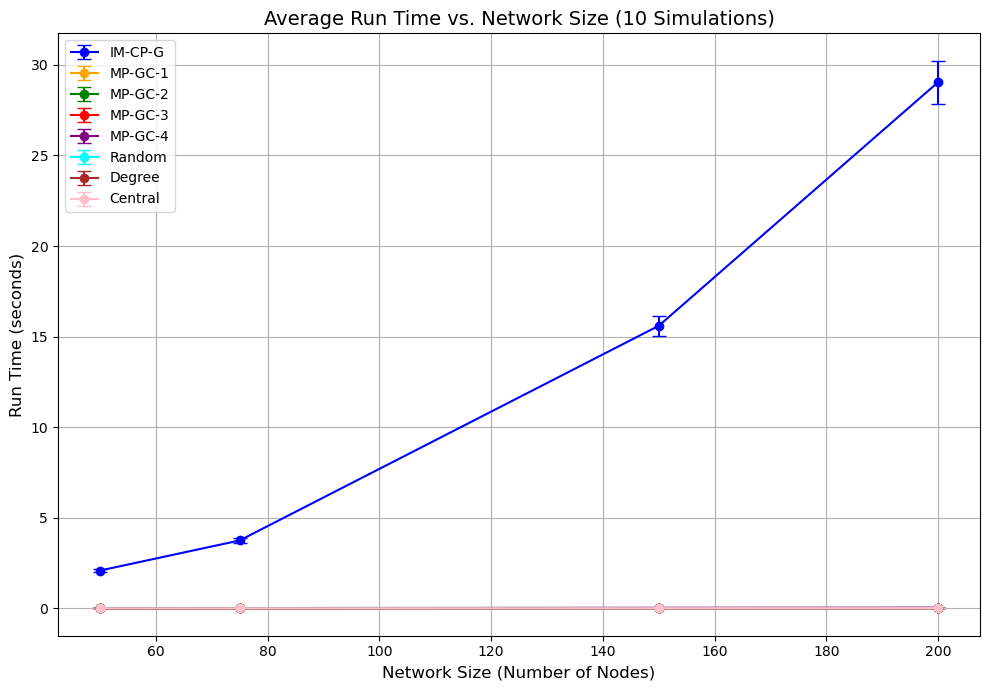

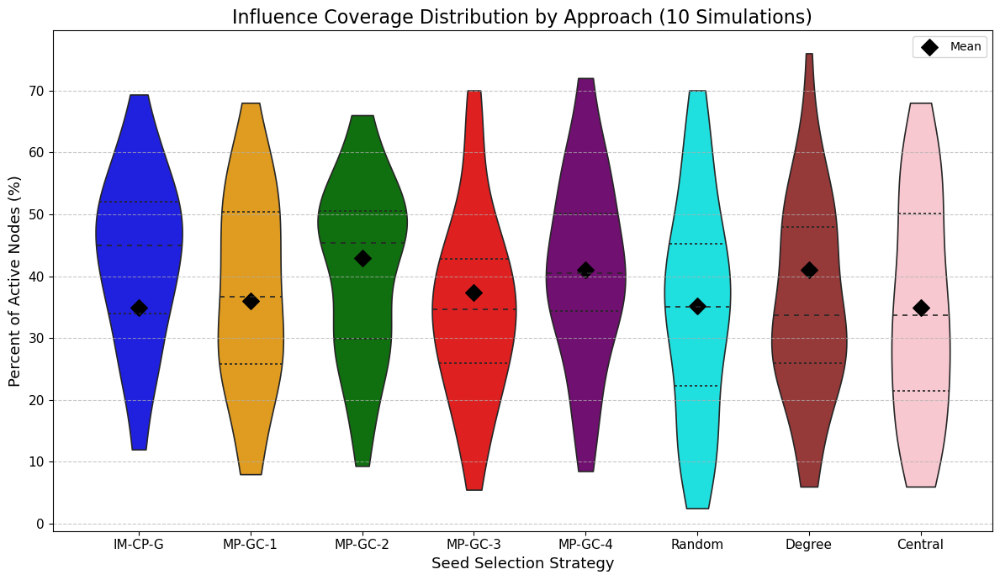

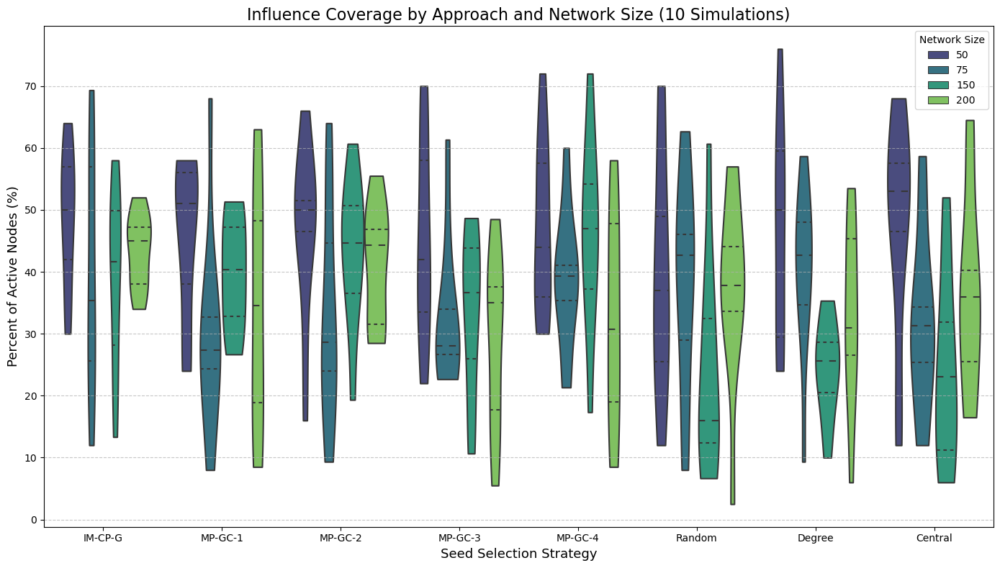

In [20]:



# RUN SIMS
if __name__ == "__main__":
    sizes = [50, 75, 150, 200]  #graph sizes to test
    #sizes = [25, 50]
    k = 3             # number of seeds for each experiment
    #p = 0.3           # activation probability for each edge
    graph_seed = 42
    num_simulations = 10  # Number of simulations to run
    
    # params for the custom graph
    nodes_per_cluster = 25
    # fixed
    inter_connect_prob = 0.01

    # dictionaries to store results from all simulations
    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central' ]
    
    # hold all simulation results
    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': []
        } for approach in approaches
    }

    # loop to run multiple simulations
    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        # sim specific data
        sim_results = {
            approach: {
                'run_times': [],
                'active_counts': []
            } for approach in approaches
        }
        
        # loop over the different graph sizes
        for size in sizes:
            print(f"\n=== Graph size: {size} ===")
            
            #########################################
            # build the graph  
             # get number of clusters
            num_clusters = size // nodes_per_cluster
            if num_clusters == 0:
                continue

            # generate clustered BA graph
            G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=graph_seed
            )      
            
            
            
            
            
    
            # set at 0.1
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1
            
            ##################################################################################
                       
                       
            # GEEDY (IM-CP-G)
            
            start_time = time.time()
            opt_seeds = find_optimal_seeds(G, k, activation_probabilities)
            elapsed_time = time.time() - start_time
            final_active_nodes = independent_cascade(G, opt_seeds, activation_probabilities)
            
            #print(f"[IM-CP-G] Seeds: {opt_seeds}")
            #print(f"[IM-CP-G] Active count: {len(final_active_nodes)} ({100 * len(final_active_nodes) / size:.1f}%)")
            #print(f"[IM-CP-G] Time: {elapsed_time:.4f} sec")
            
            sim_results['IM-CP-G']['run_times'].append(elapsed_time)
            sim_results['IM-CP-G']['active_counts'].append(len(final_active_nodes))
            
            percent_active = 100 * len(final_active_nodes) / size
            print(f"[IM-CP-G Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
            ##################################################################################
            
            
            # MP-GC-1
            
            start_time_mp_1 = time.time()
            mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
            elapsed_time_mp_1 = time.time() - start_time_mp_1
            final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
            
            #print(f"['MP-GC-1] Seeds: {mp_seeds_1}")
            #print(f"['MP-GC-1] Active count: {len(final_active_nodes_mp_1)} ({100 * len(final_active_nodes_mp_1) / size:.1f}%)")
            #print(f"['MP-GC-1] Time: {elapsed_time_mp_1:.4f} sec")
            
            sim_results['MP-GC-1']['run_times'].append(elapsed_time_mp_1)
            sim_results['MP-GC-1']['active_counts'].append(len(final_active_nodes_mp_1))
            
            percent_active = 100 * len(final_active_nodes_mp_1) / size
            print(f"[MP-GC-1 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
             ##################################################################################
            
        
            ###  MP-GC-2
            
            
            start_time_mp_2= time.time()
            mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k, threshold=threshold)
            elapsed_time_mp_2 = time.time() - start_time_mp_2
            final_active_nodes_mp_2= independent_cascade(G, mp_seeds_2, activation_probabilities)
            
            #print(f"[MP-GC-2] Seeds: {mp_seeds_2}")
            #print(f"[MP-GC-2] Active count: {len(final_active_nodes_mp_2)} ({100 * len(final_active_nodes_mp_2) / size:.1f}%)")
            #print(f"[MP-GC-2] Time: {elapsed_time_mp_2:.4f} sec")
            
            sim_results['MP-GC-2']['run_times'].append(elapsed_time_mp_2)
            sim_results['MP-GC-2']['active_counts'].append(len(final_active_nodes_mp_2))
            
            percent_active = 100 * len(final_active_nodes_mp_2) / size
            print(f"[MP-GC-2 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
            ##################################################################################
            
            
             ### MP-GC-3
               
            start_time_cc = time.time()
            mu_values_cc = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            cc_seeds = pick_seeds_across_components_3(G, mu_values_cc, k)
            elapsed_time_cc = time.time() - start_time_cc
            final_active_nodes_cc = independent_cascade(G, cc_seeds, activation_probabilities)
            
            #print(f"[MP-GC-3] Seeds: {cc_seeds}")
            #print(f"[MP-GC-3] Active count: {len(final_active_nodes_cc)} ({100 * len(final_active_nodes_cc) / size:.1f}%)")
            #print(f"[MP-GC-3] Time: {elapsed_time_cc:.4f} sec")
            
            
            
            sim_results['MP-GC-3']['run_times'].append(elapsed_time_cc)
            sim_results['MP-GC-3']['active_counts'].append(len(final_active_nodes_cc))
            
            
            
            percent_active = 100 * len(final_active_nodes_cc) / size
            print(f"[MP-GC-3 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
            
            ##################################################################################
            
            #MP-GC-4
            
            start_time_sp = time.time()
            #sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            #_, _, sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_seeds = sp_result['seeds_percolation']
            elapsed_time_sp = time.time() - start_time_sp
            final_active_nodes_sp = independent_cascade(G, sp_seeds, activation_probabilities)
            
            #print(f"[MP-GC-4] Seeds: {sp_seeds}")
            #print(f"[MP-GC-4] Active count: {len(final_active_nodes_sp)} ({100 * len(final_active_nodes_sp) / size:.1f}%)")
            #print(f"[MP-GC-4] Time: {elapsed_time_sp:.4f} sec")
            
            sim_results['MP-GC-4']['run_times'].append(elapsed_time_sp)
            sim_results['MP-GC-4']['active_counts'].append(len(final_active_nodes_sp))
            
            percent_active = 100 * len(final_active_nodes_sp) / size
            print(f"[MP-GC-3 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
            
            ##################################################################################
                 
                 
        
            # heusistics
            
            ##################################################################################
            
            
            ###  Random Seeds
            start_time_rand = time.time()
            random_seeds = pick_random_seeds(G, k)
            elapsed_time_rand = time.time() - start_time_rand
            final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
            
            #rint(f"[Random Seeds] Seeds: {random_seeds}")
            #print(f"[Random Seeds] Active count: {len(final_active_nodes_rand)} ({100 * len(final_active_nodes_rand) / size:.1f}%)")
            #print(f"[Random Seeds] Time: {elapsed_time_rand:.4f} sec")
            
            sim_results['Random']['run_times'].append(elapsed_time_rand)
            sim_results['Random']['active_counts'].append(len(final_active_nodes_rand))
            
            percent_active = 100 * len(final_active_nodes_rand) / size
            print(f"[MP-GC-3 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
            ##################################################################################
              
              
            ### Highest Degree Nodes
            start_time_degree = time.time()
            degree_seeds = pick_highest_degree_seeds(G, k)
            elapsed_time_degree = time.time() - start_time_degree
            final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
            
            #print(f"[Highest Degree] Seeds: {degree_seeds}")
            #print(f"[Highest Degree] Active count: {len(final_active_nodes_degree)} ({100 * len(final_active_nodes_degree) / size:.1f}%)")
            #print(f"[Highest Degree] Time: {elapsed_time_degree:.4f} sec")
            
            sim_results['Degree']['run_times'].append(elapsed_time_degree)
            sim_results['Degree']['active_counts'].append(len(final_active_nodes_degree))
            
            
            percent_active = 100 * len(final_active_nodes_degree) / size
            print(f"[MP-GC-3 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
            
            ##################################################################################
            
            ### Central Nodes (Closeness Centrality)
            start_time_central = time.time()
            central_seeds = pick_central_nodes(G, k)
            elapsed_time_central = time.time() - start_time_central
            final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
            
           # print(f"[Central Nodes] Seeds: {central_seeds}")
           # print(f"[Central Nodes] Active count: {len(final_active_nodes_central)} ({100 * len(final_active_nodes_central) / size:.1f}%)")
           # print(f"[Central Nodes] Time: {elapsed_time_central:.4f} sec")
            
            sim_results['Central']['run_times'].append(elapsed_time_central)
            sim_results['Central']['active_counts'].append(len(final_active_nodes_central))
        
        
            percent_active = 100 * len(final_active_nodes_central) / size
            print(f"[MP-GC-3 Diagnostic] Percent Active: {percent_active:.2f}%")
            assert G.number_of_nodes() == size, f"Graph size mismatch: {G.number_of_nodes()} vs {size}"
            assert len(final_active_nodes) >= 0, "Negative activated nodes!"
            assert 0 <= percent_active <= 100, f"Percent active out of range: {percent_active}%"
        
          ##################################################################################
          
          
        # save the results of this simulation
        for approach in approaches:
            all_results[approach]['run_times'].append(sim_results[approach]['run_times'])
            all_results[approach]['active_counts'].append(sim_results[approach]['active_counts'])
            
            # calculate percent active for this simulation
            percent_active = [100 * count / size for count, size in zip(sim_results[approach]['active_counts'], sizes)]
            all_results[approach]['percent_active'].append(percent_active)
    
    # averages across all simulations
    avg_results = {
        approach: {
            'avg_run_times': np.mean(np.array(all_results[approach]['run_times']), axis=0),
            'avg_active_counts': np.mean(np.array(all_results[approach]['active_counts']), axis=0),
            'avg_percent_active': np.mean(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    
    # standard deviations for error bars
    std_results = {
        approach: {
            'std_run_times': np.std(np.array(all_results[approach]['run_times']), axis=0),
            'std_active_counts': np.std(np.array(all_results[approach]['active_counts']), axis=0),
            'std_percent_active': np.std(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    

     
      ##################################################################################
    # Plotting
    # colors     
    colors = {
        'IM-CP-G': 'blue',
        'MP-GC-1': 'orange',
        'MP-GC-2': 'green',
        'MP-GC-3': 'red',
        'MP-GC-4': 'purple',
        'Random': 'cyan',
        'Degree': 'brown',
        'Central': 'pink'
    }
    
    # first plot, netowrk size vs runtime
    plt.figure(figsize=(10, 7))
    for approach in approaches:
        plt.errorbar(
            sizes, 
            avg_results[approach]['avg_run_times'], 
            yerr=std_results[approach]['std_run_times'],
            marker='o', 
            color=colors[approach], 
            label=approach,
            capsize=5
        )
    plt.xlabel("Network Size (Number of Nodes)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.title("Average Run Time vs. Network Size (10 Simulations)", fontsize=14)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    #Violin Plot of Percent Active Nodes by Approach
    # ------------------------------------------------------------------
    violin_data = []
    
    for approach in approaches:
        for sim_idx in range(num_simulations):
            for size_idx, size in enumerate(sizes):
                violin_data.append({
                    'Approach': approach,
                    'Percent Active': all_results[approach]['percent_active'][sim_idx][size_idx],
                    'Network Size': size
                })
    
    df = pd.DataFrame(violin_data)

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette=colors,
        inner="quartile",  # Shows median and IQR
        linewidth=1.2,
        cut=0
    )
    
    #mean is black diamond
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    
    # Final touches
    plt.title("Influence Coverage Distribution by Approach (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    
    
    
   # Violin Plot of Percent Active by Approach and Network Size
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        hue="Network Size",
        data=df,
        palette="viridis",
        #split=True,
        inner="quartile",
        cut=0
    )
    
    plt.title("Influence Coverage by Approach and Network Size (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Network Size", fontsize=10)
    plt.tight_layout()
    plt.show()

# Results - 4,  Custom Barabasi Albert Graphs with k=10


======== SIMULATION 1/10 ========

=== Graph size: 50 ===
Total edges in clustered BA graph: 309
[IM-CP-G] Seeds: [0, 38, 12, 42, 33, 48, 5, 18, 19, 35]
[IM-CP-G] Active count: 27 (54.0%)
[IM-CP-G] Time: 9.6023 sec
Converged after 2 iterations.
['MP-GC-1] Seeds: [11, 0, 36, 25, 38, 13, 14, 12, 37, 39]
['MP-GC-1] Active count: 33 (66.0%)
['MP-GC-1] Time: 0.0027 sec
Converged after 2 iterations.
[MP-GC-2] Seeds: [11, 0, 36, 25, 38, 13, 14, 12, 37, 39]
[MP-GC-2] Active count: 32 (64.0%)
[MP-GC-2] Time: 0.0026 sec
Converged after 2 iterations.
[MP-GC-3] Seeds: [11, 0, 36, 25, 38, 13, 14, 12, 37, 39]
[MP-GC-3] Active count: 31 (62.0%)
[MP-GC-3] Time: 0.0027 sec
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Conv

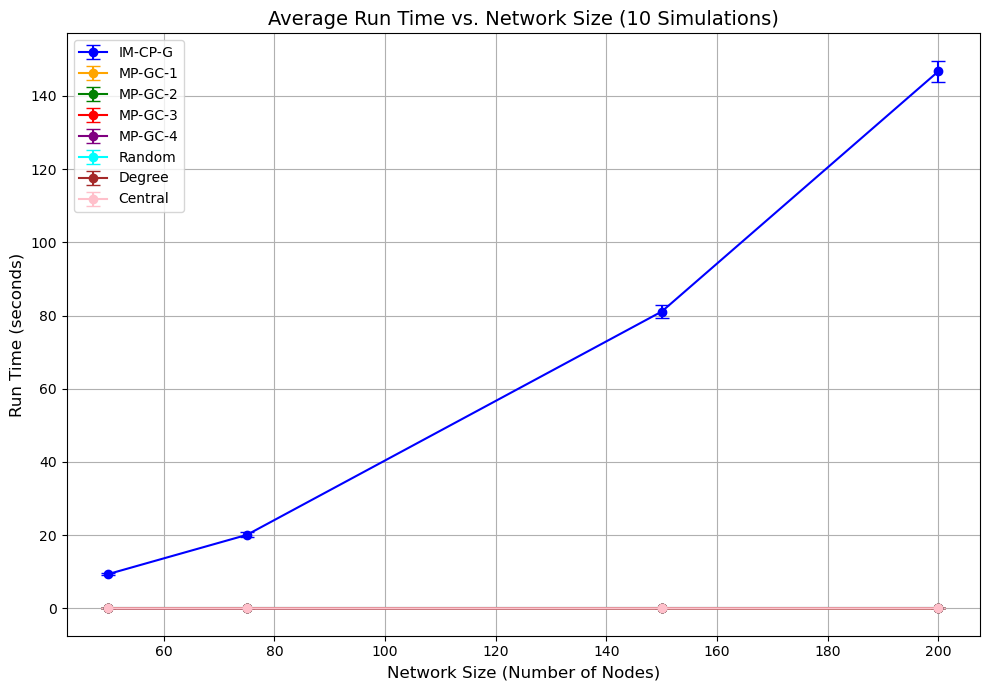

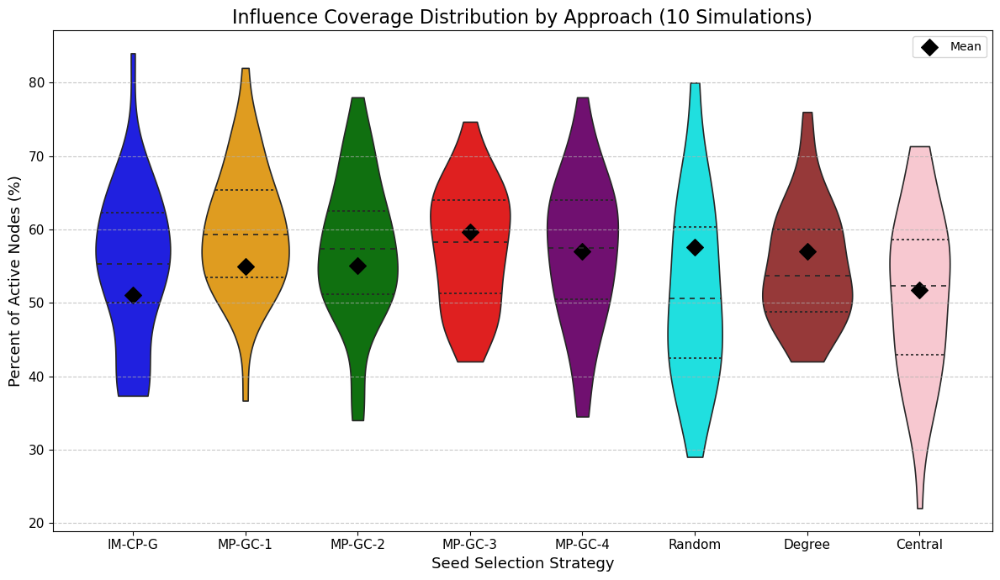

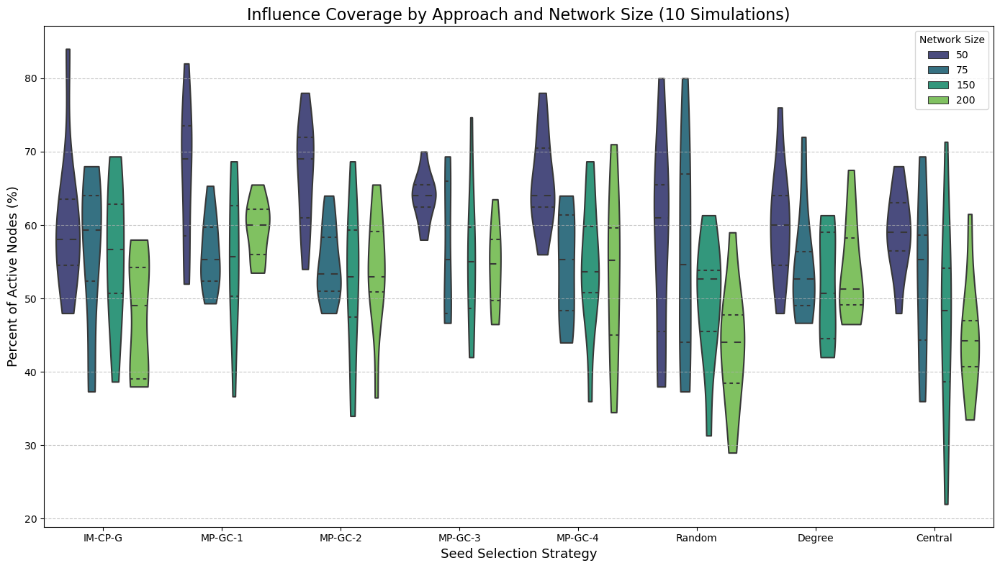

In [21]:



# RUN SIMS
if __name__ == "__main__":
    sizes = [50, 75, 150, 200]  #graph sizes to test
    #sizes = [25, 50]
    k = 10           # number of seeds for each experiment
    #p = 0.3           # activation probability for each edge
    graph_seed = 42
    num_simulations = 10  # Number of simulations to run
    
    # params for the custom graph
    nodes_per_cluster = 25
    # fixed
    inter_connect_prob = 0.01

    # dictionaries to store results from all simulations
    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central' ]
    
    # hold all simulation results
    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': []
        } for approach in approaches
    }

    # loop to run multiple simulations
    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        # sim specific data
        sim_results = {
            approach: {
                'run_times': [],
                'active_counts': []
            } for approach in approaches
        }
        
        # loop over the different graph sizes
        for size in sizes:
            print(f"\n=== Graph size: {size} ===")
            
            #########################################
            # build the graph  
             # get number of clusters
            num_clusters = size // nodes_per_cluster
            if num_clusters == 0:
                continue

            # generate clustered BA graph
            G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      
            
            
            
            
            
    
            # set at 0.1
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1
            
            ##################################################################################
                       
                       
            # GEEDY (IM-CP-G)
            
            start_time = time.time()
            opt_seeds = find_optimal_seeds(G, k, activation_probabilities)
            elapsed_time = time.time() - start_time
            final_active_nodes = independent_cascade(G, opt_seeds, activation_probabilities)
            
            print(f"[IM-CP-G] Seeds: {opt_seeds}")
            print(f"[IM-CP-G] Active count: {len(final_active_nodes)} ({100 * len(final_active_nodes) / size:.1f}%)")
            print(f"[IM-CP-G] Time: {elapsed_time:.4f} sec")
            
            sim_results['IM-CP-G']['run_times'].append(elapsed_time)
            sim_results['IM-CP-G']['active_counts'].append(len(final_active_nodes))
            
            ##################################################################################
            
            
            # MP-GC-1
            
            start_time_mp_1 = time.time()
            mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
            elapsed_time_mp_1 = time.time() - start_time_mp_1
            final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
            
            print(f"['MP-GC-1] Seeds: {mp_seeds_1}")
            print(f"['MP-GC-1] Active count: {len(final_active_nodes_mp_1)} ({100 * len(final_active_nodes_mp_1) / size:.1f}%)")
            print(f"['MP-GC-1] Time: {elapsed_time_mp_1:.4f} sec")
            
            sim_results['MP-GC-1']['run_times'].append(elapsed_time_mp_1)
            sim_results['MP-GC-1']['active_counts'].append(len(final_active_nodes_mp_1))
            
             ##################################################################################
            
        
            ###  MP-GC-2
            
            
            start_time_mp_2= time.time()
            mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k, threshold=threshold)
            elapsed_time_mp_2 = time.time() - start_time_mp_2
            final_active_nodes_mp_2= independent_cascade(G, mp_seeds_2, activation_probabilities)
            
            print(f"[MP-GC-2] Seeds: {mp_seeds_2}")
            print(f"[MP-GC-2] Active count: {len(final_active_nodes_mp_2)} ({100 * len(final_active_nodes_mp_2) / size:.1f}%)")
            print(f"[MP-GC-2] Time: {elapsed_time_mp_2:.4f} sec")
            
            sim_results['MP-GC-2']['run_times'].append(elapsed_time_mp_2)
            sim_results['MP-GC-2']['active_counts'].append(len(final_active_nodes_mp_2))
            
            
            
            ##################################################################################
            
            
             ### MP-GC-3
               
            start_time_cc = time.time()
            mu_values_cc = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            cc_seeds = pick_seeds_across_components_3(G, mu_values_cc, k)
            elapsed_time_cc = time.time() - start_time_cc
            final_active_nodes_cc = independent_cascade(G, cc_seeds, activation_probabilities)
            
            print(f"[MP-GC-3] Seeds: {cc_seeds}")
            print(f"[MP-GC-3] Active count: {len(final_active_nodes_cc)} ({100 * len(final_active_nodes_cc) / size:.1f}%)")
            print(f"[MP-GC-3] Time: {elapsed_time_cc:.4f} sec")
            
            sim_results['MP-GC-3']['run_times'].append(elapsed_time_cc)
            sim_results['MP-GC-3']['active_counts'].append(len(final_active_nodes_cc))
            
            
            ##################################################################################
            
            #MP-GC-4
            
            start_time_sp = time.time()
            #sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            #_, _, sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_seeds = sp_result['seeds_percolation']
            elapsed_time_sp = time.time() - start_time_sp
            final_active_nodes_sp = independent_cascade(G, sp_seeds, activation_probabilities)
            
            print(f"[MP-GC-4] Seeds: {sp_seeds}")
            print(f"[MP-GC-4] Active count: {len(final_active_nodes_sp)} ({100 * len(final_active_nodes_sp) / size:.1f}%)")
            print(f"[MP-GC-4] Time: {elapsed_time_sp:.4f} sec")
            
            sim_results['MP-GC-4']['run_times'].append(elapsed_time_sp)
            sim_results['MP-GC-4']['active_counts'].append(len(final_active_nodes_sp))
            
            ##################################################################################
                 
                 
        
            # heusistics
            
            ##################################################################################
            
            
            ###  Random Seeds
            start_time_rand = time.time()
            random_seeds = pick_random_seeds(G, k)
            elapsed_time_rand = time.time() - start_time_rand
            final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
            
            print(f"[Random Seeds] Seeds: {random_seeds}")
            print(f"[Random Seeds] Active count: {len(final_active_nodes_rand)} ({100 * len(final_active_nodes_rand) / size:.1f}%)")
            print(f"[Random Seeds] Time: {elapsed_time_rand:.4f} sec")
            
            sim_results['Random']['run_times'].append(elapsed_time_rand)
            sim_results['Random']['active_counts'].append(len(final_active_nodes_rand))
            
            ##################################################################################
              
              
            ### Highest Degree Nodes
            start_time_degree = time.time()
            degree_seeds = pick_highest_degree_seeds(G, k)
            elapsed_time_degree = time.time() - start_time_degree
            final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
            
            print(f"[Highest Degree] Seeds: {degree_seeds}")
            print(f"[Highest Degree] Active count: {len(final_active_nodes_degree)} ({100 * len(final_active_nodes_degree) / size:.1f}%)")
            print(f"[Highest Degree] Time: {elapsed_time_degree:.4f} sec")
            
            sim_results['Degree']['run_times'].append(elapsed_time_degree)
            sim_results['Degree']['active_counts'].append(len(final_active_nodes_degree))
            
            ##################################################################################
            
            ### Central Nodes (Closeness Centrality)
            start_time_central = time.time()
            central_seeds = pick_central_nodes(G, k)
            elapsed_time_central = time.time() - start_time_central
            final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
            
            print(f"[Central Nodes] Seeds: {central_seeds}")
            print(f"[Central Nodes] Active count: {len(final_active_nodes_central)} ({100 * len(final_active_nodes_central) / size:.1f}%)")
            print(f"[Central Nodes] Time: {elapsed_time_central:.4f} sec")
            
            sim_results['Central']['run_times'].append(elapsed_time_central)
            sim_results['Central']['active_counts'].append(len(final_active_nodes_central))
        
        
          ##################################################################################
          
          
        # save the results of this simulation
        for approach in approaches:
            all_results[approach]['run_times'].append(sim_results[approach]['run_times'])
            all_results[approach]['active_counts'].append(sim_results[approach]['active_counts'])
            
            # calculate percent active for this simulation
            percent_active = [100 * count / size for count, size in zip(sim_results[approach]['active_counts'], sizes)]
            all_results[approach]['percent_active'].append(percent_active)
    
    # averages across all simulations
    avg_results = {
        approach: {
            'avg_run_times': np.mean(np.array(all_results[approach]['run_times']), axis=0),
            'avg_active_counts': np.mean(np.array(all_results[approach]['active_counts']), axis=0),
            'avg_percent_active': np.mean(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    
    # standard deviations for error bars
    std_results = {
        approach: {
            'std_run_times': np.std(np.array(all_results[approach]['run_times']), axis=0),
            'std_active_counts': np.std(np.array(all_results[approach]['active_counts']), axis=0),
            'std_percent_active': np.std(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    

     
      ##################################################################################
    # Plotting
    # colors     
    colors = {
        'IM-CP-G': 'blue',
        'MP-GC-1': 'orange',
        'MP-GC-2': 'green',
        'MP-GC-3': 'red',
        'MP-GC-4': 'purple',
        'Random': 'cyan',
        'Degree': 'brown',
        'Central': 'pink'
    }
    
    # first plot, netowrk size vs runtime
    plt.figure(figsize=(10, 7))
    for approach in approaches:
        plt.errorbar(
            sizes, 
            avg_results[approach]['avg_run_times'], 
            yerr=std_results[approach]['std_run_times'],
            marker='o', 
            color=colors[approach], 
            label=approach,
            capsize=5
        )
    plt.xlabel("Network Size (Number of Nodes)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.title("Average Run Time vs. Network Size (10 Simulations)", fontsize=14)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    #Violin Plot of Percent Active Nodes by Approach
    # ------------------------------------------------------------------
    violin_data = []
    
    for approach in approaches:
        for sim_idx in range(num_simulations):
            for size_idx, size in enumerate(sizes):
                violin_data.append({
                    'Approach': approach,
                    'Percent Active': all_results[approach]['percent_active'][sim_idx][size_idx],
                    'Network Size': size
                })
    
    df = pd.DataFrame(violin_data)

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette=colors,
        inner="quartile",  # Shows median and IQR
        linewidth=1.2,
        cut=0
    )
    
    #mean is black diamond
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    
    # Final touches
    plt.title("Influence Coverage Distribution by Approach (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    
    
    
   # Violin Plot of Percent Active by Approach and Network Size
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        hue="Network Size",
        data=df,
        palette="viridis",
        #split=True,
        inner="quartile",
        cut=0
    )
    
    plt.title("Influence Coverage by Approach and Network Size (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Network Size", fontsize=10)
    plt.tight_layout()
    plt.show()

# Custom Barabasi Albert Graphs witth compleltly disconnected compnents

# visual

Total edges in clustered BA graph: 300
Total edges in clustered BA graph: 450
Total edges in clustered BA graph: 900
Total edges in clustered BA graph: 1200


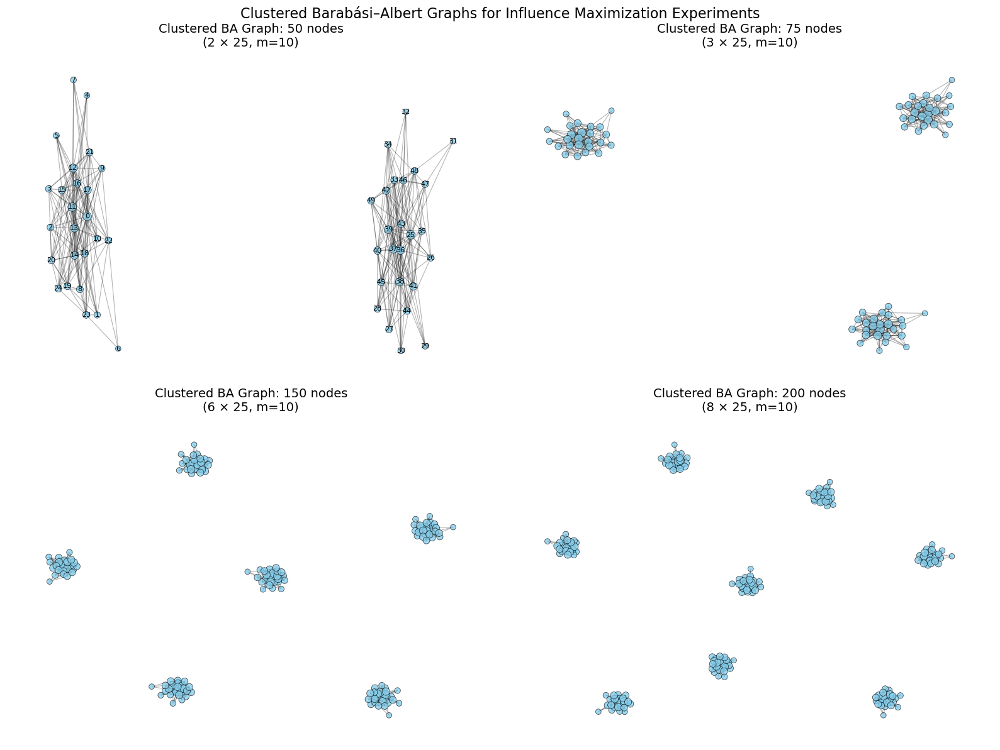

In [22]:

# custom BA graph
# key here
def generate_clustered_ba_graph(num_clusters, nodes_per_cluster, m, inter_connect_prob, seed=None):
    
    """
    Generate a graph composed of multiple Barabási–Albert (BA) clusters with light interconnections between them

    """
    G = nx.Graph()
    offset = 0
    cluster_nodes = []
    rng = random.Random(seed)

    # seperable BA graph
    for i in range(num_clusters):
        ba = nx.barabasi_albert_graph(n=nodes_per_cluster, m=m, seed=seed)
        mapping = {node: node + offset for node in ba.nodes()}
        ba = nx.relabel_nodes(ba, mapping)
        G.add_nodes_from(ba.nodes())
        G.add_edges_from(ba.edges())
        cluster_nodes.append(list(mapping.values()))
        offset += nodes_per_cluster

    # Sconnect them
    for i in range(num_clusters):
        for j in range(i + 1, num_clusters):
            for u in cluster_nodes[i]:
                for v in cluster_nodes[j]:
                    if rng.random() < inter_connect_prob:
                        G.add_edge(u, v)
    print(f"Total edges in clustered BA graph: {G.number_of_edges()}")
    return G


# plot
plt.figure(figsize=(16, 12))

sizes = [50, 75, 150, 200]
#sizes = [50, 100]
edges = 10  #m
seed = 42
# fixed
nodes_per_cluster = 25
# fixed
# key change here
# disconnected
inter_connect_prob = 0.00

for i, total_nodes in enumerate(sizes):
    
    # get number of clusters
    num_clusters = total_nodes // nodes_per_cluster
    if num_clusters == 0:
        continue

    # generate clustered BA graph
    G = generate_clustered_ba_graph(
        num_clusters=num_clusters,
        nodes_per_cluster=nodes_per_cluster,
        m=edges,
        inter_connect_prob=inter_connect_prob,
        seed=seed
    )

    # subplot
    ax = plt.subplot(2, 2, i+1)
    pos = nx.spring_layout(G, seed=seed)

    node_sizes = [30 + 3 * G.degree(node) for node in G.nodes()]
    
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue',
                           alpha=0.8, edgecolors='black', linewidths=0.5)
    nx.draw_networkx_edges(G, pos, alpha=0.3, width=0.8)
    
    if total_nodes <= 50:
        nx.draw_networkx_labels(G, pos, font_size=8)

    plt.title(f"Clustered BA Graph: {total_nodes} nodes\n({num_clusters} × {nodes_per_cluster}, m={edges})", fontsize=14)
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Clustered Barabási–Albert Graphs for Influence Maximization Experiments", fontsize=16, y=0.99)
plt.subplots_adjust(top=0.93)
plt.show()

### approach 3 and 4



Total edges in clustered BA graph: 750
Converged after 2 iterations.
[11, 36, 61]


/var/folders/ln/5vd2y_gn2_g8qft7kqsyrp4m0000gn/T/ipykernel_28372/3070069492.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="mu (Prob NOT in GC)")


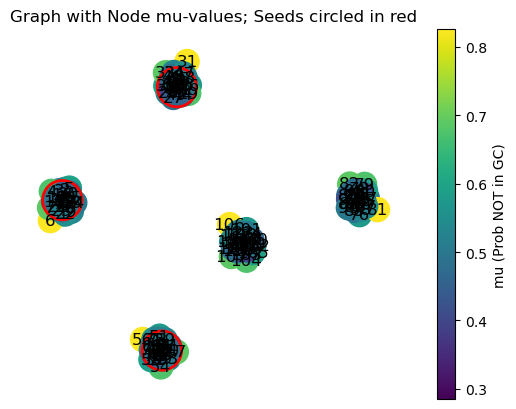

In [23]:
# plot the nodes and their probs
def plot_graph(G, mu_values=None, seed_nodes=None):
    pos = nx.spring_layout(G, seed=42)
    
    if mu_values is not None:
        cmap = plt.cm.viridis
        node_color = [mu_values[node] for node in G.nodes()]
        nodes = nx.draw_networkx_nodes(G, pos, node_color=node_color, cmap=cmap)
        nx.draw_networkx_edges(G, pos)
        nx.draw_networkx_labels(G, pos)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(mu_values.values()), 
                                                                 vmax=max(mu_values.values())))
        sm.set_array([])
        plt.colorbar(sm, label="mu (Prob NOT in GC)")
        
        if seed_nodes is not None:
            nx.draw_networkx_nodes(
                G, pos,
                nodelist=seed_nodes,
                node_color="none",
                edgecolors="red",
                node_size=800,
                linewidths=2
            )
    else:
        nx.draw(G, pos, with_labels=True)
    
    plt.title("Graph with Node mu-values; Seeds circled in red")
    plt.axis('off')
    plt.show()

G = generate_clustered_ba_graph(
    num_clusters=5,
    nodes_per_cluster=25,
    m=10,
    inter_connect_prob=0.00,
    seed=42
)

# activation probabilities
activation_probabilities = {}
for u, v in G.edges():
    activation_probabilities[(u, v)] = 0.1
    activation_probabilities[(v, u)] = 0.1
                
                
mu_values = compute_not_in_giant_component_probabilities(G, activation_probabilities)

# k
k = 3
seeds = pick_seeds_across_components_3(G, mu_values, k)
#seeds = result['seeds_percolation']
print(seeds)
# visualize
plot_graph(G, mu_values=mu_values, seed_nodes=seeds)

Total edges in clustered BA graph: 750
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
[11, 36, 86]


/var/folders/ln/5vd2y_gn2_g8qft7kqsyrp4m0000gn/T/ipykernel_28372/832886065.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="mu (Prob NOT in GC)")


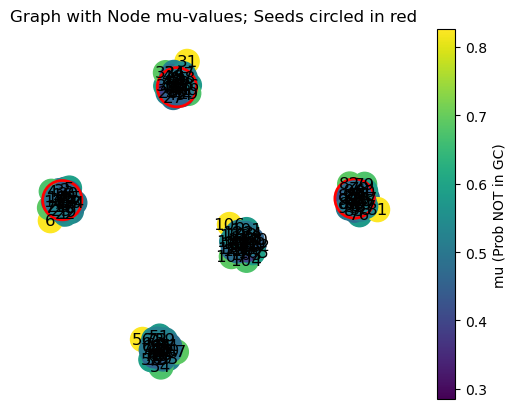

In [24]:
# plot the nodes and their probs
def plot_graph(G, mu_values=None, seed_nodes=None):
    pos = nx.spring_layout(G, seed=42)
    
    if mu_values is not None:
        cmap = plt.cm.viridis
        node_color = [mu_values[node] for node in G.nodes()]
        nodes = nx.draw_networkx_nodes(G, pos, node_color=node_color, cmap=cmap)
        nx.draw_networkx_edges(G, pos)
        nx.draw_networkx_labels(G, pos)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(mu_values.values()), 
                                                                 vmax=max(mu_values.values())))
        sm.set_array([])
        plt.colorbar(sm, label="mu (Prob NOT in GC)")
        
        if seed_nodes is not None:
            nx.draw_networkx_nodes(
                G, pos,
                nodelist=seed_nodes,
                node_color="none",
                edgecolors="red",
                node_size=800,
                linewidths=2
            )
    else:
        nx.draw(G, pos, with_labels=True)
    
    plt.title("Graph with Node mu-values; Seeds circled in red")
    plt.axis('off')
    plt.show()

G = generate_clustered_ba_graph(
    num_clusters=5,
    nodes_per_cluster=25,
    m=10,
    inter_connect_prob=0.00,
    seed=42
)

# activation probabilities
activation_probabilities = {}
for u, v in G.edges():
    activation_probabilities[(u, v)] = 0.1
    activation_probabilities[(v, u)] = 0.1
                
                
mu_values = compute_not_in_giant_component_probabilities(G, activation_probabilities)

# k
k = 3
result = select_seeds_spectral_percolation(G, activation_probabilities, k)
seeds = result['seeds_percolation']
print(seeds)
# visualize
plot_graph(G, mu_values=mu_values, seed_nodes=seeds)

### # Results - 5,  Custom Barabasi Albert Graphs with k=3 compleltly disconnected


======== SIMULATION 1/10 ========

=== Graph size: 50 ===
Total edges in clustered BA graph: 300
[IM-CP-G] Seeds: [25, 11, 22]
[IM-CP-G] Active count: 27 (54.0%)
[IM-CP-G] Time: 1.7968 sec
Converged after 2 iterations.
['MP-GC-1] Seeds: [11, 36, 0]
['MP-GC-1] Active count: 32 (64.0%)
['MP-GC-1] Time: 0.0024 sec
Converged after 2 iterations.
[MP-GC-2] Seeds: [11, 36, 0]
[MP-GC-2] Active count: 23 (46.0%)
[MP-GC-2] Time: 0.0025 sec
Converged after 2 iterations.
[MP-GC-3] Seeds: [11, 36, 0]
[MP-GC-3] Active count: 31 (62.0%)
[MP-GC-3] Time: 0.0027 sec
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
[MP-GC-4] Seeds: [0, 11, 36]
[MP-GC-4] Active count: 22 (44.0%)
[MP-GC-4] Time: 0.0099 sec
[Random Seeds] Seeds: [19, 28, 40]
[Random Seeds] Active count: 28 (56.0%)
[Random Seeds] Time: 0.0000 sec
[Highest Degree] Seeds: [0, 11, 25]
[Highest Degree] Active count: 24 (48.0%)
[Highest Degree] T

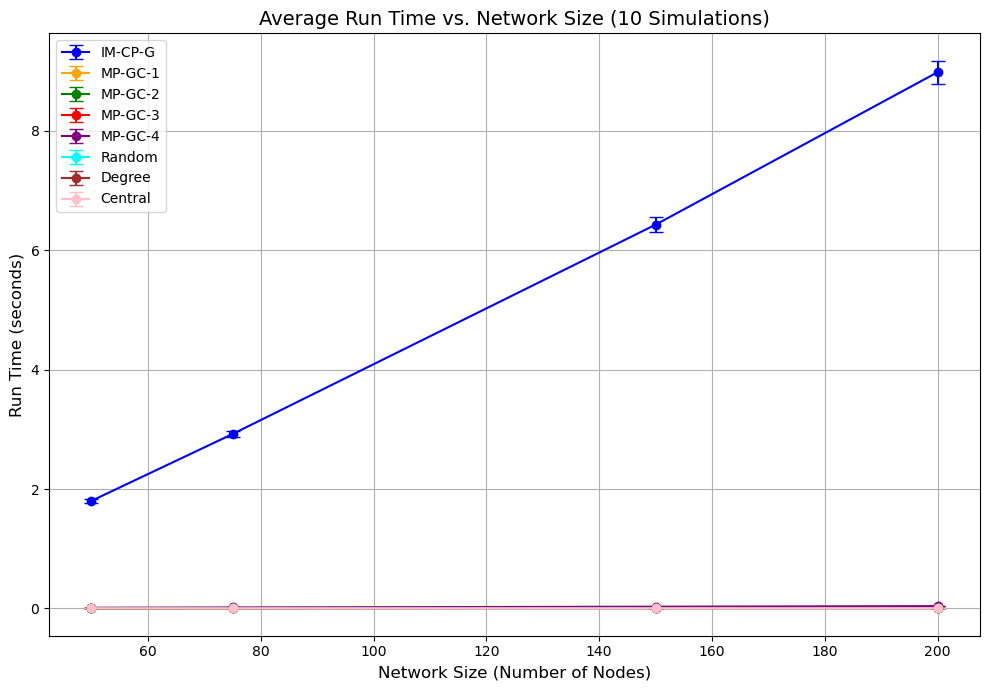

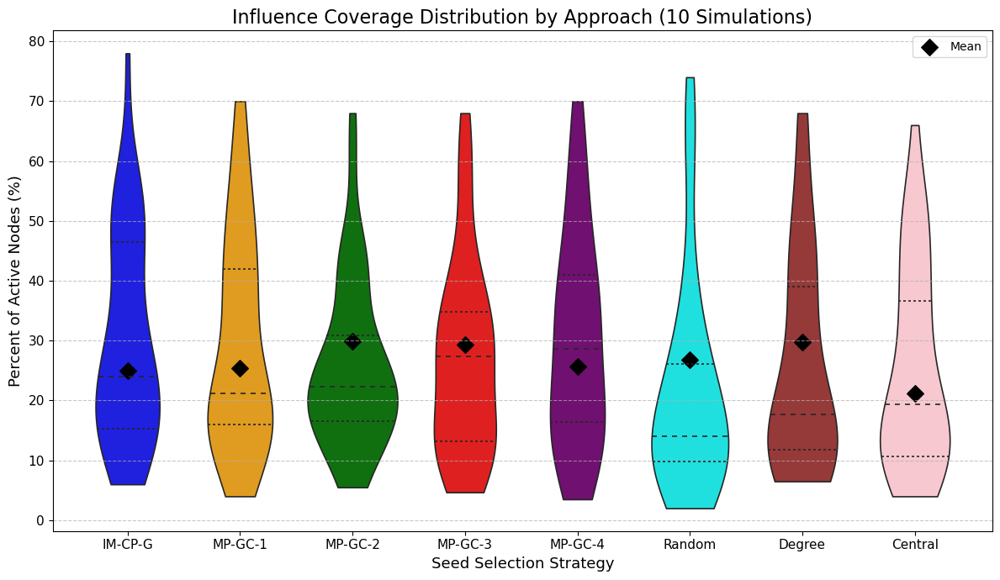

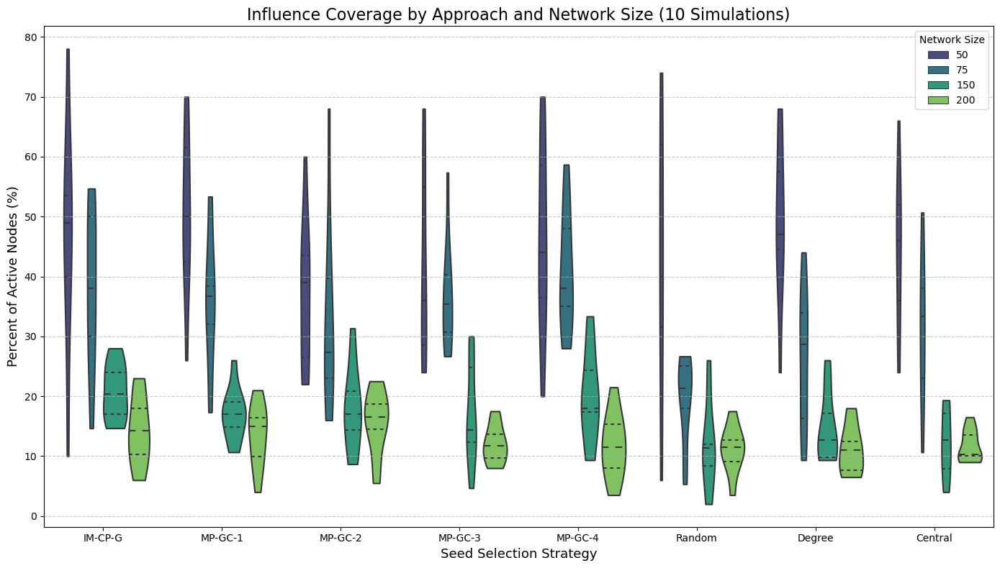

In [25]:



# RUN SIMS
if __name__ == "__main__":
    sizes = [50, 75, 150, 200]  #graph sizes to test
    #sizes = [25, 50]
    k = 3           # number of seeds for each experiment
    #p = 0.3           # activation probability for each edge
    graph_seed = 42
    num_simulations = 10  # Number of simulations to run
    
    # params for the custom graph
    nodes_per_cluster = 25
    # fixed
    inter_connect_prob = 0.00

    # dictionaries to store results from all simulations
    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central' ]
    
    # hold all simulation results
    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': []
        } for approach in approaches
    }

    # loop to run multiple simulations
    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        # sim specific data
        sim_results = {
            approach: {
                'run_times': [],
                'active_counts': []
            } for approach in approaches
        }
        
        # loop over the different graph sizes
        for size in sizes:
            print(f"\n=== Graph size: {size} ===")
            
            #########################################
            # build the graph  
             # get number of clusters
            num_clusters = size // nodes_per_cluster
            if num_clusters == 0:
                continue

            # generate clustered BA graph
            G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      
            
            
            
            
            
    
            # set at 0.1
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1
            
            ##################################################################################
                       
                       
            # GEEDY (IM-CP-G)
            
            start_time = time.time()
            opt_seeds = find_optimal_seeds(G, k, activation_probabilities)
            elapsed_time = time.time() - start_time
            final_active_nodes = independent_cascade(G, opt_seeds, activation_probabilities)
            
            print(f"[IM-CP-G] Seeds: {opt_seeds}")
            print(f"[IM-CP-G] Active count: {len(final_active_nodes)} ({100 * len(final_active_nodes) / size:.1f}%)")
            print(f"[IM-CP-G] Time: {elapsed_time:.4f} sec")
            
            sim_results['IM-CP-G']['run_times'].append(elapsed_time)
            sim_results['IM-CP-G']['active_counts'].append(len(final_active_nodes))
            
            ##################################################################################
            
            
            # MP-GC-1
            
            start_time_mp_1 = time.time()
            mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
            elapsed_time_mp_1 = time.time() - start_time_mp_1
            final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
            
            print(f"['MP-GC-1] Seeds: {mp_seeds_1}")
            print(f"['MP-GC-1] Active count: {len(final_active_nodes_mp_1)} ({100 * len(final_active_nodes_mp_1) / size:.1f}%)")
            print(f"['MP-GC-1] Time: {elapsed_time_mp_1:.4f} sec")
            
            sim_results['MP-GC-1']['run_times'].append(elapsed_time_mp_1)
            sim_results['MP-GC-1']['active_counts'].append(len(final_active_nodes_mp_1))
            
             ##################################################################################
            
        
            ###  MP-GC-2
            
            
            start_time_mp_2= time.time()
            mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k, threshold=threshold)
            elapsed_time_mp_2 = time.time() - start_time_mp_2
            final_active_nodes_mp_2= independent_cascade(G, mp_seeds_2, activation_probabilities)
            
            print(f"[MP-GC-2] Seeds: {mp_seeds_2}")
            print(f"[MP-GC-2] Active count: {len(final_active_nodes_mp_2)} ({100 * len(final_active_nodes_mp_2) / size:.1f}%)")
            print(f"[MP-GC-2] Time: {elapsed_time_mp_2:.4f} sec")
            
            sim_results['MP-GC-2']['run_times'].append(elapsed_time_mp_2)
            sim_results['MP-GC-2']['active_counts'].append(len(final_active_nodes_mp_2))
            
            
            
            ##################################################################################
            
            
             ### MP-GC-3
               
            start_time_cc = time.time()
            mu_values_cc = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            cc_seeds = pick_seeds_across_components_3(G, mu_values_cc, k)
            elapsed_time_cc = time.time() - start_time_cc
            final_active_nodes_cc = independent_cascade(G, cc_seeds, activation_probabilities)
            
            print(f"[MP-GC-3] Seeds: {cc_seeds}")
            print(f"[MP-GC-3] Active count: {len(final_active_nodes_cc)} ({100 * len(final_active_nodes_cc) / size:.1f}%)")
            print(f"[MP-GC-3] Time: {elapsed_time_cc:.4f} sec")
            
            sim_results['MP-GC-3']['run_times'].append(elapsed_time_cc)
            sim_results['MP-GC-3']['active_counts'].append(len(final_active_nodes_cc))
            
            
            ##################################################################################
            
            #MP-GC-4
            
            start_time_sp = time.time()
            #sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            #_, _, sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_seeds = sp_result['seeds_percolation']
            elapsed_time_sp = time.time() - start_time_sp
            final_active_nodes_sp = independent_cascade(G, sp_seeds, activation_probabilities)
            
            print(f"[MP-GC-4] Seeds: {sp_seeds}")
            print(f"[MP-GC-4] Active count: {len(final_active_nodes_sp)} ({100 * len(final_active_nodes_sp) / size:.1f}%)")
            print(f"[MP-GC-4] Time: {elapsed_time_sp:.4f} sec")
            
            sim_results['MP-GC-4']['run_times'].append(elapsed_time_sp)
            sim_results['MP-GC-4']['active_counts'].append(len(final_active_nodes_sp))
            
            ##################################################################################
                 
                 
        
            # heusistics
            
            ##################################################################################
            
            
            ###  Random Seeds
            start_time_rand = time.time()
            random_seeds = pick_random_seeds(G, k)
            elapsed_time_rand = time.time() - start_time_rand
            final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
            
            print(f"[Random Seeds] Seeds: {random_seeds}")
            print(f"[Random Seeds] Active count: {len(final_active_nodes_rand)} ({100 * len(final_active_nodes_rand) / size:.1f}%)")
            print(f"[Random Seeds] Time: {elapsed_time_rand:.4f} sec")
            
            sim_results['Random']['run_times'].append(elapsed_time_rand)
            sim_results['Random']['active_counts'].append(len(final_active_nodes_rand))
            
            ##################################################################################
              
              
            ### Highest Degree Nodes
            start_time_degree = time.time()
            degree_seeds = pick_highest_degree_seeds(G, k)
            elapsed_time_degree = time.time() - start_time_degree
            final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
            
            print(f"[Highest Degree] Seeds: {degree_seeds}")
            print(f"[Highest Degree] Active count: {len(final_active_nodes_degree)} ({100 * len(final_active_nodes_degree) / size:.1f}%)")
            print(f"[Highest Degree] Time: {elapsed_time_degree:.4f} sec")
            
            sim_results['Degree']['run_times'].append(elapsed_time_degree)
            sim_results['Degree']['active_counts'].append(len(final_active_nodes_degree))
            
            ##################################################################################
            
            ### Central Nodes (Closeness Centrality)
            start_time_central = time.time()
            central_seeds = pick_central_nodes(G, k)
            elapsed_time_central = time.time() - start_time_central
            final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
            
            print(f"[Central Nodes] Seeds: {central_seeds}")
            print(f"[Central Nodes] Active count: {len(final_active_nodes_central)} ({100 * len(final_active_nodes_central) / size:.1f}%)")
            print(f"[Central Nodes] Time: {elapsed_time_central:.4f} sec")
            
            sim_results['Central']['run_times'].append(elapsed_time_central)
            sim_results['Central']['active_counts'].append(len(final_active_nodes_central))
        
        
          ##################################################################################
          
          
        # save the results of this simulation
        for approach in approaches:
            all_results[approach]['run_times'].append(sim_results[approach]['run_times'])
            all_results[approach]['active_counts'].append(sim_results[approach]['active_counts'])
            
            # calculate percent active for this simulation
            percent_active = [100 * count / size for count, size in zip(sim_results[approach]['active_counts'], sizes)]
            all_results[approach]['percent_active'].append(percent_active)
    
    # averages across all simulations
    avg_results = {
        approach: {
            'avg_run_times': np.mean(np.array(all_results[approach]['run_times']), axis=0),
            'avg_active_counts': np.mean(np.array(all_results[approach]['active_counts']), axis=0),
            'avg_percent_active': np.mean(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    
    # standard deviations for error bars
    std_results = {
        approach: {
            'std_run_times': np.std(np.array(all_results[approach]['run_times']), axis=0),
            'std_active_counts': np.std(np.array(all_results[approach]['active_counts']), axis=0),
            'std_percent_active': np.std(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    

     
      ##################################################################################
    # Plotting
    # colors     
    colors = {
        'IM-CP-G': 'blue',
        'MP-GC-1': 'orange',
        'MP-GC-2': 'green',
        'MP-GC-3': 'red',
        'MP-GC-4': 'purple',
        'Random': 'cyan',
        'Degree': 'brown',
        'Central': 'pink'
    }
    
    # first plot, netowrk size vs runtime
    plt.figure(figsize=(10, 7))
    for approach in approaches:
        plt.errorbar(
            sizes, 
            avg_results[approach]['avg_run_times'], 
            yerr=std_results[approach]['std_run_times'],
            marker='o', 
            color=colors[approach], 
            label=approach,
            capsize=5
        )
    plt.xlabel("Network Size (Number of Nodes)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.title("Average Run Time vs. Network Size (10 Simulations)", fontsize=14)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    #Violin Plot of Percent Active Nodes by Approach
    # ------------------------------------------------------------------
    violin_data = []
    
    for approach in approaches:
        for sim_idx in range(num_simulations):
            for size_idx, size in enumerate(sizes):
                violin_data.append({
                    'Approach': approach,
                    'Percent Active': all_results[approach]['percent_active'][sim_idx][size_idx],
                    'Network Size': size
                })
    
    df = pd.DataFrame(violin_data)

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette=colors,
        inner="quartile",  # Shows median and IQR
        linewidth=1.2,
        cut=0
    )
    
    #mean is black diamond
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    
    # Final touches
    plt.title("Influence Coverage Distribution by Approach (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    
    
    
   # Violin Plot of Percent Active by Approach and Network Size
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        hue="Network Size",
        data=df,
        palette="viridis",
        #split=True,
        inner="quartile",
        cut=0
    )
    
    plt.title("Influence Coverage by Approach and Network Size (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Network Size", fontsize=10)
    plt.tight_layout()
    plt.show()

### # Results - 6,  Custom Barabasi Albert Graphs with k=10 compleltly disconnected


======== SIMULATION 1/10 ========

=== Graph size: 50 ===
Total edges in clustered BA graph: 300
[IM-CP-G] Seeds: [14, 38, 16, 35, 25, 20, 1, 22, 29, 37]
[IM-CP-G] Active count: 37 (74.0%)
[IM-CP-G] Time: 8.7119 sec
Converged after 2 iterations.
['MP-GC-1] Seeds: [11, 36, 0, 25, 13, 38, 12, 37, 14, 39]
['MP-GC-1] Active count: 25 (50.0%)
['MP-GC-1] Time: 0.0024 sec
Converged after 2 iterations.
[MP-GC-2] Seeds: [11, 36, 0, 25, 13, 38, 12, 37, 14, 39]
[MP-GC-2] Active count: 24 (48.0%)
[MP-GC-2] Time: 0.0026 sec
Converged after 2 iterations.
[MP-GC-3] Seeds: [11, 36, 0, 25, 13, 38, 12, 37, 14, 39]
[MP-GC-3] Active count: 32 (64.0%)
[MP-GC-3] Time: 0.0026 sec
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Con

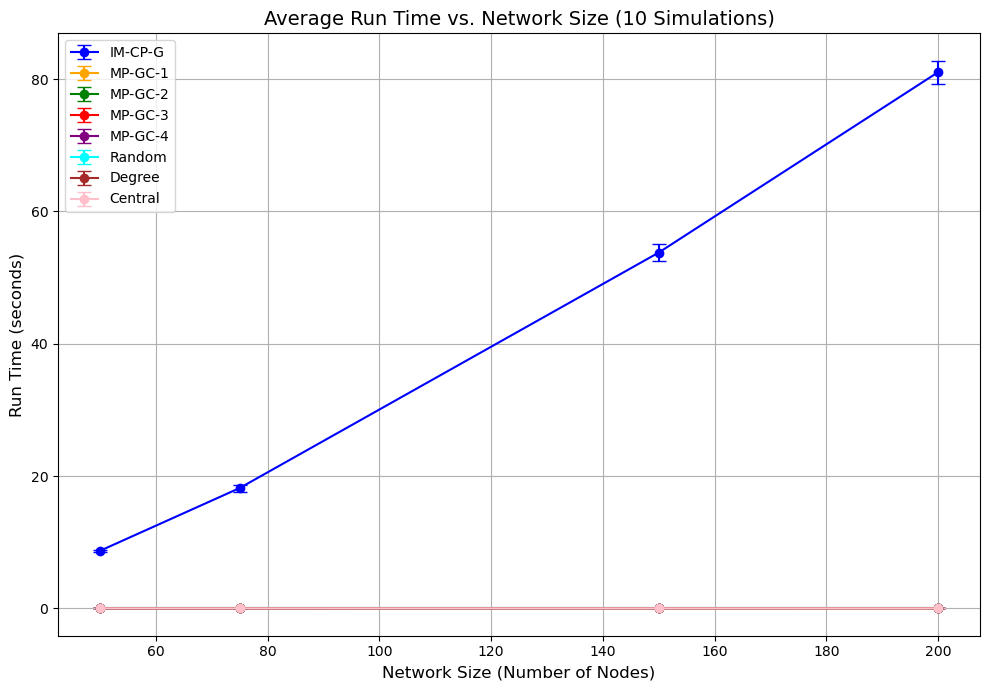

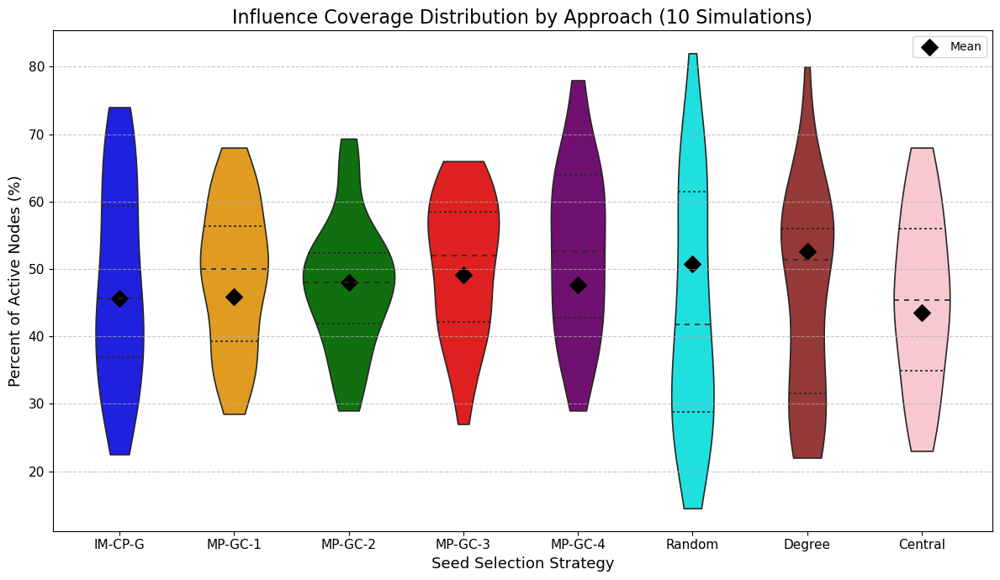

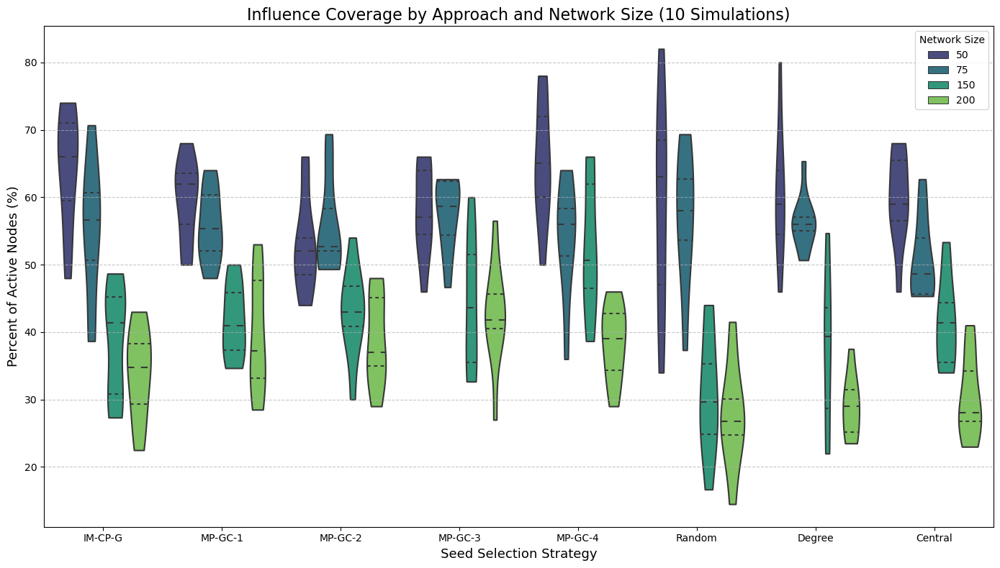

In [26]:



# RUN SIMS
if __name__ == "__main__":
    sizes = [50, 75, 150, 200]  #graph sizes to test
    #sizes = [25, 50]
    k = 10           # number of seeds for each experiment
    #p = 0.3           # activation probability for each edge
    graph_seed = 42
    num_simulations = 10  # Number of simulations to run
    
    # params for the custom graph
    nodes_per_cluster = 25
    # fixed
    inter_connect_prob = 0.00

    # dictionaries to store results from all simulations
    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central' ]
    
    # hold all simulation results
    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': []
        } for approach in approaches
    }

    # loop to run multiple simulations
    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        # sim specific data
        sim_results = {
            approach: {
                'run_times': [],
                'active_counts': []
            } for approach in approaches
        }
        
        # loop over the different graph sizes
        for size in sizes:
            print(f"\n=== Graph size: {size} ===")
            
            #########################################
            # build the graph  
             # get number of clusters
            num_clusters = size // nodes_per_cluster
            if num_clusters == 0:
                continue

            # generate clustered BA graph
            G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      
            
            
            
            
            
    
            # set at 0.1
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1
            
            ##################################################################################
                       
                       
            # GEEDY (IM-CP-G)
            
            start_time = time.time()
            opt_seeds = find_optimal_seeds(G, k, activation_probabilities)
            elapsed_time = time.time() - start_time
            final_active_nodes = independent_cascade(G, opt_seeds, activation_probabilities)
            
            print(f"[IM-CP-G] Seeds: {opt_seeds}")
            print(f"[IM-CP-G] Active count: {len(final_active_nodes)} ({100 * len(final_active_nodes) / size:.1f}%)")
            print(f"[IM-CP-G] Time: {elapsed_time:.4f} sec")
            
            sim_results['IM-CP-G']['run_times'].append(elapsed_time)
            sim_results['IM-CP-G']['active_counts'].append(len(final_active_nodes))
            
            ##################################################################################
            
            
            # MP-GC-1
            
            start_time_mp_1 = time.time()
            mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
            elapsed_time_mp_1 = time.time() - start_time_mp_1
            final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
            
            print(f"['MP-GC-1] Seeds: {mp_seeds_1}")
            print(f"['MP-GC-1] Active count: {len(final_active_nodes_mp_1)} ({100 * len(final_active_nodes_mp_1) / size:.1f}%)")
            print(f"['MP-GC-1] Time: {elapsed_time_mp_1:.4f} sec")
            
            sim_results['MP-GC-1']['run_times'].append(elapsed_time_mp_1)
            sim_results['MP-GC-1']['active_counts'].append(len(final_active_nodes_mp_1))
            
             ##################################################################################
            
        
            ###  MP-GC-2
            
            
            start_time_mp_2= time.time()
            mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            threshold = 0.5
            mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k, threshold=threshold)
            elapsed_time_mp_2 = time.time() - start_time_mp_2
            final_active_nodes_mp_2= independent_cascade(G, mp_seeds_2, activation_probabilities)
            
            print(f"[MP-GC-2] Seeds: {mp_seeds_2}")
            print(f"[MP-GC-2] Active count: {len(final_active_nodes_mp_2)} ({100 * len(final_active_nodes_mp_2) / size:.1f}%)")
            print(f"[MP-GC-2] Time: {elapsed_time_mp_2:.4f} sec")
            
            sim_results['MP-GC-2']['run_times'].append(elapsed_time_mp_2)
            sim_results['MP-GC-2']['active_counts'].append(len(final_active_nodes_mp_2))
            
            
            
            ##################################################################################
            
            
             ### MP-GC-3
               
            start_time_cc = time.time()
            mu_values_cc = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            cc_seeds = pick_seeds_across_components_3(G, mu_values_cc, k)
            elapsed_time_cc = time.time() - start_time_cc
            final_active_nodes_cc = independent_cascade(G, cc_seeds, activation_probabilities)
            
            print(f"[MP-GC-3] Seeds: {cc_seeds}")
            print(f"[MP-GC-3] Active count: {len(final_active_nodes_cc)} ({100 * len(final_active_nodes_cc) / size:.1f}%)")
            print(f"[MP-GC-3] Time: {elapsed_time_cc:.4f} sec")
            
            sim_results['MP-GC-3']['run_times'].append(elapsed_time_cc)
            sim_results['MP-GC-3']['active_counts'].append(len(final_active_nodes_cc))
            
            
            ##################################################################################
            
            #MP-GC-4
            
            start_time_sp = time.time()
            #sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            #_, _, sp_seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            sp_seeds = sp_result['seeds_percolation']
            elapsed_time_sp = time.time() - start_time_sp
            final_active_nodes_sp = independent_cascade(G, sp_seeds, activation_probabilities)
            
            print(f"[MP-GC-4] Seeds: {sp_seeds}")
            print(f"[MP-GC-4] Active count: {len(final_active_nodes_sp)} ({100 * len(final_active_nodes_sp) / size:.1f}%)")
            print(f"[MP-GC-4] Time: {elapsed_time_sp:.4f} sec")
            
            sim_results['MP-GC-4']['run_times'].append(elapsed_time_sp)
            sim_results['MP-GC-4']['active_counts'].append(len(final_active_nodes_sp))
            
            ##################################################################################
                 
                 
        
            # heusistics
            
            ##################################################################################
            
            
            ###  Random Seeds
            start_time_rand = time.time()
            random_seeds = pick_random_seeds(G, k)
            elapsed_time_rand = time.time() - start_time_rand
            final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
            
            print(f"[Random Seeds] Seeds: {random_seeds}")
            print(f"[Random Seeds] Active count: {len(final_active_nodes_rand)} ({100 * len(final_active_nodes_rand) / size:.1f}%)")
            print(f"[Random Seeds] Time: {elapsed_time_rand:.4f} sec")
            
            sim_results['Random']['run_times'].append(elapsed_time_rand)
            sim_results['Random']['active_counts'].append(len(final_active_nodes_rand))
            
            ##################################################################################
              
              
            ### Highest Degree Nodes
            start_time_degree = time.time()
            degree_seeds = pick_highest_degree_seeds(G, k)
            elapsed_time_degree = time.time() - start_time_degree
            final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
            
            print(f"[Highest Degree] Seeds: {degree_seeds}")
            print(f"[Highest Degree] Active count: {len(final_active_nodes_degree)} ({100 * len(final_active_nodes_degree) / size:.1f}%)")
            print(f"[Highest Degree] Time: {elapsed_time_degree:.4f} sec")
            
            sim_results['Degree']['run_times'].append(elapsed_time_degree)
            sim_results['Degree']['active_counts'].append(len(final_active_nodes_degree))
            
            ##################################################################################
            
            ### Central Nodes (Closeness Centrality)
            start_time_central = time.time()
            central_seeds = pick_central_nodes(G, k)
            elapsed_time_central = time.time() - start_time_central
            final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
            
            print(f"[Central Nodes] Seeds: {central_seeds}")
            print(f"[Central Nodes] Active count: {len(final_active_nodes_central)} ({100 * len(final_active_nodes_central) / size:.1f}%)")
            print(f"[Central Nodes] Time: {elapsed_time_central:.4f} sec")
            
            sim_results['Central']['run_times'].append(elapsed_time_central)
            sim_results['Central']['active_counts'].append(len(final_active_nodes_central))
        
        
          ##################################################################################
          
          
        # save the results of this simulation
        for approach in approaches:
            all_results[approach]['run_times'].append(sim_results[approach]['run_times'])
            all_results[approach]['active_counts'].append(sim_results[approach]['active_counts'])
            
            # calculate percent active for this simulation
            percent_active = [100 * count / size for count, size in zip(sim_results[approach]['active_counts'], sizes)]
            all_results[approach]['percent_active'].append(percent_active)
    
    # averages across all simulations
    avg_results = {
        approach: {
            'avg_run_times': np.mean(np.array(all_results[approach]['run_times']), axis=0),
            'avg_active_counts': np.mean(np.array(all_results[approach]['active_counts']), axis=0),
            'avg_percent_active': np.mean(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    
    # standard deviations for error bars
    std_results = {
        approach: {
            'std_run_times': np.std(np.array(all_results[approach]['run_times']), axis=0),
            'std_active_counts': np.std(np.array(all_results[approach]['active_counts']), axis=0),
            'std_percent_active': np.std(np.array(all_results[approach]['percent_active']), axis=0)
        } for approach in approaches
    }
    

     
      ##################################################################################
    # Plotting
    # colors     
    colors = {
        'IM-CP-G': 'blue',
        'MP-GC-1': 'orange',
        'MP-GC-2': 'green',
        'MP-GC-3': 'red',
        'MP-GC-4': 'purple',
        'Random': 'cyan',
        'Degree': 'brown',
        'Central': 'pink'
    }
    
    # first plot, netowrk size vs runtime
    plt.figure(figsize=(10, 7))
    for approach in approaches:
        plt.errorbar(
            sizes, 
            avg_results[approach]['avg_run_times'], 
            yerr=std_results[approach]['std_run_times'],
            marker='o', 
            color=colors[approach], 
            label=approach,
            capsize=5
        )
    plt.xlabel("Network Size (Number of Nodes)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.title("Average Run Time vs. Network Size (10 Simulations)", fontsize=14)
    plt.legend(fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    #Violin Plot of Percent Active Nodes by Approach
    # ------------------------------------------------------------------
    violin_data = []
    
    for approach in approaches:
        for sim_idx in range(num_simulations):
            for size_idx, size in enumerate(sizes):
                violin_data.append({
                    'Approach': approach,
                    'Percent Active': all_results[approach]['percent_active'][sim_idx][size_idx],
                    'Network Size': size
                })
    
    df = pd.DataFrame(violin_data)

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette=colors,
        inner="quartile",  # Shows median and IQR
        linewidth=1.2,
        cut=0
    )
    
    #mean is black diamond
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    
    # Final touches
    plt.title("Influence Coverage Distribution by Approach (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
    
    
    
   # Violin Plot of Percent Active by Approach and Network Size
    plt.figure(figsize=(14, 8))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        hue="Network Size",
        data=df,
        palette="viridis",
        #split=True,
        inner="quartile",
        cut=0
    )
    
    plt.title("Influence Coverage by Approach and Network Size (10 Simulations)", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Network Size", fontsize=10)
    plt.tight_layout()
    plt.show()

# Variation in Results by K 


# stock
- size of 100, 25 sims


======== SIMULATION 1/10 ========

=== Number of Seeds: 1 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Number of Seeds: 3 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Number of Seeds: 10 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Numbe

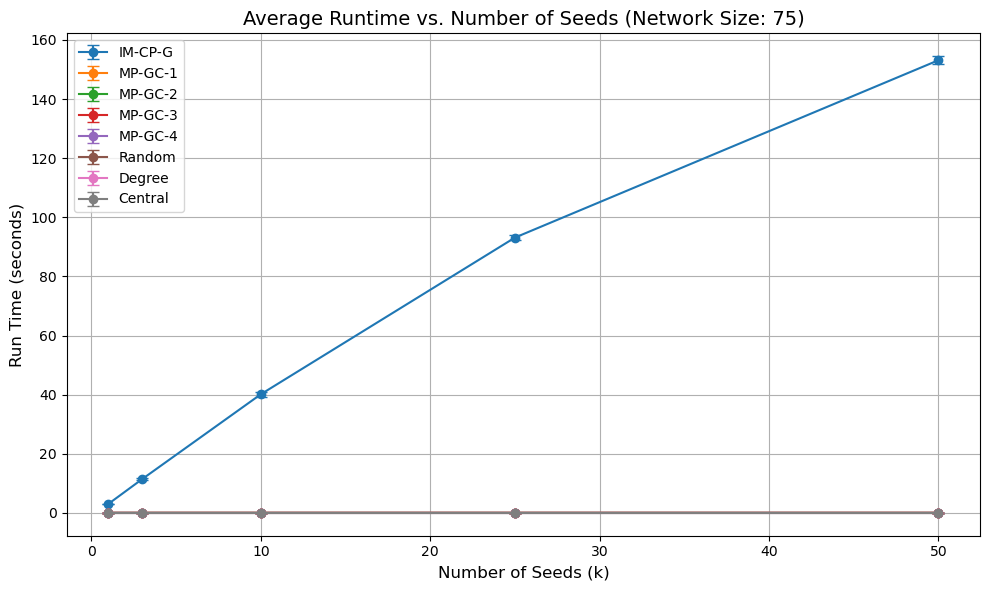

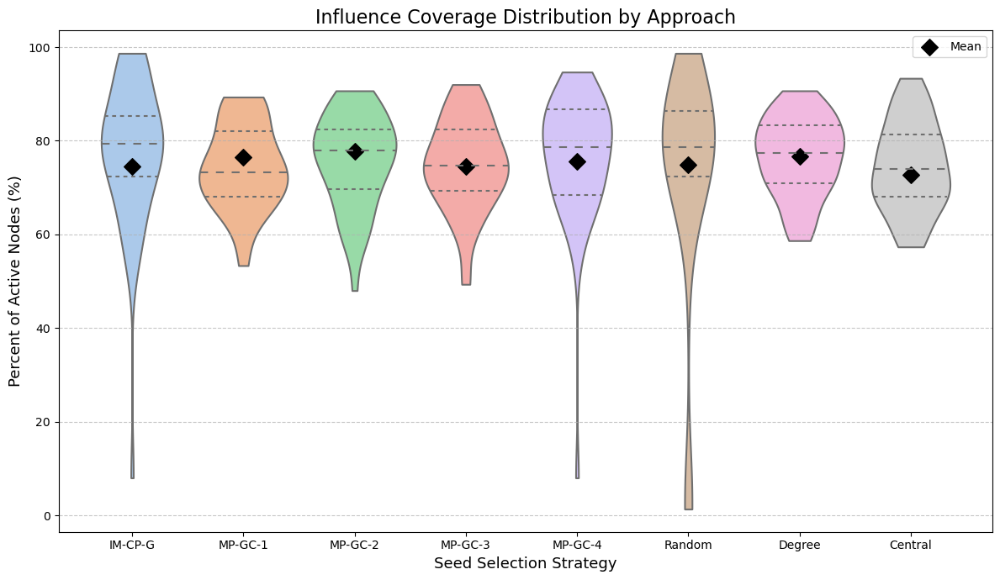

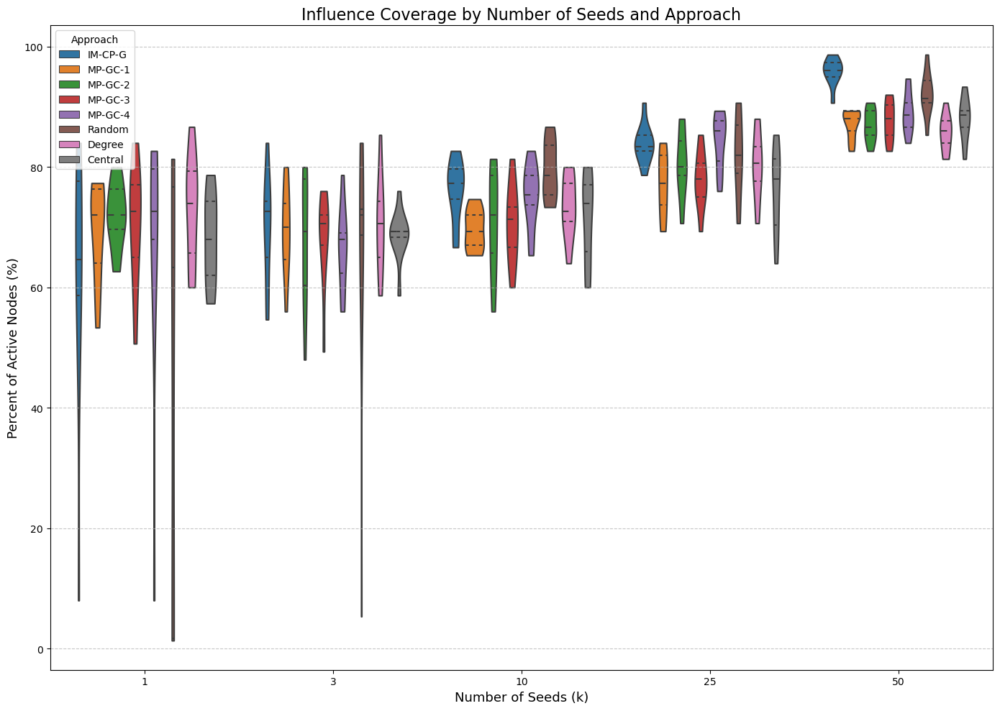

In [27]:


if __name__ == "__main__":
    size = 75  # Fixed network size
    k_values = [1, 3, 10, 25, 50]  # Different values of k to test
    graph_seed = 42
    num_simulations = 10

    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central']

    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': [],
            'k_values': []
        } for approach in approaches
    }

    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")

        G = nx.barabasi_albert_graph(size, 10, seed=graph_seed)
        
        activation_probabilities = {}
        for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1

        for k in k_values:
            print(f"\n=== Number of Seeds: {k} ===")

            def run_and_record(approach, seeds, elapsed):
                final_active = independent_cascade(G, seeds, activation_probabilities)
                all_results[approach]['run_times'].append(elapsed)
                all_results[approach]['active_counts'].append(len(final_active))
                all_results[approach]['percent_active'].append(100 * len(final_active) / size)
                all_results[approach]['k_values'].append(k)

            # Each strategy
            start = time.time(); seeds = find_optimal_seeds(G, k, activation_probabilities); elapsed = time.time() - start
            run_and_record('IM-CP-G', seeds, elapsed)

            start = time.time(); mu1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_by_mu_1(mu1, k); elapsed = time.time() - start
            run_and_record('MP-GC-1', seeds, elapsed)

            start = time.time(); mu2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_2(G, mu2, k, threshold=0.5); elapsed = time.time() - start
            run_and_record('MP-GC-2', seeds, elapsed)

            start = time.time(); mu3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_3(G, mu3, k); elapsed = time.time() - start
            run_and_record('MP-GC-3', seeds, elapsed)

            start = time.time()
            #_, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            seeds = sp_result['seeds_percolation']
            elapsed = time.time() - start
            run_and_record('MP-GC-4', seeds, elapsed)

            start = time.time(); seeds = pick_random_seeds(G, k); elapsed = time.time() - start
            run_and_record('Random', seeds, elapsed)

            start = time.time(); seeds = pick_highest_degree_seeds(G, k); elapsed = time.time() - start
            run_and_record('Degree', seeds, elapsed)

            start = time.time(); seeds = pick_central_nodes(G, k); elapsed = time.time() - start
            run_and_record('Central', seeds, elapsed)

    # Convert to DataFrame
    records = []
    for approach in approaches:
        for i in range(len(all_results[approach]['k_values'])):
            records.append({
                'Approach': approach,
                'k': all_results[approach]['k_values'][i],
                'Run Time': all_results[approach]['run_times'][i],
                'Percent Active': all_results[approach]['percent_active'][i]
            })
    df = pd.DataFrame(records)

    # === Timing Graph ===
    plt.figure(figsize=(10, 6))
    for approach in approaches:
        grouped = df[df['Approach'] == approach].groupby("k")["Run Time"]
        mean = grouped.mean()
        std = grouped.std()
        plt.errorbar(mean.index, mean.values, yerr=std.values, label=approach, marker='o', capsize=4)
    plt.title(f"Average Runtime vs. Number of Seeds (Network Size: {size})", fontsize=14)
    plt.xlabel("Number of Seeds (k)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # # === Percent Active Line Plot ===
    # plt.figure(figsize=(10, 6))
    # sns.lineplot(data=df, x="k", y="Percent Active", hue="Approach", marker='o')
    # plt.title("Percent of Active Nodes vs Number of Seeds (k)", fontsize=14)
    # plt.xlabel("Number of Seeds (k)", fontsize=12)
    # plt.ylabel("Percent of Active Nodes (%)", fontsize=12)
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()

    # === Violin Plot: Percent Active by Approach (aggregated) ===
    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette="pastel",
        inner="quartile",
        cut=0
    )
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    plt.title("Influence Coverage Distribution by Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    # === Violin Plot: Percent Active by k and Approach ===
    plt.figure(figsize=(14, 10))
    sns.violinplot(
        x="k",
        y="Percent Active",
        hue="Approach",
        data=df,
        split=False,
        inner="quartile",
        palette="tab10",
        cut=0
    )
    plt.title("Influence Coverage by Number of Seeds and Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Number of Seeds (k)", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Approach", fontsize=10)
    plt.tight_layout()
    plt.show()

# Varying K with custom clustered graph 


======== SIMULATION 1/10 ========
Total edges in clustered BA graph: 468

=== Number of Seeds: 1 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Number of Seeds: 3 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Number of Seeds: 10 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
C

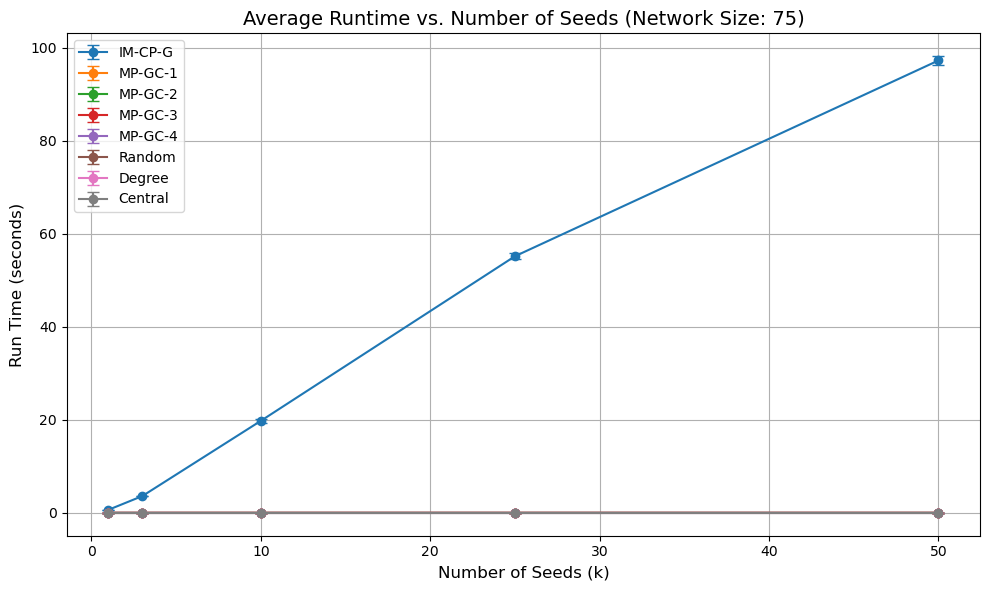

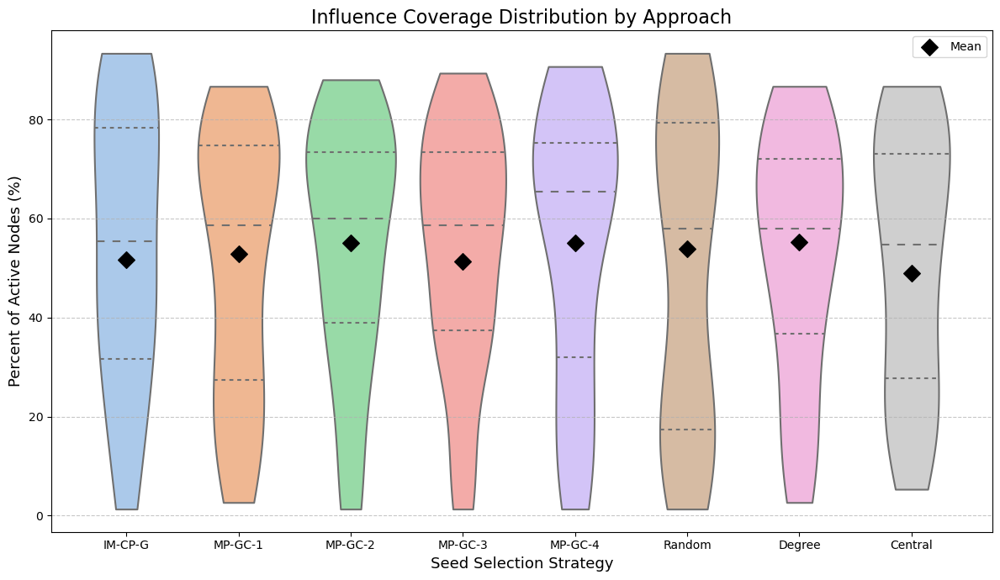

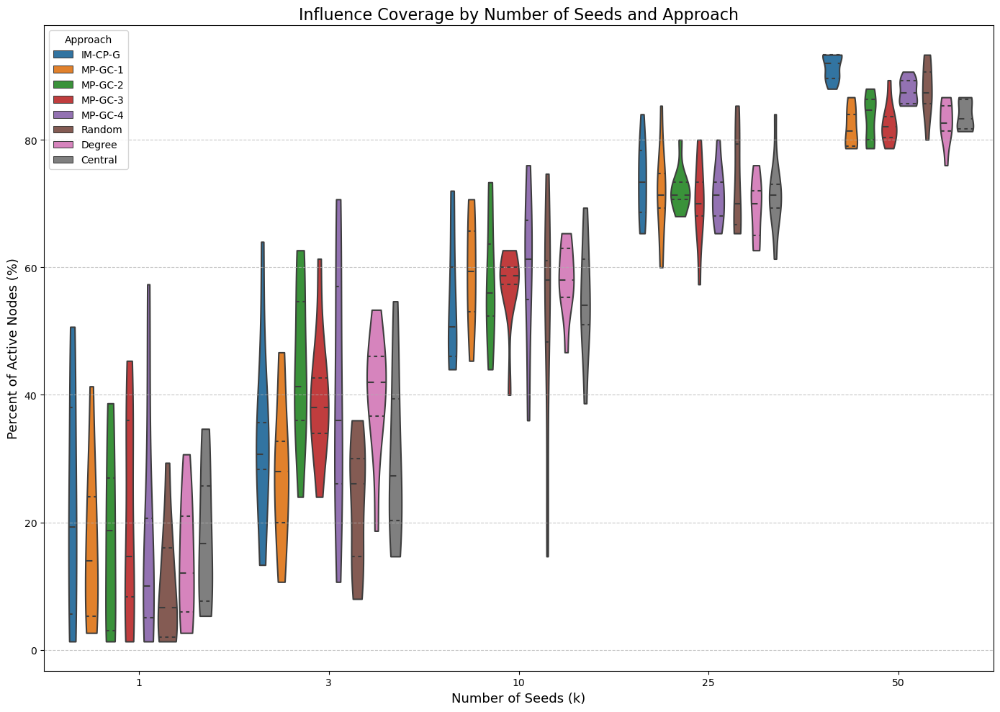

In [28]:


if __name__ == "__main__":
    size = 75  # Fixed network size
    k_values = [1, 3, 10, 25, 50]  # Different values of k to test
    graph_seed = 42
    nodes_per_cluster=25
    num_simulations = 10
    inter_connect_prob=0.01

    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central']

    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': [],
            'k_values': []
        } for approach in approaches
    }

    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")

        num_clusters = size // nodes_per_cluster
        if num_clusters == 0:
             continue

            # generate clustered BA graph
        G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      
        activation_probabilities = {}
        for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1

        for k in k_values:
            print(f"\n=== Number of Seeds: {k} ===")

            def run_and_record(approach, seeds, elapsed):
                final_active = independent_cascade(G, seeds, activation_probabilities)
                all_results[approach]['run_times'].append(elapsed)
                all_results[approach]['active_counts'].append(len(final_active))
                all_results[approach]['percent_active'].append(100 * len(final_active) / size)
                all_results[approach]['k_values'].append(k)

            # Each strategy
            start = time.time(); seeds = find_optimal_seeds(G, k, activation_probabilities); elapsed = time.time() - start
            run_and_record('IM-CP-G', seeds, elapsed)

            start = time.time(); mu1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_by_mu_1(mu1, k); elapsed = time.time() - start
            run_and_record('MP-GC-1', seeds, elapsed)

            start = time.time(); mu2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_2(G, mu2, k, threshold=0.5); elapsed = time.time() - start
            run_and_record('MP-GC-2', seeds, elapsed)

            start = time.time(); mu3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_3(G, mu3, k); elapsed = time.time() - start
            run_and_record('MP-GC-3', seeds, elapsed)



           #start = time.time(); _, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k); elapsed = time.time() - start
            #run_and_record('MP-GC-4', seeds, elapsed)
            
            start = time.time()
            #_, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            seeds = sp_result['seeds_percolation']
            elapsed = time.time() - start
            run_and_record('MP-GC-4', seeds, elapsed)

            start = time.time(); seeds = pick_random_seeds(G, k); elapsed = time.time() - start
            run_and_record('Random', seeds, elapsed)

            start = time.time(); seeds = pick_highest_degree_seeds(G, k); elapsed = time.time() - start
            run_and_record('Degree', seeds, elapsed)

            start = time.time(); seeds = pick_central_nodes(G, k); elapsed = time.time() - start
            run_and_record('Central', seeds, elapsed)

    # Convert to DataFrame
    records = []
    for approach in approaches:
        for i in range(len(all_results[approach]['k_values'])):
            records.append({
                'Approach': approach,
                'k': all_results[approach]['k_values'][i],
                'Run Time': all_results[approach]['run_times'][i],
                'Percent Active': all_results[approach]['percent_active'][i]
            })
    df = pd.DataFrame(records)

    # === Timing Graph ===
    plt.figure(figsize=(10, 6))
    for approach in approaches:
        grouped = df[df['Approach'] == approach].groupby("k")["Run Time"]
        mean = grouped.mean()
        std = grouped.std()
        plt.errorbar(mean.index, mean.values, yerr=std.values, label=approach, marker='o', capsize=4)
    plt.title(f"Average Runtime vs. Number of Seeds (Network Size: {size})", fontsize=14)
    plt.xlabel("Number of Seeds (k)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # # === Percent Active Line Plot ===
    # plt.figure(figsize=(10, 6))
    # sns.lineplot(data=df, x="k", y="Percent Active", hue="Approach", marker='o')
    # plt.title("Percent of Active Nodes vs Number of Seeds (k)", fontsize=14)
    # plt.xlabel("Number of Seeds (k)", fontsize=12)
    # plt.ylabel("Percent of Active Nodes (%)", fontsize=12)
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()

    # === Violin Plot: Percent Active by Approach (aggregated) ===
    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette="pastel",
        inner="quartile",
        cut=0
    )
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    plt.title("Influence Coverage Distribution by Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    # === Violin Plot: Percent Active by k and Approach ===
    plt.figure(figsize=(14, 10))
    sns.violinplot(
        x="k",
        y="Percent Active",
        hue="Approach",
        data=df,
        split=False,
        inner="quartile",
        palette="tab10",
        cut=0
    )
    plt.title("Influence Coverage by Number of Seeds and Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Number of Seeds (k)", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Approach", fontsize=10)
    plt.tight_layout()
    plt.show()

# vary k with custom disjoint graph


======== SIMULATION 1/10 ========
Total edges in clustered BA graph: 450

=== Number of Seeds: 1 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Number of Seeds: 3 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Number of Seeds: 10 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
C

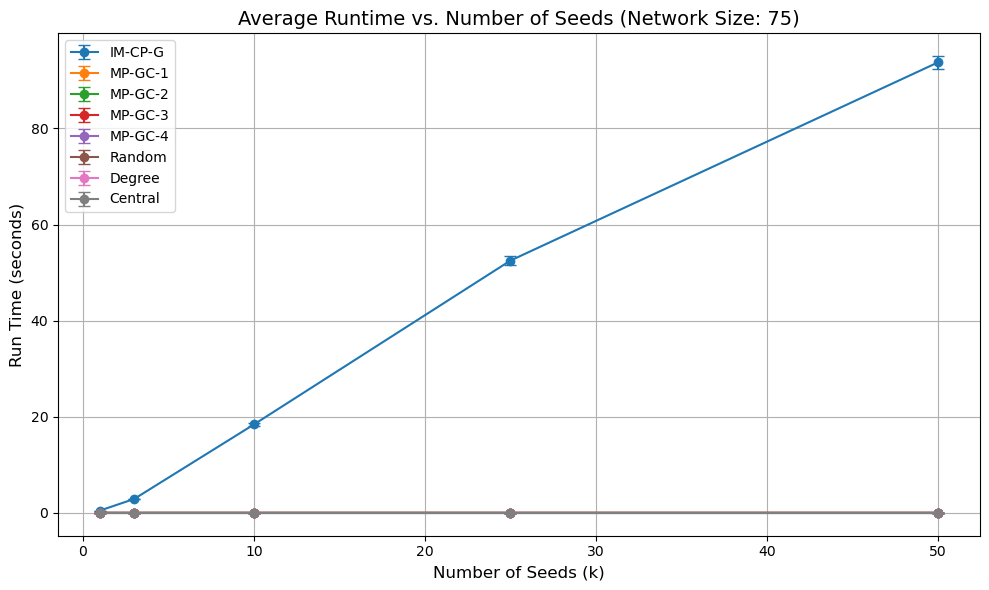

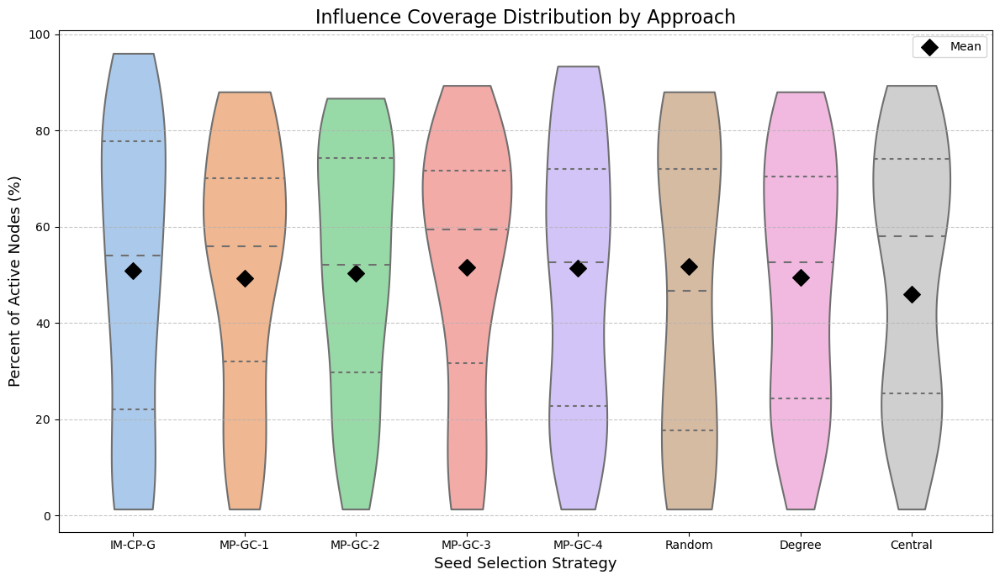

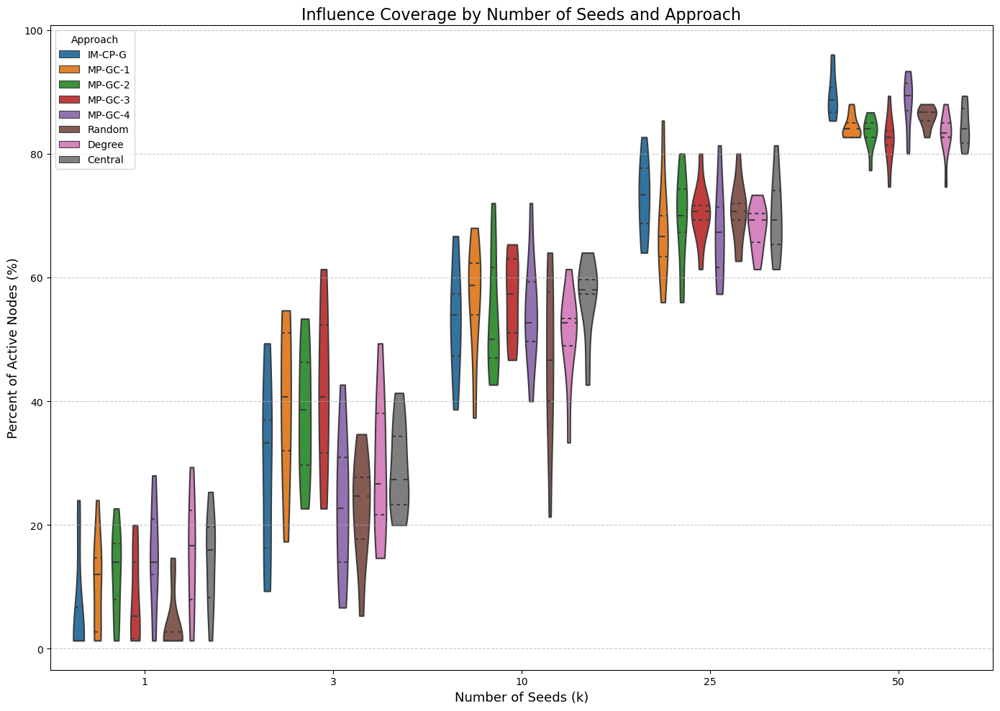

In [29]:


if __name__ == "__main__":
    size = 75  # Fixed network size
    k_values = [1, 3, 10, 25, 50]  # Different values of k to test
    graph_seed = 42
    nodes_per_cluster=25
    num_simulations = 10
    inter_connect_prob=0.00 # key here for disjoint

    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central']

    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': [],
            'k_values': []
        } for approach in approaches
    }

    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")

        num_clusters = size // nodes_per_cluster
        if num_clusters == 0:
             continue

            # generate clustered BA graph
        G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      
        activation_probabilities = {}
        for u, v in G.edges():
                activation_probabilities[(u, v)] = 0.1
                activation_probabilities[(v, u)] = 0.1

        for k in k_values:
            print(f"\n=== Number of Seeds: {k} ===")

            def run_and_record(approach, seeds, elapsed):
                final_active = independent_cascade(G, seeds, activation_probabilities)
                all_results[approach]['run_times'].append(elapsed)
                all_results[approach]['active_counts'].append(len(final_active))
                all_results[approach]['percent_active'].append(100 * len(final_active) / size)
                all_results[approach]['k_values'].append(k)

            # Each strategy
            start = time.time(); seeds = find_optimal_seeds(G, k, activation_probabilities); elapsed = time.time() - start
            run_and_record('IM-CP-G', seeds, elapsed)

            start = time.time(); mu1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_by_mu_1(mu1, k); elapsed = time.time() - start
            run_and_record('MP-GC-1', seeds, elapsed)

            start = time.time(); mu2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_2(G, mu2, k, threshold=0.5); elapsed = time.time() - start
            run_and_record('MP-GC-2', seeds, elapsed)

            start = time.time(); mu3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_3(G, mu3, k); elapsed = time.time() - start
            run_and_record('MP-GC-3', seeds, elapsed)



           #start = time.time(); _, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k); elapsed = time.time() - start
            #run_and_record('MP-GC-4', seeds, elapsed)
            
            start = time.time()
            #_, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            seeds = sp_result['seeds_percolation']
            elapsed = time.time() - start
            run_and_record('MP-GC-4', seeds, elapsed)

            start = time.time(); seeds = pick_random_seeds(G, k); elapsed = time.time() - start
            run_and_record('Random', seeds, elapsed)

            start = time.time(); seeds = pick_highest_degree_seeds(G, k); elapsed = time.time() - start
            run_and_record('Degree', seeds, elapsed)

            start = time.time(); seeds = pick_central_nodes(G, k); elapsed = time.time() - start
            run_and_record('Central', seeds, elapsed)

    # Convert to DataFrame
    records = []
    for approach in approaches:
        for i in range(len(all_results[approach]['k_values'])):
            records.append({
                'Approach': approach,
                'k': all_results[approach]['k_values'][i],
                'Run Time': all_results[approach]['run_times'][i],
                'Percent Active': all_results[approach]['percent_active'][i]
            })
    df = pd.DataFrame(records)

    # === Timing Graph ===
    plt.figure(figsize=(10, 6))
    for approach in approaches:
        grouped = df[df['Approach'] == approach].groupby("k")["Run Time"]
        mean = grouped.mean()
        std = grouped.std()
        plt.errorbar(mean.index, mean.values, yerr=std.values, label=approach, marker='o', capsize=4)
    plt.title(f"Average Runtime vs. Number of Seeds (Network Size: {size})", fontsize=14)
    plt.xlabel("Number of Seeds (k)", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # # === Percent Active Line Plot ===
    # plt.figure(figsize=(10, 6))
    # sns.lineplot(data=df, x="k", y="Percent Active", hue="Approach", marker='o')
    # plt.title("Percent of Active Nodes vs Number of Seeds (k)", fontsize=14)
    # plt.xlabel("Number of Seeds (k)", fontsize=12)
    # plt.ylabel("Percent of Active Nodes (%)", fontsize=12)
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()

    # === Violin Plot: Percent Active by Approach (aggregated) ===
    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette="pastel",
        inner="quartile",
        cut=0
    )
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    plt.title("Influence Coverage Distribution by Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    # === Violin Plot: Percent Active by k and Approach ===
    plt.figure(figsize=(14, 10))
    sns.violinplot(
        x="k",
        y="Percent Active",
        hue="Approach",
        data=df,
        split=False,
        inner="quartile",
        palette="tab10",
        cut=0
    )
    plt.title("Influence Coverage by Number of Seeds and Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Number of Seeds (k)", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Approach", fontsize=10)
    plt.tight_layout()
    plt.show()

# Varying p with stock graph


======== SIMULATION 1/10 ========

=== Activation Probability: 0.05 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.1 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.3 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.6 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Conver

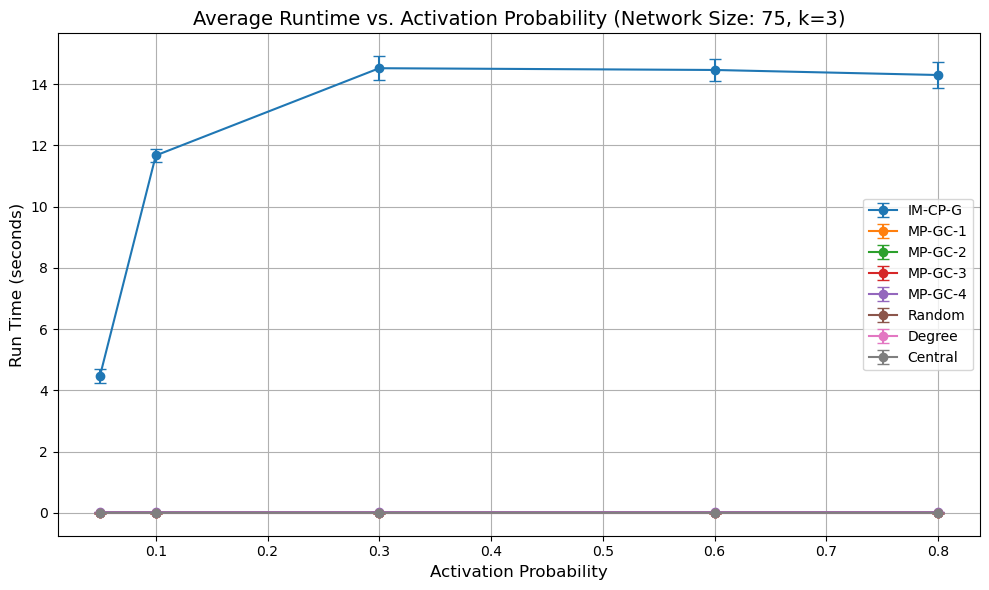

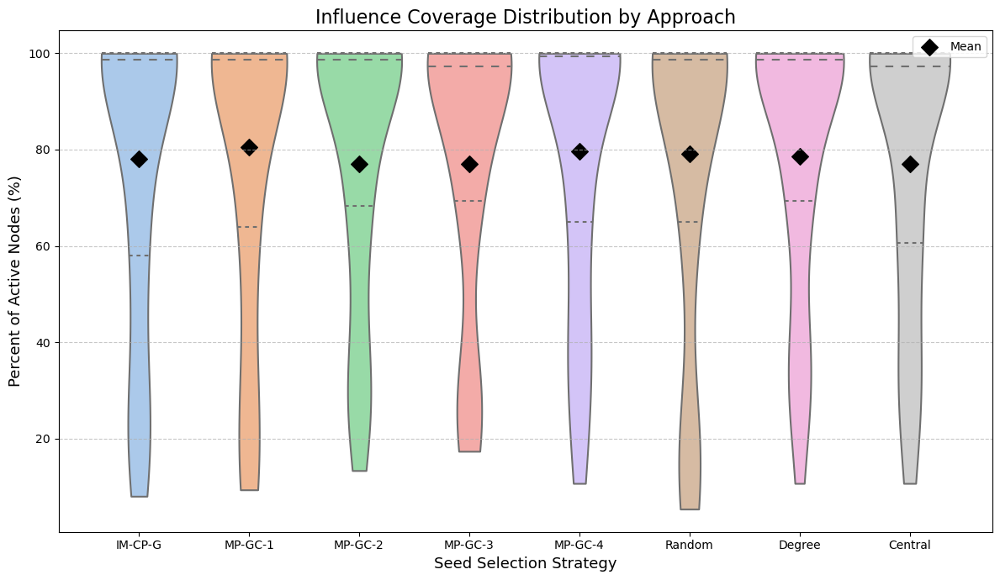

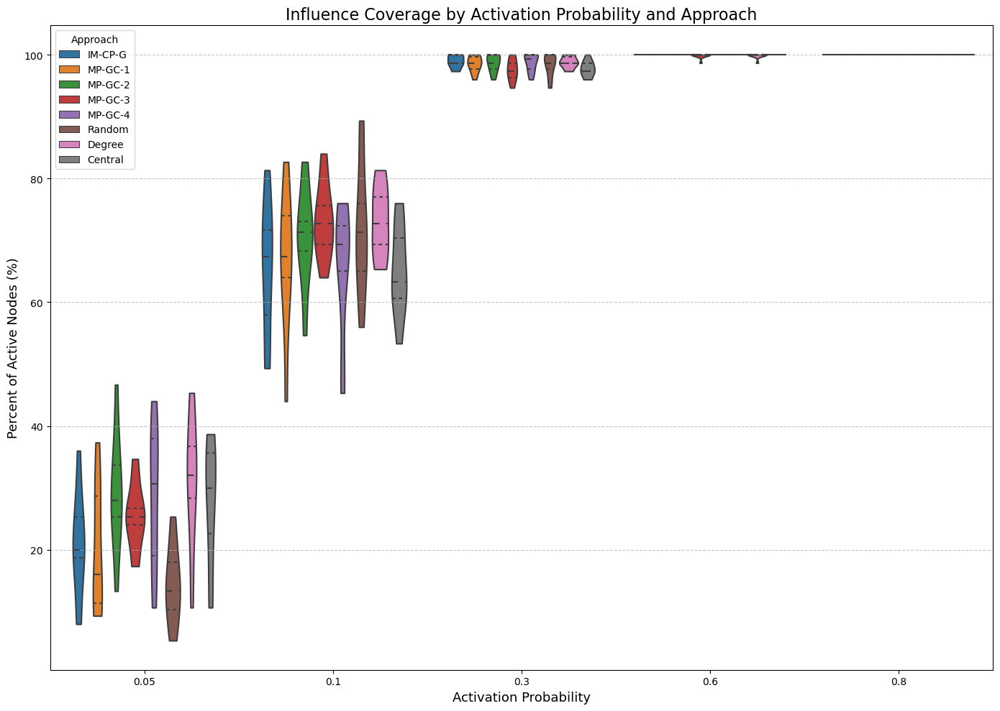

In [30]:

if __name__ == "__main__":
    size = 75  # Fixed network size
    k = 3      # Fixed number of seeds
    prob_values = [0.05, 0.1, 0.3, 0.6, 0.8 ]  # Varying probabilities
    graph_seed = 42
    num_simulations = 10

    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central']

    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': [],
            'probabilities': []
        } for approach in approaches
    }

    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")

        G = nx.barabasi_albert_graph(size, 10, seed=graph_seed)

        for prob in prob_values:
            print(f"\n=== Activation Probability: {prob} ===")
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = prob
                activation_probabilities[(v, u)] = prob

            def run_and_record(approach, seeds, elapsed):
                final_active = independent_cascade(G, seeds, activation_probabilities)
                all_results[approach]['run_times'].append(elapsed)
                all_results[approach]['active_counts'].append(len(final_active))
                all_results[approach]['percent_active'].append(100 * len(final_active) / size)
                all_results[approach]['probabilities'].append(prob)

            start = time.time(); seeds = find_optimal_seeds(G, k, activation_probabilities); elapsed = time.time() - start
            run_and_record('IM-CP-G', seeds, elapsed)

            start = time.time(); mu1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_by_mu_1(mu1, k); elapsed = time.time() - start
            run_and_record('MP-GC-1', seeds, elapsed)

            start = time.time(); mu2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_2(G, mu2, k, threshold=0.5); elapsed = time.time() - start
            run_and_record('MP-GC-2', seeds, elapsed)

            start = time.time(); mu3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_3(G, mu3, k); elapsed = time.time() - start
            run_and_record('MP-GC-3', seeds, elapsed)



            #start = time.time(); _, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k); elapsed = time.time() - start
            #run_and_record('MP-GC-4', seeds, elapsed)
            start = time.time()
            #_, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            seeds = sp_result['seeds_percolation']
            elapsed = time.time() - start
            run_and_record('MP-GC-4', seeds, elapsed)

            start = time.time(); seeds = pick_random_seeds(G, k); elapsed = time.time() - start
            run_and_record('Random', seeds, elapsed)

            start = time.time(); seeds = pick_highest_degree_seeds(G, k); elapsed = time.time() - start
            run_and_record('Degree', seeds, elapsed)

            start = time.time(); seeds = pick_central_nodes(G, k); elapsed = time.time() - start
            run_and_record('Central', seeds, elapsed)

    records = []
    for approach in approaches:
        for i in range(len(all_results[approach]['probabilities'])):
            records.append({
                'Approach': approach,
                'Probability': all_results[approach]['probabilities'][i],
                'Run Time': all_results[approach]['run_times'][i],
                'Percent Active': all_results[approach]['percent_active'][i]
            })
    df = pd.DataFrame(records)

    plt.figure(figsize=(10, 6))
    for approach in approaches:
        grouped = df[df['Approach'] == approach].groupby("Probability")["Run Time"]
        mean = grouped.mean()
        std = grouped.std()
        plt.errorbar(mean.index, mean.values, yerr=std.values, label=approach, marker='o', capsize=4)
    plt.title(f"Average Runtime vs. Activation Probability (Network Size: {size}, k={k})", fontsize=14)
    plt.xlabel("Activation Probability", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette="pastel",
        inner="quartile",
        cut=0
    )
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    plt.title("Influence Coverage Distribution by Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 10))
    sns.violinplot(
        x="Probability",
        y="Percent Active",
        hue="Approach",
        data=df,
        split=False,
        inner="quartile",
        palette="tab10",
        cut=0
    )
    plt.title("Influence Coverage by Activation Probability and Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Activation Probability", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Approach", fontsize=10)
    plt.tight_layout()
    plt.show()


# Varying p with customn graph


======== SIMULATION 1/10 ========
Total edges in clustered BA graph: 468

=== Activation Probability: 0.05 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.1 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.3 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.6 ===
Converged after 2 iterations.
Converged after 2 iteration

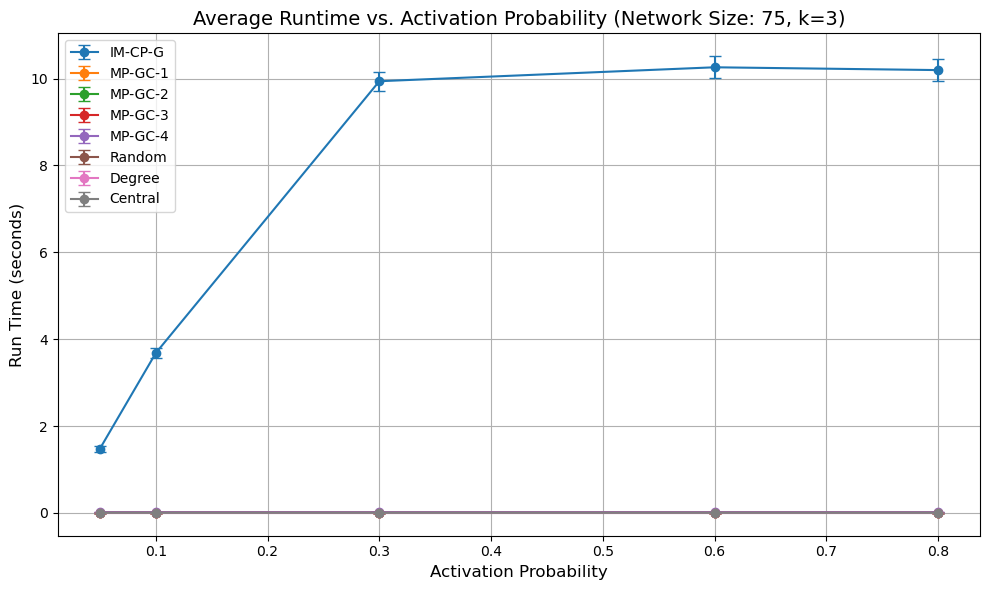

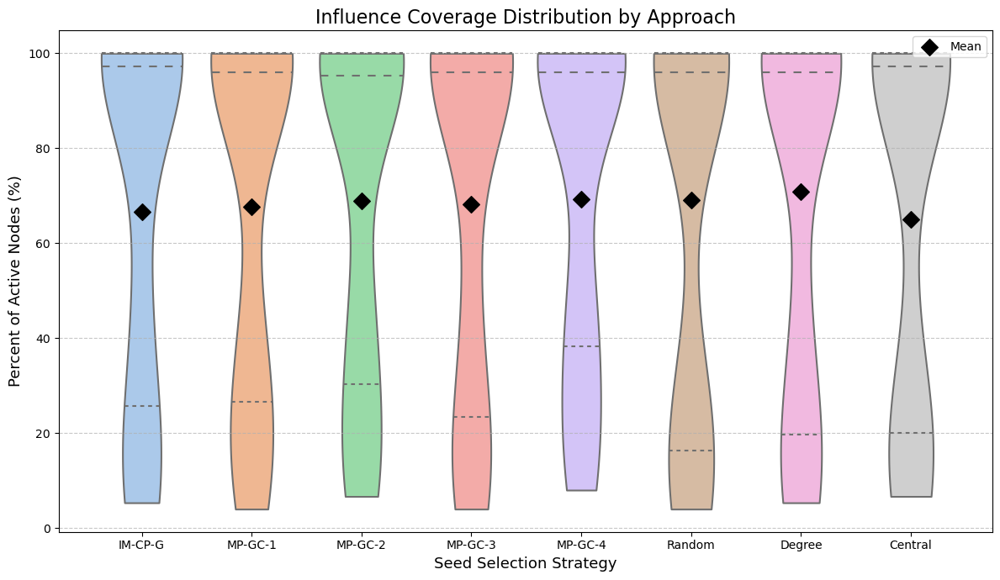

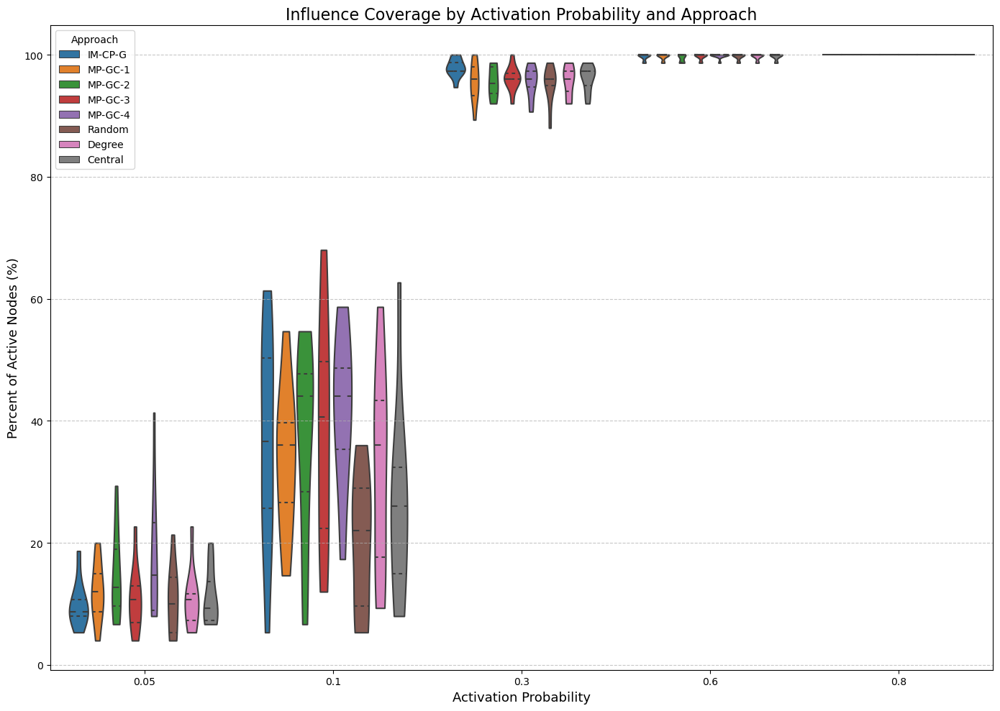

In [31]:


if __name__ == "__main__":
    size = 75  # Fixed network size
    k = 3      # Fixed number of seeds
    prob_values = [0.05, 0.1, 0.3, 0.6, 0.8 ]  # Varying probabilities
    graph_seed = 42
    nodes_per_cluster=25
    num_simulations = 10
    inter_connect_prob=0.01

    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central']

    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': [],
            'probabilities': []
        } for approach in approaches
    }

    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        num_clusters = size // nodes_per_cluster
        if num_clusters == 0:
             continue

            # generate clustered BA graph
        G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      

        for prob in prob_values:
            print(f"\n=== Activation Probability: {prob} ===")
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = prob
                activation_probabilities[(v, u)] = prob

            def run_and_record(approach, seeds, elapsed):
                final_active = independent_cascade(G, seeds, activation_probabilities)
                all_results[approach]['run_times'].append(elapsed)
                all_results[approach]['active_counts'].append(len(final_active))
                all_results[approach]['percent_active'].append(100 * len(final_active) / size)
                all_results[approach]['probabilities'].append(prob)

            start = time.time(); seeds = find_optimal_seeds(G, k, activation_probabilities); elapsed = time.time() - start
            run_and_record('IM-CP-G', seeds, elapsed)

            start = time.time(); mu1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_by_mu_1(mu1, k); elapsed = time.time() - start
            run_and_record('MP-GC-1', seeds, elapsed)

            start = time.time(); mu2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_2(G, mu2, k, threshold=0.5); elapsed = time.time() - start
            run_and_record('MP-GC-2', seeds, elapsed)

            start = time.time(); mu3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_3(G, mu3, k); elapsed = time.time() - start
            run_and_record('MP-GC-3', seeds, elapsed)


           # start = time.time(); _, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k); elapsed = time.time() - start
            #run_and_record('MP-GC-4', seeds, elapsed)
            start = time.time()
            #_, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            seeds = sp_result['seeds_percolation']
            elapsed = time.time() - start
            run_and_record('MP-GC-4', seeds, elapsed)

            start = time.time(); seeds = pick_random_seeds(G, k); elapsed = time.time() - start
            run_and_record('Random', seeds, elapsed)

            start = time.time(); seeds = pick_highest_degree_seeds(G, k); elapsed = time.time() - start
            run_and_record('Degree', seeds, elapsed)

            start = time.time(); seeds = pick_central_nodes(G, k); elapsed = time.time() - start
            run_and_record('Central', seeds, elapsed)

    records = []
    for approach in approaches:
        for i in range(len(all_results[approach]['probabilities'])):
            records.append({
                'Approach': approach,
                'Probability': all_results[approach]['probabilities'][i],
                'Run Time': all_results[approach]['run_times'][i],
                'Percent Active': all_results[approach]['percent_active'][i]
            })
    df = pd.DataFrame(records)

    plt.figure(figsize=(10, 6))
    for approach in approaches:
        grouped = df[df['Approach'] == approach].groupby("Probability")["Run Time"]
        mean = grouped.mean()
        std = grouped.std()
        plt.errorbar(mean.index, mean.values, yerr=std.values, label=approach, marker='o', capsize=4)
    plt.title(f"Average Runtime vs. Activation Probability (Network Size: {size}, k={k})", fontsize=14)
    plt.xlabel("Activation Probability", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette="pastel",
        inner="quartile",
        cut=0
    )
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    plt.title("Influence Coverage Distribution by Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 10))
    sns.violinplot(
        x="Probability",
        y="Percent Active",
        hue="Approach",
        data=df,
        split=False,
        inner="quartile",
        palette="tab10",
        cut=0
    )
    plt.title("Influence Coverage by Activation Probability and Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Activation Probability", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Approach", fontsize=10)
    plt.tight_layout()
    plt.show()


# varying p with custom disjoint cluster graph


======== SIMULATION 1/10 ========
Total edges in clustered BA graph: 450

=== Activation Probability: 0.05 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.1 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.3 ===
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.

=== Activation Probability: 0.6 ===
Converged after 2 iterations.
Converged after 2 iteration

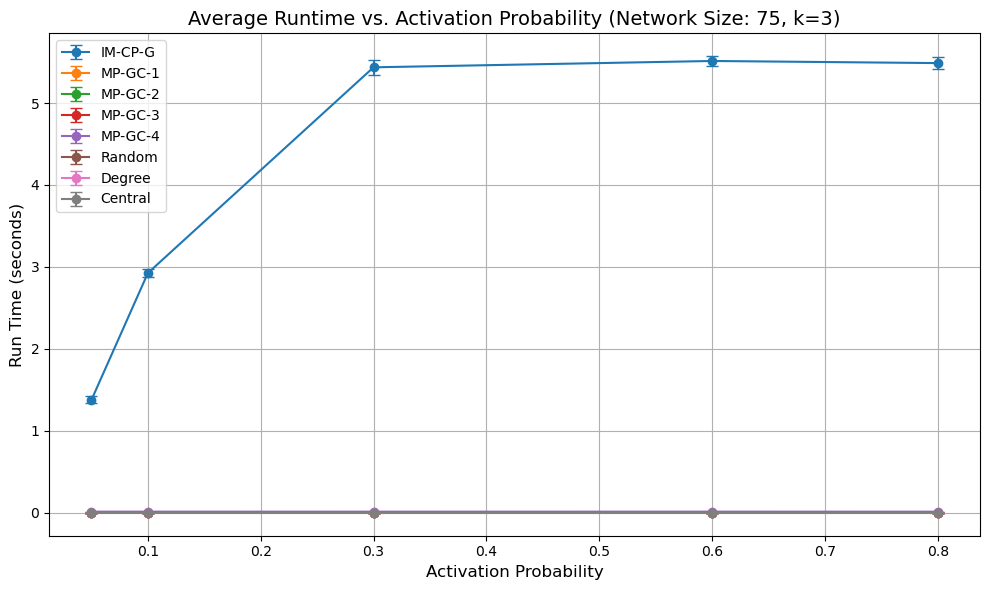

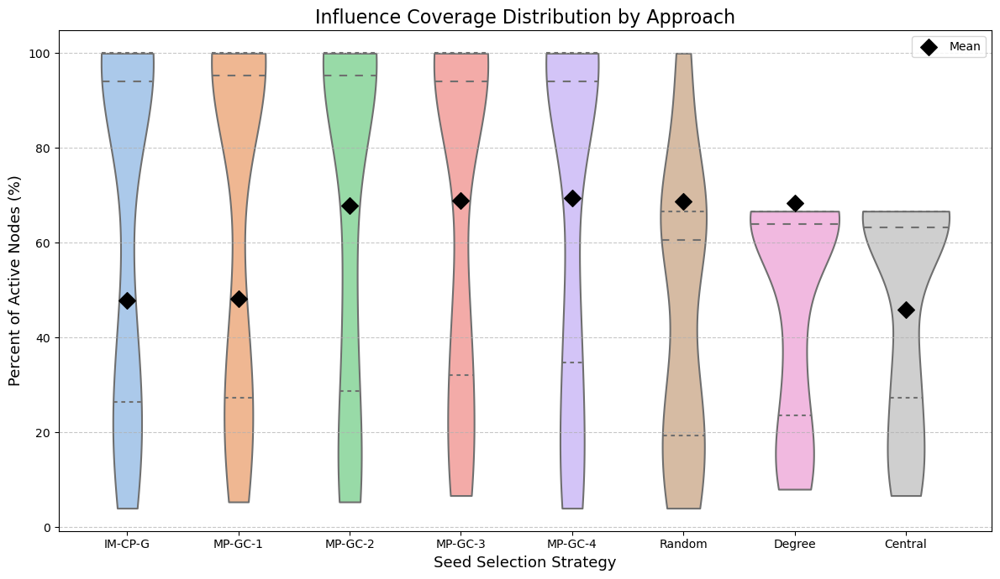

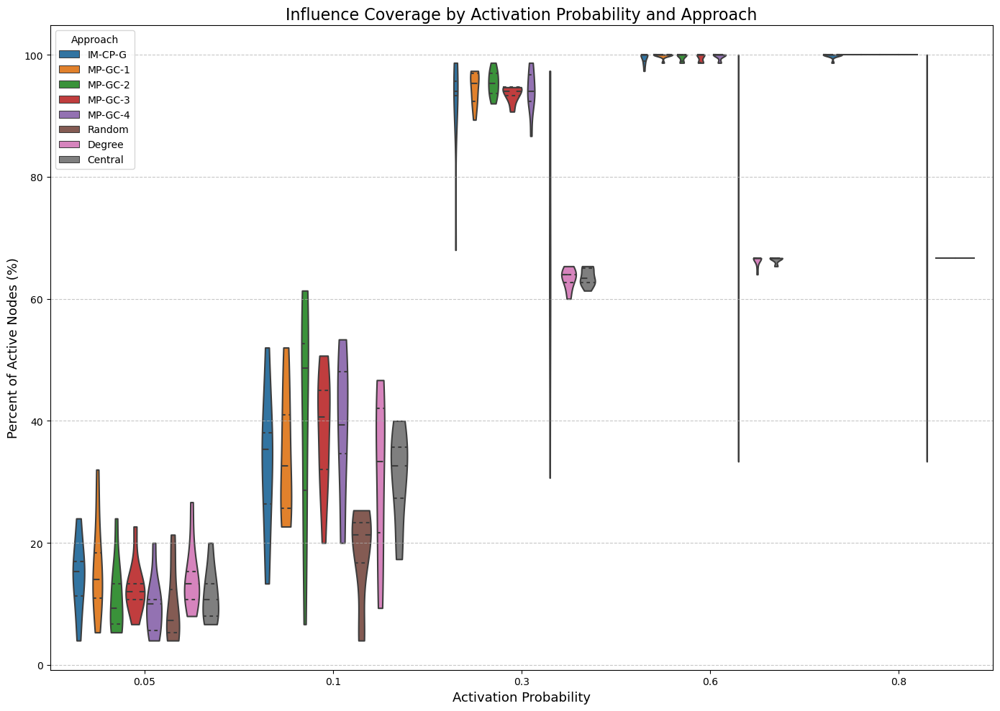

In [32]:


if __name__ == "__main__":
    size = 75  # Fixed network size
    k = 3      # Fixed number of seeds
    prob_values = [0.05, 0.1, 0.3, 0.6, 0.8 ]  # Varying probabilities
    graph_seed = 42
    nodes_per_cluster=25
    num_simulations = 10
    inter_connect_prob=0.00 # key here

    approaches = ['IM-CP-G', 'MP-GC-1', 'MP-GC-2', 'MP-GC-3', 'MP-GC-4', 'Random', 'Degree', 'Central']

    all_results = {
        approach: {
            'run_times': [],
            'active_counts': [],
            'percent_active': [],
            'probabilities': []
        } for approach in approaches
    }

    for sim in range(num_simulations):
        print(f"\n======== SIMULATION {sim+1}/{num_simulations} ========")
        
        num_clusters = size // nodes_per_cluster
        if num_clusters == 0:
             continue

            # generate clustered BA graph
        G = generate_clustered_ba_graph(
                num_clusters=num_clusters,
                nodes_per_cluster=nodes_per_cluster,
                m=10,
                inter_connect_prob=inter_connect_prob,
                seed=seed
            )      

        for prob in prob_values:
            print(f"\n=== Activation Probability: {prob} ===")
            activation_probabilities = {}
            for u, v in G.edges():
                activation_probabilities[(u, v)] = prob
                activation_probabilities[(v, u)] = prob

            def run_and_record(approach, seeds, elapsed):
                final_active = independent_cascade(G, seeds, activation_probabilities)
                all_results[approach]['run_times'].append(elapsed)
                all_results[approach]['active_counts'].append(len(final_active))
                all_results[approach]['percent_active'].append(100 * len(final_active) / size)
                all_results[approach]['probabilities'].append(prob)

            start = time.time(); seeds = find_optimal_seeds(G, k, activation_probabilities); elapsed = time.time() - start
            run_and_record('IM-CP-G', seeds, elapsed)

            start = time.time(); mu1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_by_mu_1(mu1, k); elapsed = time.time() - start
            run_and_record('MP-GC-1', seeds, elapsed)

            start = time.time(); mu2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_2(G, mu2, k, threshold=0.5); elapsed = time.time() - start
            run_and_record('MP-GC-2', seeds, elapsed)

            start = time.time(); mu3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
            seeds = pick_seeds_across_components_3(G, mu3, k); elapsed = time.time() - start
            run_and_record('MP-GC-3', seeds, elapsed)


           # start = time.time(); _, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k); elapsed = time.time() - start
            #run_and_record('MP-GC-4', seeds, elapsed)
            start = time.time()
            #_, _, seeds = compute_percolation_within_clusters(G, activation_probabilities, k)
            sp_result = select_seeds_spectral_percolation(G, activation_probabilities, k)
            seeds = sp_result['seeds_percolation']
            elapsed = time.time() - start
            run_and_record('MP-GC-4', seeds, elapsed)

            start = time.time(); seeds = pick_random_seeds(G, k); elapsed = time.time() - start
            run_and_record('Random', seeds, elapsed)

            start = time.time(); seeds = pick_highest_degree_seeds(G, k); elapsed = time.time() - start
            run_and_record('Degree', seeds, elapsed)

            start = time.time(); seeds = pick_central_nodes(G, k); elapsed = time.time() - start
            run_and_record('Central', seeds, elapsed)

    records = []
    for approach in approaches:
        for i in range(len(all_results[approach]['probabilities'])):
            records.append({
                'Approach': approach,
                'Probability': all_results[approach]['probabilities'][i],
                'Run Time': all_results[approach]['run_times'][i],
                'Percent Active': all_results[approach]['percent_active'][i]
            })
    df = pd.DataFrame(records)

    plt.figure(figsize=(10, 6))
    for approach in approaches:
        grouped = df[df['Approach'] == approach].groupby("Probability")["Run Time"]
        mean = grouped.mean()
        std = grouped.std()
        plt.errorbar(mean.index, mean.values, yerr=std.values, label=approach, marker='o', capsize=4)
    plt.title(f"Average Runtime vs. Activation Probability (Network Size: {size}, k={k})", fontsize=14)
    plt.xlabel("Activation Probability", fontsize=12)
    plt.ylabel("Run Time (seconds)", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 7))
    sns.violinplot(
        x="Approach",
        y="Percent Active",
        data=df,
        palette="pastel",
        inner="quartile",
        cut=0
    )
    group_means = df.groupby('Approach')['Percent Active'].mean()
    x_positions = range(len(group_means))
    plt.scatter(x_positions, group_means.values, color='black', marker='D', s=100, label='Mean')
    plt.title("Influence Coverage Distribution by Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Seed Selection Strategy", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 10))
    sns.violinplot(
        x="Probability",
        y="Percent Active",
        hue="Approach",
        data=df,
        split=False,
        inner="quartile",
        palette="tab10",
        cut=0
    )
    plt.title("Influence Coverage by Activation Probability and Approach", fontsize=16)
    plt.ylabel("Percent of Active Nodes (%)", fontsize=13)
    plt.xlabel("Activation Probability", fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Approach", fontsize=10)
    plt.tight_layout()
    plt.show()


# Simplified Timing Head to Head

Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged 

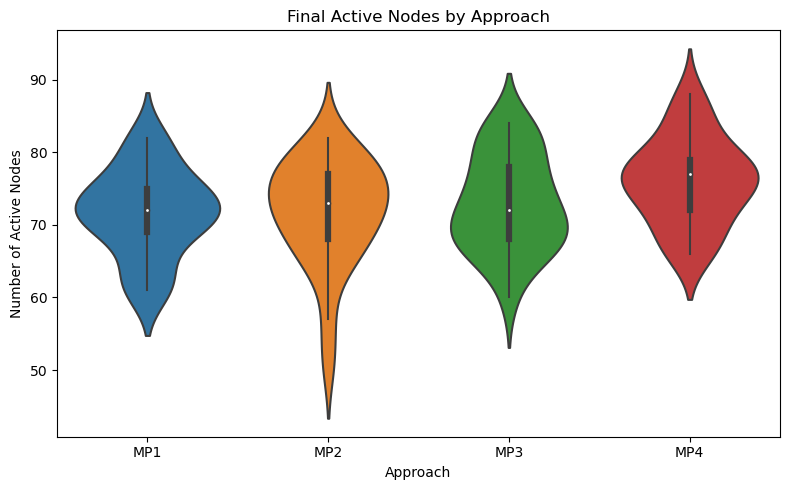

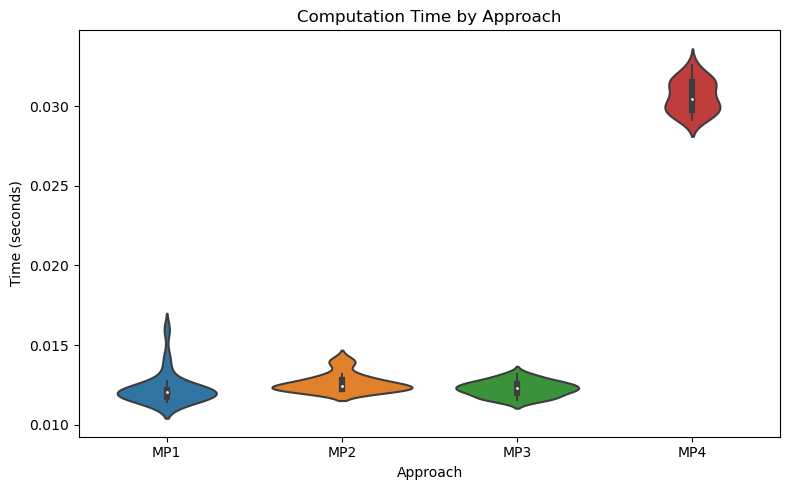

In [33]:
if __name__ == "__main__":
    k=10
    num_simulations = 25
    size=100
    
    #results
    times_mp1 = []
    performance_mp1 = []
    times_mp2 = []
    performance_mp2 = []
    times_mp3 = []
    performance_mp3 = []
    times_mp4 = []
    performance_mp4 = []
    
    for i in range(num_simulations):
        G = nx.barabasi_albert_graph(size, 10, seed=42)
        # set at 0.1
        activation_probabilities = {}
        for u, v in G.edges():
            activation_probabilities[(u, v)] = 0.1
            activation_probabilities[(v, u)] = 0.1
    

        # approach 1
        start_time_mp_1 = time.time()
        mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
        mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
        elapsed_time_mp_1 = time.time() - start_time_mp_1
        final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
        # add results
        times_mp1.append(elapsed_time_mp_1)
        performance_mp1.append(len(final_active_nodes_mp_1))
        
        
        # approach 2
        start_time_mp_2 = time.time()
        mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
        mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k)
        elapsed_time_mp_2 = time.time() - start_time_mp_2
        final_active_nodes_mp_2 = independent_cascade(G, mp_seeds_2, activation_probabilities)
        # add results 
        times_mp2.append(elapsed_time_mp_2)
        performance_mp2.append(len(final_active_nodes_mp_2))
        
        
        
        
        
        # approach 3
        start_time_mp_3 = time.time()
        mu_values_3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
        mp_seeds_3 = pick_seeds_across_components_3(G, mu_values_3, k)
        elapsed_time_mp_3 = time.time() - start_time_mp_3
        final_active_nodes_mp_3 = independent_cascade(G, mp_seeds_3, activation_probabilities)
        # add results
        times_mp3.append(elapsed_time_mp_3)
        performance_mp3.append(len(final_active_nodes_mp_3))
        
        
        
        
        # approach 4
        start_time_mp_4= time.time()
        resulsts_mp4=select_seeds_spectral_percolation(G, activation_probabilities, k)
        seeds_mp_4 = resulsts_mp4['seeds_percolation']
        elapsed_time_mp_4 = time.time() - start_time_mp_4
        final_active_nodes_mp_4 = independent_cascade(G, seeds_mp_4, activation_probabilities)
        # add results: 
        times_mp4.append(elapsed_time_mp_4)
        performance_mp4.append(len(final_active_nodes_mp_4))

    # Prepare performance data for violin plot
    performance_data = {
        "Approach": ["MP1"] * num_simulations + ["MP2"] * num_simulations+ ["MP3"] * num_simulations + ["MP4"] * num_simulations,
        "Active Nodes": performance_mp1 + performance_mp2+performance_mp3+performance_mp4
    }
    df_perf = pd.DataFrame(performance_data)

    plt.figure(figsize=(8, 5))
    sns.violinplot(x="Approach", y="Active Nodes", data=df_perf, inner="box")
    plt.title("Final Active Nodes by Approach")
    plt.ylabel("Number of Active Nodes")
    plt.xlabel("Approach")
    plt.tight_layout()
    plt.show()
    
    # Prepare time data for violin plot
    time_data = {
    "Approach": ["MP1"] * num_simulations + ["MP2"] * num_simulations+ ["MP3"] * num_simulations + ["MP4"] * num_simulations,
    "Time (s)": times_mp1 + times_mp2+times_mp3+times_mp4
    }
    df_time = pd.DataFrame(time_data)

    plt.figure(figsize=(8, 5))
    sns.violinplot(x="Approach", y="Time (s)", data=df_time, inner="box")
    plt.title("Computation Time by Approach")
    plt.ylabel("Time (seconds)")
    plt.xlabel("Approach")
    plt.tight_layout()
    plt.show()

Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged after 2 iterations.
Converged 

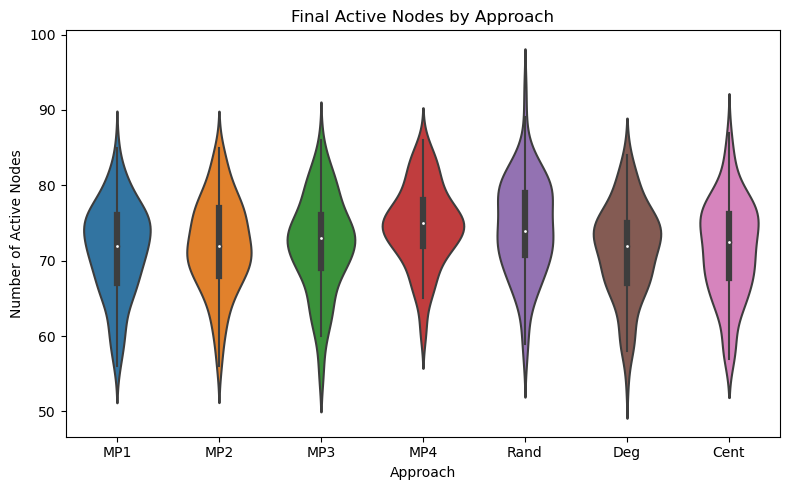

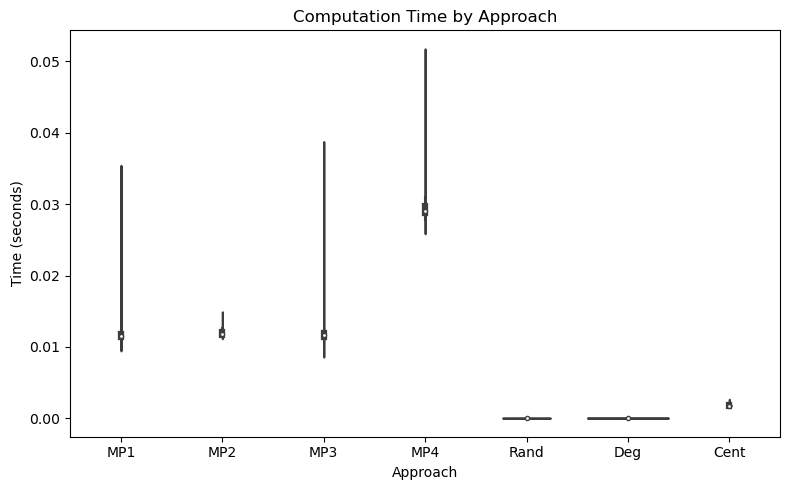

In [15]:
if __name__ == "__main__":
    k=10
    num_simulations = 100
    size=100
    
    #results
    times_mp1 = []
    performance_mp1 = []
    times_mp2 = []
    performance_mp2 = []
    times_mp3 = []
    performance_mp3 = []
    times_mp4 = []
    performance_mp4 = []
    times_deg = []
    performance_deg = []
    times_rand = []
    performance_rand = []
    times_cent = []
    performance_cent = []
    
    
    for i in range(num_simulations):
        G = nx.barabasi_albert_graph(size, 10, seed=42)
        # set at 0.1
        activation_probabilities = {}
        for u, v in G.edges():
            activation_probabilities[(u, v)] = 0.1
            activation_probabilities[(v, u)] = 0.1
    

        # approach 1
        start_time_mp_1 = time.time()
        mu_values_1 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
        mp_seeds_1 = pick_seeds_by_mu_1(mu_values_1, k)
        elapsed_time_mp_1 = time.time() - start_time_mp_1
        final_active_nodes_mp_1 = independent_cascade(G, mp_seeds_1, activation_probabilities)
        # add results
        times_mp1.append(elapsed_time_mp_1)
        performance_mp1.append(len(final_active_nodes_mp_1))
        
        
        # approach 2
        start_time_mp_2 = time.time()
        mu_values_2 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
        mp_seeds_2 = pick_seeds_across_components_2(G, mu_values_2, k)
        elapsed_time_mp_2 = time.time() - start_time_mp_2
        final_active_nodes_mp_2 = independent_cascade(G, mp_seeds_2, activation_probabilities)
        # add results 
        times_mp2.append(elapsed_time_mp_2)
        performance_mp2.append(len(final_active_nodes_mp_2))
        
        
        
        
        
        # approach 3
        start_time_mp_3 = time.time()
        mu_values_3 = compute_not_in_giant_component_probabilities(G, activation_probabilities)
        mp_seeds_3 = pick_seeds_across_components_3(G, mu_values_3, k)
        elapsed_time_mp_3 = time.time() - start_time_mp_3
        final_active_nodes_mp_3 = independent_cascade(G, mp_seeds_3, activation_probabilities)
        # add results
        times_mp3.append(elapsed_time_mp_3)
        performance_mp3.append(len(final_active_nodes_mp_3))
        
        
        
        
        # approach 4
        start_time_mp_4= time.time()
        resulsts_mp4=select_seeds_spectral_percolation(G, activation_probabilities, k)
        seeds_mp_4 = resulsts_mp4['seeds_percolation']
        elapsed_time_mp_4 = time.time() - start_time_mp_4
        final_active_nodes_mp_4 = independent_cascade(G, seeds_mp_4, activation_probabilities)
        # add results: 
        times_mp4.append(elapsed_time_mp_4)
        performance_mp4.append(len(final_active_nodes_mp_4))
        
        
        # random
        start_time_rand = time.time()
        random_seeds = pick_random_seeds(G, k)
        elapsed_time_rand = time.time() - start_time_rand
        final_active_nodes_rand = independent_cascade(G, random_seeds, activation_probabilities)
        times_rand.append(elapsed_time_rand)
        performance_rand.append(len(final_active_nodes_rand))
        
        # degree
        start_time_degree = time.time()
        degree_seeds = pick_highest_degree_seeds(G, k)
        elapsed_time_degree = time.time() - start_time_degree
        final_active_nodes_degree = independent_cascade(G, degree_seeds, activation_probabilities)
        times_deg.append(elapsed_time_degree)
        performance_deg.append(len(final_active_nodes_degree))
        
        # central
        start_time_central = time.time()
        central_seeds = pick_central_nodes(G, k)
        elapsed_time_central = time.time() - start_time_central
        final_active_nodes_central = independent_cascade(G, central_seeds, activation_probabilities)
        times_cent.append(elapsed_time_central)
        performance_cent.append(len(final_active_nodes_central))

    # Prepare performance data for violin plot
    performance_data = {
        "Approach": ["MP1"] * num_simulations + ["MP2"] * num_simulations + 
            ["MP3"] * num_simulations + ["MP4"] * num_simulations +
            ["Rand"] * num_simulations + ["Deg"] * num_simulations + ["Cent"] * num_simulations,
        "Active Nodes": performance_mp1 + performance_mp2+performance_mp3+performance_mp4+performance_rand+performance_deg+performance_cent
    }
    df_perf = pd.DataFrame(performance_data)

    plt.figure(figsize=(8, 5))
    sns.violinplot(x="Approach", y="Active Nodes", data=df_perf, inner="box")
    plt.title("Final Active Nodes by Approach")
    plt.ylabel("Number of Active Nodes")
    plt.xlabel("Approach")
    plt.tight_layout()
    plt.show()
    
    # Prepare time data for violin plot
    time_data = {
    "Approach": ["MP1"] * num_simulations + ["MP2"] * num_simulations+ ["MP3"] * num_simulations + ["MP4"] * num_simulations +["Rand"] * num_simulations+["Deg"] * num_simulations+["Cent"] * num_simulations,
    "Time (s)": times_mp1 + times_mp2+times_mp3+times_mp4+times_rand+times_deg+times_cent
    }
    df_time = pd.DataFrame(time_data)

    plt.figure(figsize=(8, 5))
    sns.violinplot(x="Approach", y="Time (s)", data=df_time, inner="box")
    plt.title("Computation Time by Approach")
    plt.ylabel("Time (seconds)")
    plt.xlabel("Approach")
    plt.tight_layout()
    plt.show()